<a href="https://colab.research.google.com/github/zhangcun-yan/Traffic-safty-analyses-modeling/blob/master/Traffic_conflict_analysis_modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data_meraging and Data processing

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
!ls "/content/drive/MyDrive/Colab Notebooks/Traffic_Conflict/dataset/Orginal/trajectory/"

LC_AM_C0004_Trajectory.csv  LC_AM_C0009_Trajectory.csv
LC_AM_C0006_Trajectory.csv  LC_PM_C0004_Trajectory.csv
LC_AM_C0007_Trajectory.csv  LC_PM_C0005_Trajectory.csv
LC_AM_C0008_Trajectory.csv  LC_PM_C0006_Trajectory.csv


### This objective of this function is switch the format of the table.

In [28]:
# vehicle_ID ，vehicle_type,  x , y, speed, tan_acc, lat_acc, time
def Data_format_switch(data_path):
    ult_res = {}
    # data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/Orginal/C0008.csv'
    data1 = pd.read_csv(data_path) # 读取csv文件
    veh_ID_list = []
    veh_type_list = []
    veh_x_list = []
    veh_y_list = []
    veh_speed_list = []
    veh_tan_acc_list = []
    veh_lat_acc_list = []
    veh_time_list = []
    for i in range(len(data1)):
        str_res = data1.iloc[i][0] # 获取每一行的字符串结果
        ls = str_res.split(";") # 将字符串分割成列表
        vehicle_ID = ls[0]
        vehicle_type = ls[1]
        vehicle_trajectory = ls[10:] # 此列表为一维数组
        vehicle_trajectory = [vehicle_trajectory[j:j+6] for j in range(0,len(vehicle_trajectory)-1,6)] # 通过列表推导式将一维数组转换为二维数组
        vehicle_trajectory = np.array(vehicle_trajectory) # 转换为numpy数组形式，便于利用转置功能
        vehicle_trajectory_T = vehicle_trajectory.T # 将二维数组vehicle_trajectory进行转置，便于获取x, y, speed, tan_acc, lat_acc, time的属性值
        ls_x = vehicle_trajectory_T[0]
        ls_x = [np.float64(m) for m in ls_x] # 将字符串转换为数字
        ls_y = vehicle_trajectory_T[1]
        ls_y = [np.float64(m) for m in ls_y]
        ls_speed = vehicle_trajectory_T[2]
        ls_speed = [np.float64(m) for m in ls_speed]
        ls_tan_acc = vehicle_trajectory_T[3]
        ls_tan_acc = [np.float64(m) for m in ls_tan_acc]
        ls_lat_acc = vehicle_trajectory_T[4]
        ls_lat_acc = [np.float64(m) for m in ls_lat_acc]
        ls_time = vehicle_trajectory_T[5]
        ls_time = [np.float64(m) for m in ls_time]
        vehicle_ID_ls = [vehicle_ID]*len(ls_time)
        vehicle_type_ls = [vehicle_type]*len(ls_time)
        veh_ID_list= veh_ID_list + vehicle_ID_ls
        veh_type_list = veh_type_list + vehicle_type_ls
        veh_x_list = veh_x_list + ls_x
        veh_y_list = veh_y_list + ls_y
        veh_speed_list = veh_speed_list + ls_speed
        veh_tan_acc_list = veh_tan_acc_list + ls_tan_acc
        veh_lat_acc_list = veh_lat_acc_list + ls_lat_acc
        veh_time_list = veh_time_list + ls_time
    ult_res['vehicle_id'] = veh_ID_list
    ult_res['vehicle_type'] = veh_type_list
    ult_res['frame_time'] = veh_time_list
    ult_res['world_x'] = veh_x_list
    ult_res['world_y'] = veh_y_list
    ult_res['vehicle_speed'] = veh_speed_list
    ult_res['vehicle_tan_acc'] = veh_tan_acc_list
    ult_res['vehicle_lat_acc'] = veh_lat_acc_list
    ult_res = pd.DataFrame(ult_res)
    return ult_res

In [29]:
import os
import pandas as pd
import numpy as np
path1 = "/content/drive/MyDrive/Colab Notebooks/Traffic_Conflict/dataset/Orginal/" # 输入一级文件夹地址
files1 = os.listdir(path1)           # 读入一级文件夹
path2 = path1 + '/trajectory' 
files2 = os.listdir(path2)  
# 创建一个空表格，用来填充指标值
for i in range(len(files2)):         # 遍历所有二级文件夹
    path3 = path2 +'/' +files2[i]   # 某二级文件夹的路径
    # 打开二级文件夹中的具体文件
    data_traj = Data_format_switch(path3)
    save_path = path1 + '/data_merage/Longchangroad/' + files2[i]
    data_traj.to_csv(save_path,index=False, header=True)

<ipython-input-28-56fb70c3d859>:21: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  vehicle_trajectory = np.array(vehicle_trajectory) # 转换为numpy数组形式，便于利用转置功能


ValueError: ignored

#### The code function is calculating the TTC with trajectory;
####    计算TTC指标，这里选择最为基本的TTC计算方法，带有角度的TTC计算。
####    整个代码采取分布式结构，分为主程序、功能函数
####    计算TTC时按照时间帧进行更新，逐帧逐车计算所有车辆之间TTC选择最小作为其TTC值（只考虑一种计算方法）

import the based pageackage

In [ ]:
import math
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pywt 

import the data

In [ ]:
Data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/data_merage/C0007.csv'
Original_data = pd.read_csv(Data_path)
veh_type = pd.unique(Original_data['vehicle_type'])
# delet the trajectory point out of the intersection 
Original_data = Original_data.drop(Original_data[Original_data.world_x <= -10].index)
Original_data = Original_data.drop(Original_data[Original_data.world_x >= 45].index)
Original_data = Original_data.drop(Original_data[Original_data.world_y <= -10].index)
Original_data = Original_data.drop(Original_data[Original_data.world_y >= 50].index)
# delete the pedestrian trajectory
Original_data = Original_data.drop(Original_data[Original_data.vehicle_type ==' Pedestrian'].index)
Trajectory_new = Original_data.copy()
Trajectory_new.to_csv('/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/trajectory_data/C0007.csv')

### denoise_by_wavelet

In [ ]:
#封装成函数
def sgn(num):
    if(num > 0.0):
        return 1.0
    elif(num == 0.0):
        return 0.0
    else:
        return -1.0

def wavelet_noising(new_df): 
    data = new_df
    data = data.values.T.tolist()  # 将np.ndarray()转为列表
    w = pywt.Wavelet('sym8')#选择sym8小波基
    [ca5, cd5, cd4, cd3, cd2, cd1] = pywt.wavedec(data, w, level=5)  # 5层小波分解

    length1 = len(cd1)
    length0 = len(data)

    Cd1 = np.array(cd1)
    abs_cd1 = np.abs(Cd1)
    median_cd1 = np.median(abs_cd1)
    sigma = (1.0 / 0.6745) * median_cd1
    lamda = sigma * math.sqrt(2.0 * math.log(float(length0 ), math.e))#固定阈值计算
    usecoeffs = []
    usecoeffs.append(ca5)  # 向列表末尾添加对象
    #软硬阈值折中的方法
    a = 0.5
    for k in range(length1):
        if (abs(cd1[k]) >= lamda):
            cd1[k] = sgn(cd1[k]) * (abs(cd1[k]) - a * lamda)
        else:
            cd1[k] = 0.0
    length2 = len(cd2)
    for k in range(length2):
        if (abs(cd2[k]) >= lamda):
            cd2[k] = sgn(cd2[k]) * (abs(cd2[k]) - a * lamda)
        else:
            cd2[k] = 0.0
    length3 = len(cd3)
    for k in range(length3):
        if (abs(cd3[k]) >= lamda):
            cd3[k] = sgn(cd3[k]) * (abs(cd3[k]) - a * lamda)
        else:
            cd3[k] = 0.0
    length4 = len(cd4)
    for k in range(length4):
        if (abs(cd4[k]) >= lamda):
            cd4[k] = sgn(cd4[k]) * (abs(cd4[k]) - a * lamda)
        else:
            cd4[k] = 0.0
    length5 = len(cd5)
    for k in range(length5):
        if (abs(cd5[k]) >= lamda):
            cd5[k] = sgn(cd5[k]) * (abs(cd5[k]) - a * lamda)
        else:
            cd5[k] = 0.0
    usecoeffs.append(cd5)
    usecoeffs.append(cd4)
    usecoeffs.append(cd3)
    usecoeffs.append(cd2)
    usecoeffs.append(cd1)
    recoeffs = pywt.waverec(usecoeffs, w)#信号重构
    return recoeffs

### Show map of trajectory

In [ ]:
def Trajmap(Data):
    # 设置图框大小
#     plt.Figure([2000,2000],dpi=20)
    fig = plt.figure(figsize=(10,5))   
#     sns.despine(left=True)    
    #绘制轨迹
    plt.scatter(Data['world_x'],Data['world_y'],c='red',label='Ground trajectory',s=1)
    plt.legend()
    plt.legend(loc="upper right",fontsize=12)   #设置图例字体大小
    plt.xlabel('X (m))',fontsize=14)     #设置x轴名称
    plt.legend(loc="upper right",fontsize=16)   #设置图例字体大小
    # 坐标尺
    plt.xticks(fontsize=12,rotation=0)
    plt.yticks(fontsize=12)
    # 坐标名称
    plt.rcParams.update({"font.size":16})
    plt.ylabel('Y (m)',fontsize=16)     #设置y轴名称  
    plt.grid()
    plt.show() 

def vehicle_type_dif_color(Trajectory):
  # vehicle_type = pd.unique(Trajectory['Vehicle_type'])
  #  Bicycle', ' Car', ' Motorcycle', ' Bus', ' Van', ' Light Truck',
      #  ' Tuk-Tuk'],
  Car_traj = Trajectory[Trajectory['vehicle_type'] ==' Car']
  Bike_traj = Trajectory[Trajectory['vehicle_type'] ==' Bicycle']
  Motor_traj = Trajectory[Trajectory['vehicle_type'] ==' Motorcycle']
  Bus_traj = Trajectory[Trajectory['vehicle_type'] ==' Bus']
  Van_traj = Trajectory[Trajectory['vehicle_type'] ==' Van']
  Truck_traj = Trajectory[Trajectory['vehicle_type'] ==' Light Truck']
  fig = plt.figure(figsize=(12,9))   
  # sns.despine(left=True)    
  #绘制轨迹
  plt.scatter(Car_traj['world_x'],Car_traj['world_y'],c='red',label='Car',s=0.5)
  plt.scatter(Bike_traj['world_x'],Bike_traj['world_y'],c='green',label='bike',s=0.5)
  plt.scatter(Motor_traj['world_x'],Motor_traj['world_y'],c='blue',label='E-bike',s=0.5)
  plt.scatter(Bus_traj['world_x'],Bus_traj['world_y'],c='black',label='Bus',s=0.5)
  plt.scatter(Van_traj['world_x'],Van_traj['world_y'],c='yellow',label='Van',s=0.5)
  plt.scatter(Truck_traj['world_x'],Truck_traj['world_y'],c='purple',label='Light Truck',s=0.5)

  plt.legend()
  plt.legend(loc="upper left",fontsize=5)   #设置图例字体大小
  plt.xlabel('X (m))',fontsize=16)     #设置x轴名称
  plt.legend(loc="upper right",fontsize=16)   #设置图例字体大小
  # 坐标尺
  plt.xticks(fontsize=12,rotation=0)
  plt.yticks(fontsize=12)
  # 坐标名称
  plt.rcParams.update({"font.size":16})
  plt.ylabel('Y (m)',fontsize=16)     #设置y轴名称  
  plt.grid()
  plt.show() 


# 多维轨迹显示图
# 绘制时空分布图
# the map of trajectory with three Dimension（world_x,world_y,speed）
def Stmap(data):
    # 计算车辆个数
    vehids = pd.unique(data["vehicle_id"])
    # 设置图框大小
    plt.Figure([2200,2200],dpi=1000)
    for vehid in vehids:
        # 获取第vehid辆车的轨迹
        traj_vehid = data[data.vehicle_id == vehid]
        # 获取x方向轨迹点
        x = traj_vehid['world_x']
        y = traj_vehid['world_y']
        v = traj_vehid['veh_speed']
        norm = matplotlib.colors.Normalize(vmin=0, vmax=50)
        # 绘制散点图
        ax = plt.scatter(x,y, marker = '.', s=0.01, c=v, cmap='jet_r', norm = norm)
    plt.clim(0, 25)
    plt.colorbar()
    plt.grid()
    plt.show()

In [ ]:
# 计算轨迹中的速度/加速度/加加速度
def XY(groundtraj,caompartraj):
    g_World_x = np.array(groundtraj['world_x'].astype(float))
    g_World_y = np.array(groundtraj['world_y'].astype(float))
    com_World_x = np.array(caompartraj['world_x'].astype(float))
    com_World_y = np.array(caompartraj['world_y'].astype(float))    
    return g_World_x,g_World_y,com_World_x,com_World_y

def Velocity(trajdata):
    """recalculate the velocity, the velocity contain the X_velocity and Y-velocity and the speed"""
    """定义初速度为0"""
    len_x = trajdata.shape[0]
    wordld_x = np.array(trajdata.world_x)
    wordld_y = np.array(trajdata.world_y)
    velocity_x = (wordld_x[1:len_x]-wordld_x[0:len_x-1])/0.04
    velocity_y = (wordld_y[1:len_x]-wordld_y[0:len_x-1])/0.04
    velocity_x = np.insert(velocity_x,0,0)
    velocity_y = np.insert(velocity_y,0,0)
    return velocity_x,velocity_y

def Accelection(trajdata):
    """定结束时刻的加速度为0"""
#     print(trajdata)
    len_x = trajdata.shape[0]
    velocity_x = np.array(trajdata.speed_x)
    velocity_y = np.array(trajdata.speed_y)
    accelection_x = (velocity_x[1:len_x]-velocity_x[0:len_x-1])/0.04
    accelection_y = (velocity_y[1:len_x]-velocity_y[0:len_x-1])/0.04
    accelection_x = np.insert(accelection_x,0,0)
    accelection_y = np.insert(accelection_y,0,0)
#     print(accelection_x)
    accelection_x[1] = 0
    accelection_y[1] = 0
    return accelection_x,accelection_y

def Aclculate_Jerk(trajdata):
    """计算急动度""" 
    len_x = trajdata.acc_x.shape[0]
    acc_x = np.array(trajdata.acc_x)
    acc_y = np.array(trajdata.acc_y)
    JJerk_x = (acc_x[1:len_x] - acc_x[0:(len_x-1)])/0.04
    JJerk_y = (acc_y[1:len_x] - acc_y[0:(len_x-1)])/0.04
    JJerk_x = np.insert(JJerk_x,0,0)
    JJerk_y = np.insert(JJerk_y,0,0)
    JJerk_x[2] = 0
    JJerk_y[2] = 0
    return JJerk_x,JJerk_y

### Clearning orginal trajectory

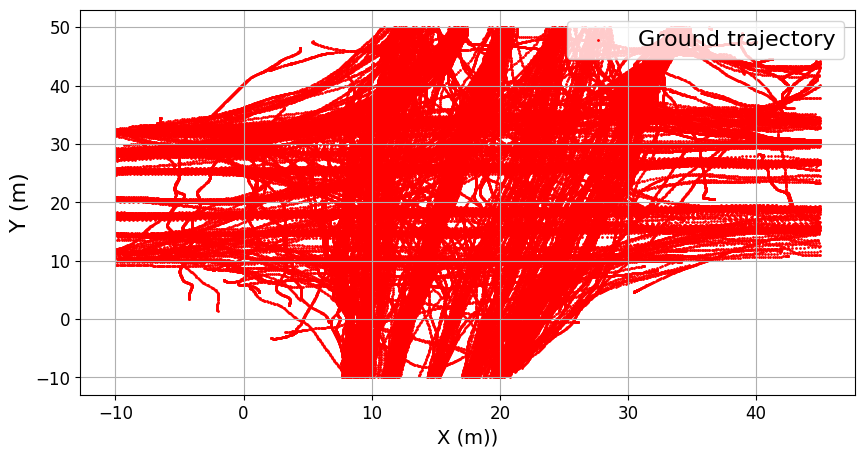

this vehicle6less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle9less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle10less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle12less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle13less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle14less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle20less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle28less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle32less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle34less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle45less than 5 second,is abnormal,should remove from the trajectory dataset.
this vehicle51less than 5 second,i

In [ ]:
data_path_traj_8 = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/trajectory_data/C0008.csv'
data_path_traj_6 = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/trajectory_data/C0006.csv'
data_path_traj_7 = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/trajectory_data/C0007.csv'

traj_data_6 = pd.read_csv(data_path_traj_6)
traj_data_7 = pd.read_csv(data_path_traj_7)
traj_data_8 = pd.read_csv(data_path_traj_8)

# Traj_data_6_7 = pd.concat([traj_data_6, traj_data_7])
# Traj_data_6_7_8 = pd.concat([Traj_data_6_7, traj_data_8])
traj_data= traj_data_8

map_trajectory = Trajmap(traj_data)
# Delete the abnormal trajectory, the time less than 2secondes and over than 5mint
veh_id_tt = pd.unique(traj_data['vehicle_id'])
for vehidd in veh_id_tt:
    traj_vehid = traj_data[traj_data['vehicle_id']==vehidd]
    if len(traj_vehid)<125:
        print('this vehicle'+str(vehidd) +'less than 5 second,is abnormal,should remove from the trajectory dataset.')
        traj_data = traj_data.drop(traj_data[traj_data.vehicle_id == vehidd].index)
    elif len(traj_vehid)>5000:
        print('this vehicle'+str(vehidd) +' more than 3.5min. is abnormal,should remove from the trajectory dataset.')
        traj_data = traj_data.drop(traj_data[traj_data.vehicle_id == vehidd].index)
# map_trajectory = Trajmap(traj_data)
Map_trajectory = pd.DataFrame(traj_data)
# Map_trajectory.to_csv('/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/clearn_data/C0008.csv')

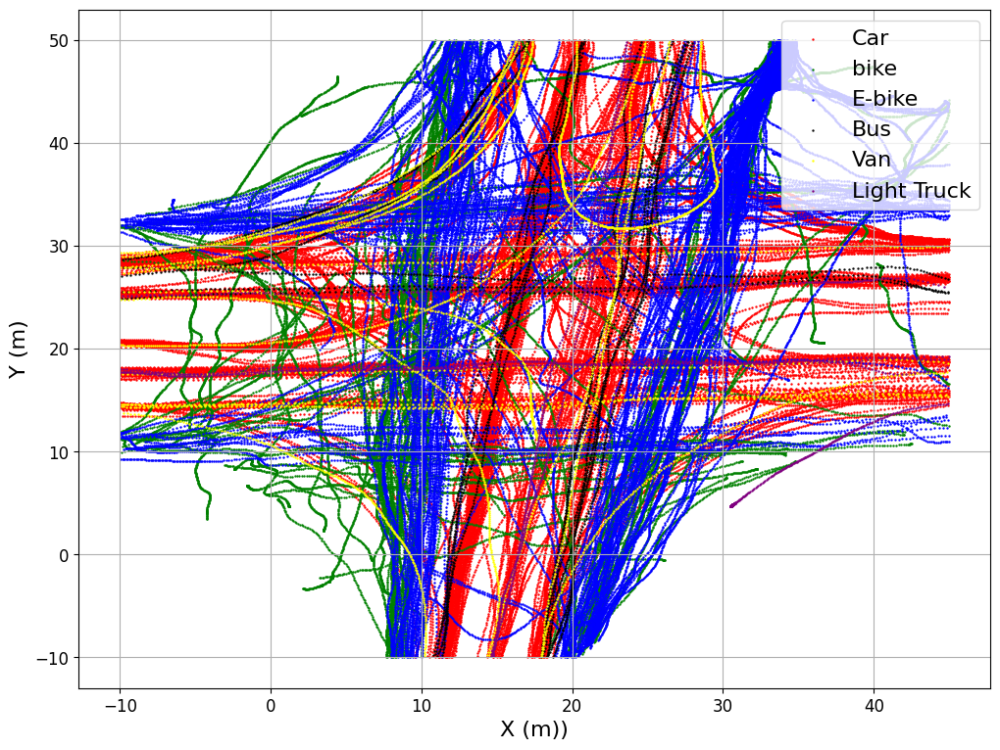

In [ ]:
# shown the map of trajectory
Map_trajectory_vehicle_type = pd.unique(Map_trajectory['vehicle_type'])
Map_trajectory_vehicle_type
Fig = vehicle_type_dif_color(Map_trajectory)

### Befor the calculate the pet, we should remove the noise in the trajectories! wavelet and Kalman filer were used in this section.
### The Module about the wavelet filters 
### Remove the noise of the trajectories use the wavelet filters.

In [ ]:
def wavelet_reduce_noise(input_data_path,output_data_path):
    'if you use this code you should format the trajectory at first.'
    Traje_clearn = pd.read_csv(input_data_path)
    # print(Traje_clearn)
    traj_data_df = pd.DataFrame(Traje_clearn)
    df = traj_data_df
    vehid = pd.unique(df.vehicle_id)
    Wavelet_traj = df[['vehicle_id','frame_time','vehicle_type']]
    Wt = pd.DataFrame(Wavelet_traj)
    Wt['world_x']=''
    Wt['world_y']=''
    Wt['speed_x']=''
    Wt['speed_y']=''
    Wt['acc_x']=''
    Wt['acc_y']=''
    Wt['Jerk_x']=''
    Wt['Jerk_y']=''
    for id in range(0,len(vehid),1):
        veh_id = vehid[id]
        B =[]
        V =[]
        ACC = []
        Jerk=[]
        traj_data = df[df.vehicle_id==veh_id]
        if len(traj_data)>=50:  
            Frame_id = pd.unique(traj_data.frame_time)
            TRAJ_world_x = traj_data['world_x']
            TRAJ_world_y = traj_data['world_y']
            min_row = traj_data.loc[traj_data['frame_time']== min(Frame_id),].index[0]
            max_row = traj_data.loc[traj_data['frame_time']== max(Frame_id),].index[0]
            AA = traj_data.iloc[min_row:max_row+1,[3,4]] 
            A = df.iloc[min_row:max_row+1,[3,4]] 
            W_X = pd.array(wavelet_noising(TRAJ_world_x))
            B.append(W_X)
            W_Y = pd.array(wavelet_noising(TRAJ_world_y))
            B.append(W_Y)
            BB = pd.DataFrame(B)
            BBB = np.transpose(BB)
            if A.shape[0]<BBB.shape[0]:
                CB = BBB.iloc[0:A.shape[0],[0,1]]
            else:
                CB = BBB.iloc[0:len(BBB),[0,1]]
            Wt.iloc[min_row:max_row+1,[3,4]] = CB
            'Calculate the speed with wordx and word y'
            WTraj = Wt.iloc[min_row:max_row+1,0:5]
            speed_x,speed_y = Velocity(WTraj)
            V.append(speed_x)
            V.append(speed_y)
            VV = pd.DataFrame(V)
            VVV = np.transpose(VV)
            Wt.iloc[min_row:max_row+1,[5,6]] = VVV
            # 计算加速度
            WWTraj = Wt.iloc[min_row:max_row+1,0:7]
            acc_x,acc_y = Accelection(WWTraj)
            ACC.append(acc_x)
            ACC.append(acc_y)
            ACCC = pd.DataFrame(ACC)
            AACCC = np.transpose(ACCC)
            Wt.iloc[min_row:max_row+1,[7,8]] = AACCC  
            'calculate the jerk value'
            WWWTTraj = Wt.iloc[min_row:max_row+1,0:9]
            WWWTTTraj = pd.DataFrame(WWWTTraj)
            jerxx,jeryy = Aclculate_Jerk(WWWTTTraj)
            Jerk.append(jerxx)
            Jerk.append(jeryy)
            Jerkk = pd.DataFrame(Jerk)
            JJerkk = np.transpose(Jerkk)
            Wt.iloc[min_row:max_row+1,[9,10]] = JJerkk
        #     print(Wt.iloc[min_row:max_row+1,[9,10]])   
    Wt.to_csv(output_data_path,index=False, header=True)
    return Wt

In [ ]:
# 对数据进行降噪处理
input_data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/clearn_data/C0008.csv'
save_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/C0008.csv'
Trajectory = wavelet_reduce_noise(input_data_path,save_path)

/usr/local/lib/python3.10/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def SpeedHistmap(data1,data2):
  plt.hist(data1, bins=20, density=True, alpha=0.4, label='Speed_x')
  plt.hist(data2, bins=20, density=True, alpha=0.4, label='Speed_y')
  plt.xlabel('speed(km/h)',fontsize=12)
  plt.xticks(fontsize=12,rotation=0)
  plt.yticks(fontsize=12)
  plt.ylabel('Frequency',fontsize=12)
  plt.legend(loc="upper right",fontsize=12)   #设置图例字体大小
  plt.tight_layout()
  plt.grid()
  plt.show()

def AccHistmap(data1,data2):
  plt.hist(data1, bins=20,color='red',density=True, alpha=0.4, label='acc_x')
  plt.hist(data2, bins=20,color='blue', density=True, alpha=0.4, label='acc_y')
  plt.xlabel('acc(m/s^2)',fontsize=12)
  plt.xticks(fontsize=12,rotation=0)
  plt.yticks(fontsize=12)
  plt.ylabel('Frequency',fontsize=12)
  plt.legend(loc="upper right",fontsize=12)   #设置图例字体大小
  plt.tight_layout()
  plt.grid()
  plt.show()

The vehicle type is Car


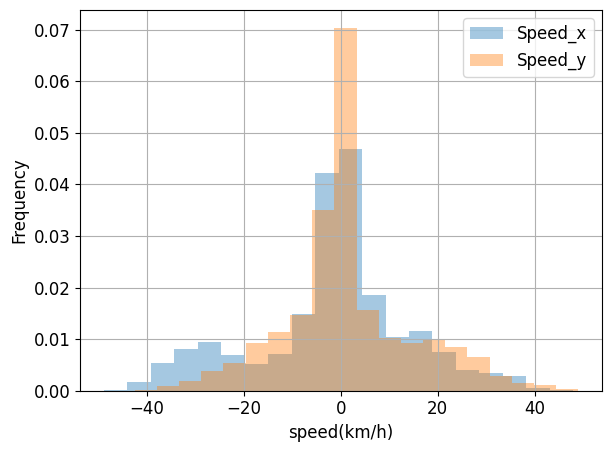

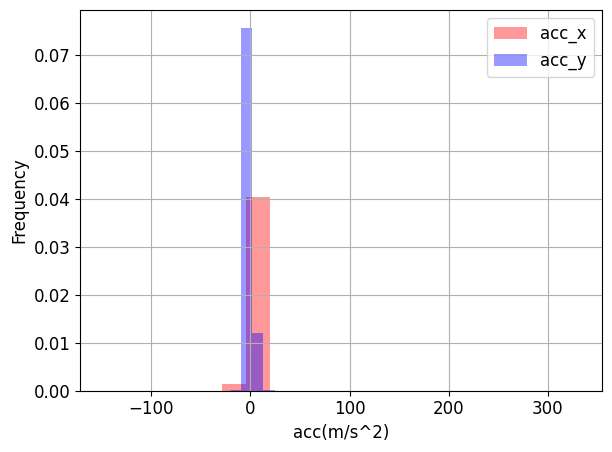

The vehicle type is Bicycle


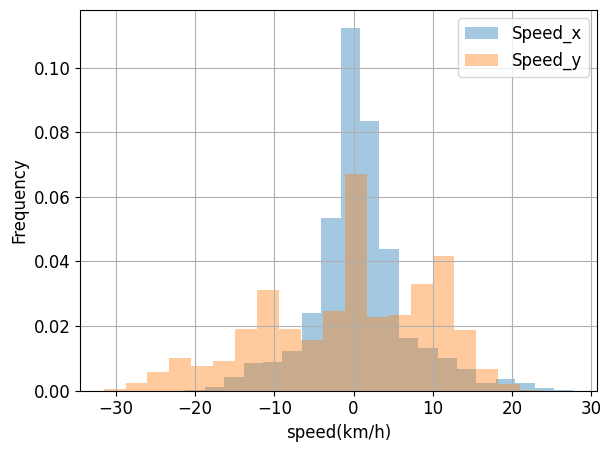

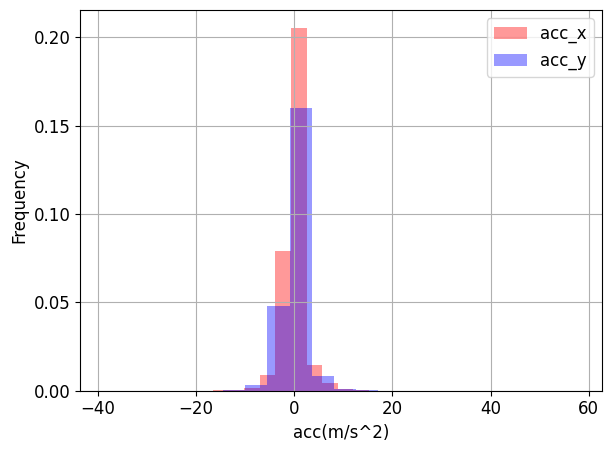

The vehicle type is Light Truck


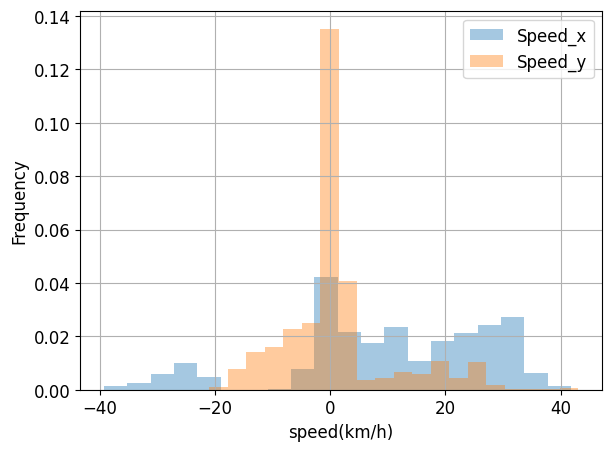

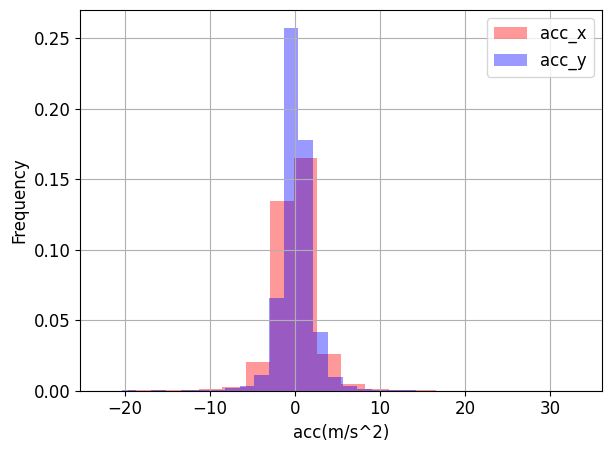

The vehicle type is Van


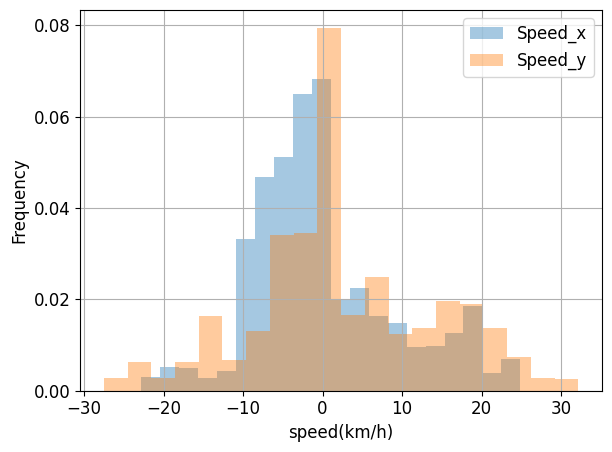

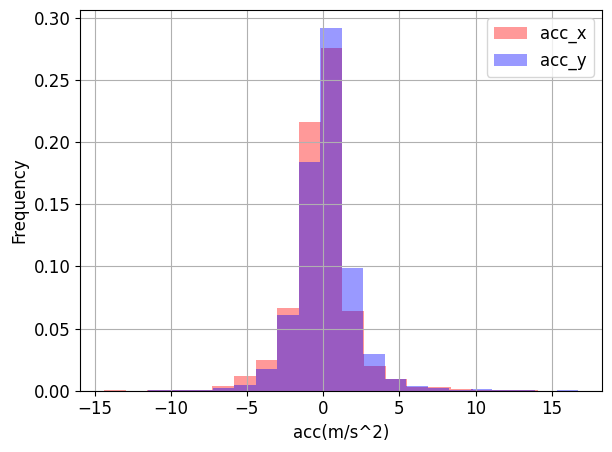

The vehicle type is Bus


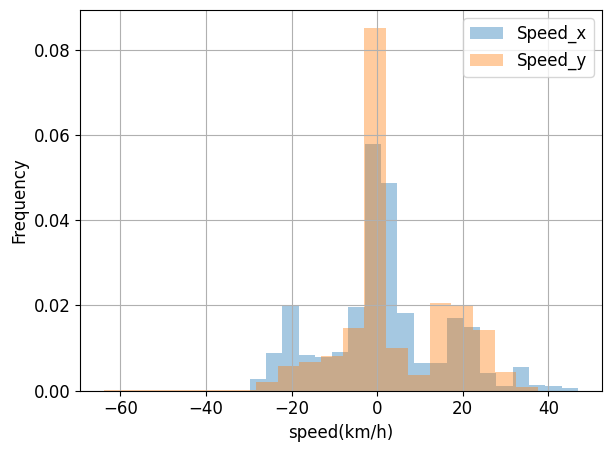

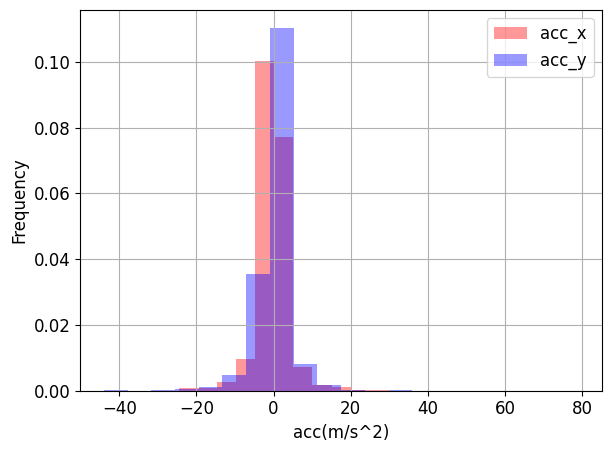

The vehicle type is Motorcycle


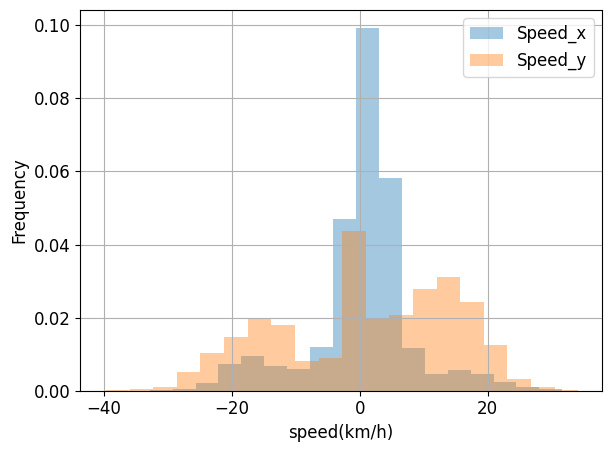

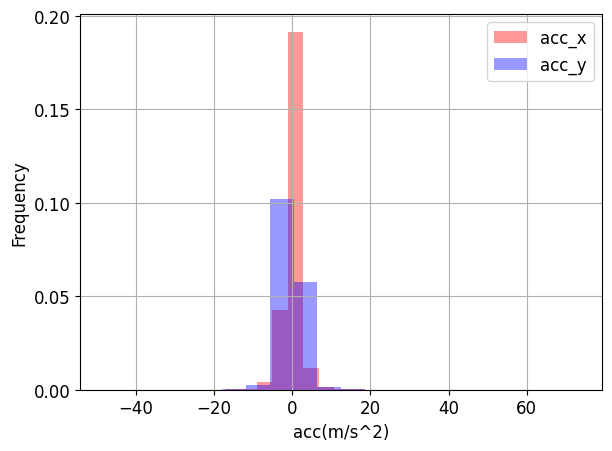

In [ ]:
wt_traj = pd.read_csv('/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/C0007.csv')
veh_type_id = pd.unique(wt_traj['vehicle_type'])
for vehtype_id in veh_type_id:
  Type_traj = wt_traj[wt_traj['vehicle_type']==vehtype_id]
  print('The vehicle type is'+str(vehtype_id))
  speed_map = SpeedHistmap(Type_traj['speed_x']*3.6,Type_traj['speed_y']*3.6)
  ACC_map = AccHistmap(Type_traj['acc_x'],Type_traj['acc_y'])

### define the calculate index

In [ ]:
def Speed_Caluca(Traj_OD):
    # 计算速度值
    Delta = (Traj_OD.values[1] - Traj_OD.values[0])
    squre = [num * num for num in Delta]
    Sum = sum(squre)
    Distance = math.sqrt(Sum)
    Speed = Distance / time_gap
    return Speed

def Montion_Equations(Traj_OD):
    # 根据已知的两点计算直线方程
    # 创建一个空的 DataFrame
    Line_parmeter = pd.DataFrame(columns=['A', 'B', 'C'],index=[1]) # if you want create a new datafram you should add index=[1], it mean row
    Line_parmeter['A'] = Traj_OD['world_y'].values[1]-Traj_OD['world_y'][0]
    Line_parmeter['B'] = Traj_OD['world_x'].values[0] - Traj_OD['world_x'][1]
    Line_parmeter['C']= Traj_OD['world_x'].values[1]*Traj_OD['world_y'].values[0]-Traj_OD['world_x'].values[0]*Traj_OD['world_y'].values[1]
    return Line_parmeter

def Point_of_cross(Line_parmeter_1,Line_parmeter_2):
    # 计算两条直线的相交点
    Point_cross = pd.DataFrame()
    D = (Line_parmeter_1['A'].values)*(Line_parmeter_2['B'].values)-(Line_parmeter_2['A'].values)*(Line_parmeter_1['B'].values)
    # what is the D?
    if D !=0:
        point_x = ((Line_parmeter_1['B'].values)*(Line_parmeter_2['C'].values)-(Line_parmeter_2['B'].values)*(Line_parmeter_1['C'].values))/D
        Point_cross['world_x'] = point_x
        point_y = ((Line_parmeter_2['A'].values)*(Line_parmeter_1['C'].values)-(Line_parmeter_1['A'].values)*(Line_parmeter_2['C'].values))/D
        Point_cross['world_y'] = point_y
    # else:
    #     print("两直线平行")
    return Point_cross

def PET(Point_cross,speed_A,speed_B,Traj_OD_A,Traj_OD_B):
  # calculate the PET between the two vehicle
  # Calculate the time for vehicle A to reach the conflict point
  # 'if there is no point of cross, we will not calculate the time'
  Delta_dis = Traj_OD_A.values[1]-Traj_OD_B.values[1]
  squre_dis = [num*num for num in Delta_dis]
  sum_dis = sum(squre_dis)
  Dis = math.sqrt(sum_dis)
  if Dis <= 10:
    if len(Point_cross)>=1:
      Delta_a = Point_cross.values[0]-Traj_OD_A.values[1]
      squre_a = [num*num for num in Delta_a]
      sum_dis_a = sum(squre_a)
      Dis_cross_a = math.sqrt(sum_dis_a)
      time_point_a = Dis_cross_a/speed_A
      # Calculate the time for car B to reach the conflict point
      Delta_b = Point_cross.values[0]-Traj_OD_B.values[1]
      squre_b = [num*num for num in Delta_b]
      sum_dis_b = sum(squre_b)
      Dis_cross_b = math.sqrt(sum_dis_b)
      time_point_b = Dis_cross_b/speed_B
      # 计算经过冲突点的时间
      PET_value = abs(time_point_a-time_point_b)
    else:
      # print('There is no cross point')
      PET_value = 10000
  else:
    PET_value = 9999
  return PET_value

def TTC(Point_cross,speed_A,speed_B,Traj_OD_A,Traj_OD_B):
  # calculate the PET between the two vehicle
  # Calculate the time for vehicle A to reach the conflict point
  # 'if there is no point of cross, we will not calculate the time'
  Delta_dis = Traj_OD_A.values[1]-Traj_OD_B.values[1]
  squre_dis = [num*num for num in Delta_dis]
  sum_dis = sum(squre_dis)
  Dis = math.sqrt(sum_dis)
  if Dis <= 10:
    if len(Point_cross)>=1:
      Delta_a = Point_cross.values[0]-Traj_OD_A.values[1]
      squre_a = [num*num for num in Delta_a]
      sum_dis_a = sum(squre_a)
      Dis_cross_a = math.sqrt(sum_dis_a)
      time_point_a = Dis_cross_a/speed_A
      # Calculate the time for car B to reach the conflict point
      Delta_b = Point_cross.values[0]-Traj_OD_B.values[1]
      squre_b = [num*num for num in Delta_b]
      sum_dis_b = sum(squre_b)
      Dis_cross_b = math.sqrt(sum_dis_b)
      time_point_b = Dis_cross_b/speed_B
      # 计算经过冲突点的时间
      ttc_time_aver = abs(time_point_a-time_point_b)
      if ttc_time_aver < 0.1:
        TTC = min(time_point_a,time_point_b)
      else:
        TTC = 10000
    else:
      # print('There is no cross point')
      TTC = 999999
  else:
    TTC = 999999
  return TTC

def Veh_motion_state(traj_all_data,veh_id,Time_frame):
    'extracte the motion state of vehicle_id'
    "提取主车在time_frame时刻的运动状态"
    Traj_veh_id = traj_all_data[traj_all_data['vehicle_id'] == veh_id]
    Time_frame = np.around(Time_frame, decimals=2)
    Traj_veh_id_time_O = Traj_veh_id[Traj_veh_id['frame_time'] == Time_frame]
    Next_frame = Time_frame+0.04
    Next_frame = np.around(Next_frame, decimals=2)
    Traj_veh_id_time_D = Traj_veh_id[Traj_veh_id['frame_time'] == Next_frame]
    Traj_veh_id_OD = pd.concat([Traj_veh_id_time_O, Traj_veh_id_time_D], ignore_index=True)
    Veh_a_point = Traj_veh_id_OD[['world_x', 'world_y']]
    # print(Veh_a_point)
    return Veh_a_point

In [ ]:
Data_pathata = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/C0007.csv'
Wt = pd.read_csv(Data_pathata)

In [ ]:
# import the data
Data_pathata = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/C0007.csv'
traj_data = pd.read_csv(Data_pathata)
ALL_Time_frames = pd.unique(traj_data['frame_time'])
ALL_Time_frames.sort() # attention the method of the .sort()
# set the time gaps
time_gap = 0.04
# the total of frame time
Time_frames = ALL_Time_frames

#### 是否可以通过定义函数的形式来给现在的代码进行精简，达到便捷和高效的效果呢？
#### 如果按照面向对象的编程思想，那一块的内容可以拿出来独立成为体系呢？
#### 另外代码还需要添加新的计算内容，TTC、Delta V。所得到的的最终的表格应该包含：运动状态变量和冲突指标变量。
#### 进一步提取冲突时间的过程。

In [ ]:
from matplotlib.projections.polar import ThetaTick
# Generate columns
Columns_name = ['m_vehicle_id','m_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y',
                'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                'cross_point_x', 'cross_point_y', 'PET','TTC']

'Creat the list to save all time result'
df_all_time = pd.DataFrame(columns=Columns_name)
for num_id in range(0,len(Time_frames),1):
    # uqdate with time_frame............................jhkjkh
    # 'Creat the list to save every frame time result'
#     print('............................................new time......................................................')
    if num_id < len(Time_frames):
        time_frame = Time_frames[num_id]
        print(time_frame)
        Traj_same_time = traj_data[traj_data['frame_time'] == time_frame]
        Veh_same_times = pd.unique(Traj_same_time['vehicle_id'])
        #Need to determine if there is still a vehicle in the system in the next second
        Next_fram_time = time_frame+0.04
        Veh_same_times_next_frame_time = traj_data[traj_data['frame_time'] == Next_fram_time]
        if len(Veh_same_times) >= 2 and len(Veh_same_times_next_frame_time) >= 2:
            'create a list save each main vehicle'
            A = pd.DataFrame(
                    columns=['m_vehicle_id', 'm_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x',
                             'm_speed_y', 'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                             'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x',
                             'sub_speed_y',
                             'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                             'cross_point_x', 'cross_point_y', 'PET','TTC']
                             )
            for veh_id in Veh_same_times:
                # the main vehicel Uqdate with vehicle_id    
#                 print('------------------------'+str(veh_id)+'----------------------------------------------')
                Traj_M_veh = Traj_same_time[Traj_same_time['vehicle_id'] == veh_id]
                Traj_M_veh = pd.DataFrame(Traj_M_veh)
                df_main_veh = pd.DataFrame(
                    columns=['m_vehicle_id', 'm_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x',
                             'm_speed_y', 'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                             'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x',
                             'sub_speed_y',
                             'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                             'cross_point_x', 'cross_point_y', 'PET','TTC'])
                df_main_veh[
                    ['m_vehicle_id', 'm_frame_time', 'm_vehicle_type','m_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y',
                     'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y']] = Traj_M_veh       
                Veh_a_point = Veh_motion_state(traj_data, veh_id, time_frame)       
                if len(Veh_a_point) >= 2:
                    Speed_a = Speed_Caluca(Veh_a_point)
                    Line_parmeter_1 = Montion_Equations(Veh_a_point)
                    Sub_Veh_same_time = Veh_same_times
                    'creat a list to save the result of every sub_veh_variable'
                    Sub_vehicle_temp = pd.DataFrame(columns=['sub_veh_id', 'cross_point_x', 'cross_point_y', 'PET','TTC'])
                    Sub_veh_id_A = []
                    cross_point_B = []
                    PET_C = []
                    TTC_C =[]
                    for Sub_veh_id in Sub_Veh_same_time:
                        #for Sub_veh_id in Sub_Veh_same_time:
#                         print('==================================='+str(Sub_veh_id)+'=====================================')
                        'extracte the motion state of sub vehicle'
                        Traj_sub_veh = Traj_same_time[Traj_same_time['vehicle_id'] == Sub_veh_id]
                        Veh_b_point = Veh_motion_state(traj_data, Sub_veh_id, time_frame)
                        if len(Veh_b_point) >= 2:
                            Speed_b = Speed_Caluca(Veh_b_point)
                            Line_parmeter_2 = Montion_Equations(Veh_b_point)   
                            'Calculate the cross point'
                            cross_point = Point_of_cross(Line_parmeter_1, Line_parmeter_2)
                            # if there are no cross points, we should stop the next step
                            if len(cross_point) != 0:
                                'calculate the PET'
                                conflict_pet = PET(cross_point, Speed_a, Speed_b, Veh_a_point, Veh_b_point)
                                'Calculate the TTC'
                                conflict_TTC = TTC(cross_point, Speed_a, Speed_b, Veh_a_point, Veh_b_point)
                                # creat a list which contain the vehicle information and the PET at every frame
                                Sub_veh_id_A.append(Sub_veh_id)
                                cross_point_B.append(cross_point.values[0])
                                PET_C.append(conflict_pet)
                                TTC_C.append(conflict_TTC)
                    Sub_veh_id = pd.DataFrame(Sub_veh_id_A)
                    Sub_vehicle_temp['sub_veh_id'] = Sub_veh_id_A
                    Sub_vehicle_temp[['cross_point_x','cross_point_y']] = cross_point_B
                    Sub_vehicle_temp['PET'] = PET_C
                    Sub_vehicle_temp['TTC'] = TTC_C
                    Min_pet_value = min(Sub_vehicle_temp['TTC'])
                    Min_pet_sub_veh = Sub_vehicle_temp[Sub_vehicle_temp['TTC'] == Min_pet_value]
                    MIN_PET_SUB = Min_pet_sub_veh[['cross_point_x', 'cross_point_y', 'PET','TTC']]
                    sub_veh_min_pet_id = Min_pet_sub_veh['sub_veh_id'].values[0]

                sub_veh_inf = Traj_same_time[Traj_same_time['vehicle_id'] == sub_veh_min_pet_id]
                traj_data_sub_min_pet_id = sub_veh_inf[
                    ['vehicle_id', 'vehicle_type', 'world_x', 'world_y', 'speed_x', 'speed_y', 'acc_x', 'acc_y', 'Jerk_x','Jerk_y']]
                traj_data_sub_min_pet_id = pd.DataFrame(traj_data_sub_min_pet_id)
                df_main_veh[
                    ['sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                     'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y']] = traj_data_sub_min_pet_id.values[0]
                df_main_veh[['cross_point_x', 'cross_point_y', 'PET','TTC']] = MIN_PET_SUB.values[0]
                # Integration of all vehicle data at the same moment
                integer_A_df_main_veh = [A,df_main_veh]
                A = pd.concat(integer_A_df_main_veh)

    Integer_A_all_time = [df_all_time,A]
    df_all_time = pd.concat(Integer_A_all_time) 
    # print(df_all_time)
df_all_time.to_csv('/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_C0007.csv',index=False, header=True)

NameError: ignored

Import the dataset，and and then analys the feature of the conflict at intersection 

In [ ]:
PET_data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_C0008.csv'
pet_data = pd.read_csv(PET_data_path)
pet_df = pd.DataFrame(pet_data)
# Data clearn 
# if the pet >10(s),we should mark it with no conflict 
pet_df['TTC'][pet_df.TTC>100]== 100
# 剔除表格单元格中的空格符
pet_df2 = pet_df.applymap(lambda x: str(x).strip())

根据冲突车辆的类别对冲突事件进行分类：

In [ ]:
# defining the libraries
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import ks_2samp
%matplotlib inline

# class the conflict into car-bicycle, car-car,car-ebkie, here we dont need to  distribution the min vehicel and sub vehicle.
data_original =pet_df[pet_df['TTC']<=10]
vehicle_type = pd.unique(data_original['m_vehicle_type'])
print(vehicle_type)

def distribution_conflict(data_conflict,min_veh_type,s_vehicle_type):
    "here we will make an class of the conflict"
    # print(data_conflict)
    m_conflict_data = data_conflict[data_conflict['m_vehicle_type']==min_veh_type]
    s_conflict_data = data_conflict[data_conflict['sub_vehicle_type']==s_vehicle_type]
    # combin the data
    ms_conflict_data = [m_conflict_data,s_conflict_data]
    m_conflict_data = pd.concat(ms_conflict_data)
    return m_conflict_data

def Save_pet_data(data,save_path):
    Data = pd.DataFrame(data)
    save_file = Data.to_csv(save_path,index=False, header=True)
    return save_file

M_veh_type = " Car"
S_veh_type = " Motorcycle"
car_to_to_conflict = distribution_conflict(data_original,M_veh_type,S_veh_type)

# Save_path_pet = '/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Car_to_E_bike_C0006.csv'
# car_to_car_conflict = Save_pet_data(car_to_to_conflict,Save_path_pet)

[' Car' ' Bicycle' ' Motorcycle' ' Van' ' Tuk-Tuk' ' Light Truck' ' Bus']


The conflict type, the main vehicle Car, the subvehicle  Car. the total number is 868
The conflict type, the main vehicle Car, the subvehicle  Bicycle. the total number is 242
The conflict type, the main vehicle Car, the subvehicle  Motorcycle. the total number is 489
The conflict type, the main vehicle Car, the subvehicle  Van. the total number is 25
The conflict type, the main vehicle Car, the subvehicle  Tuk-Tuk. the total number is 2
The conflict type, the main vehicle Car, the subvehicle  Light Truck. the total number is 4
The conflict type, the main vehicle Car, the subvehicle  Bus. the total number is 11


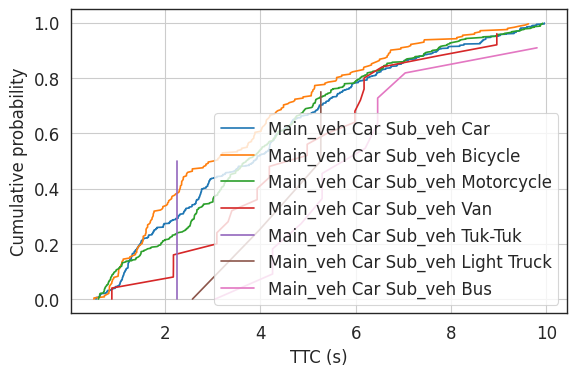

The conflict type, the main vehicle Bicycle, the subvehicle  Car. the total number is 232
The conflict type, the main vehicle Bicycle, the subvehicle  Bicycle. the total number is 693
The conflict type, the main vehicle Bicycle, the subvehicle  Motorcycle. the total number is 862
The conflict type, the main vehicle Bicycle, the subvehicle  Van. the total number is 0
The conflict type, the main vehicle Bicycle, the subvehicle  Tuk-Tuk. the total number is 0
The conflict type, the main vehicle Bicycle, the subvehicle  Light Truck. the total number is 0
The conflict type, the main vehicle Bicycle, the subvehicle  Bus. the total number is 10


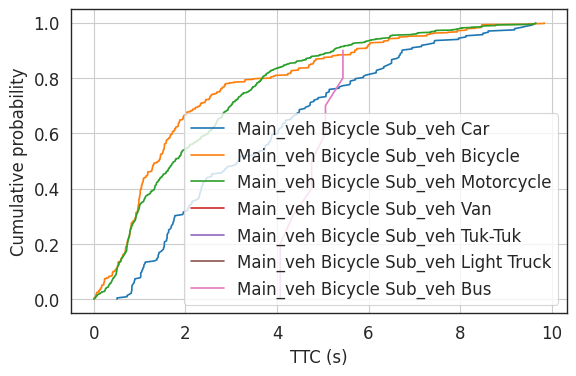

The conflict type, the main vehicle Motorcycle, the subvehicle  Car. the total number is 463
The conflict type, the main vehicle Motorcycle, the subvehicle  Bicycle. the total number is 861
The conflict type, the main vehicle Motorcycle, the subvehicle  Motorcycle. the total number is 2371
The conflict type, the main vehicle Motorcycle, the subvehicle  Van. the total number is 10
The conflict type, the main vehicle Motorcycle, the subvehicle  Tuk-Tuk. the total number is 0
The conflict type, the main vehicle Motorcycle, the subvehicle  Light Truck. the total number is 6
The conflict type, the main vehicle Motorcycle, the subvehicle  Bus. the total number is 16


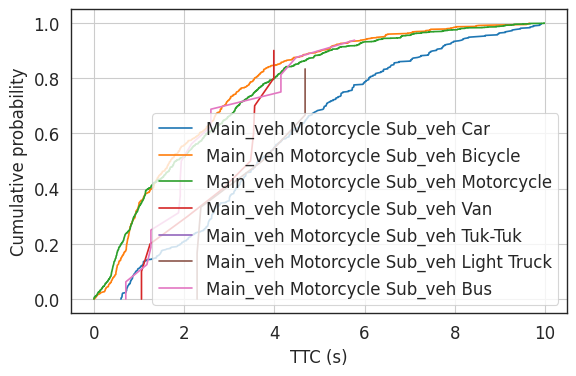

The conflict type, the main vehicle Van, the subvehicle  Car. the total number is 25
The conflict type, the main vehicle Van, the subvehicle  Bicycle. the total number is 0
The conflict type, the main vehicle Van, the subvehicle  Motorcycle. the total number is 11
The conflict type, the main vehicle Van, the subvehicle  Van. the total number is 0
The conflict type, the main vehicle Van, the subvehicle  Tuk-Tuk. the total number is 0
The conflict type, the main vehicle Van, the subvehicle  Light Truck. the total number is 0
The conflict type, the main vehicle Van, the subvehicle  Bus. the total number is 0


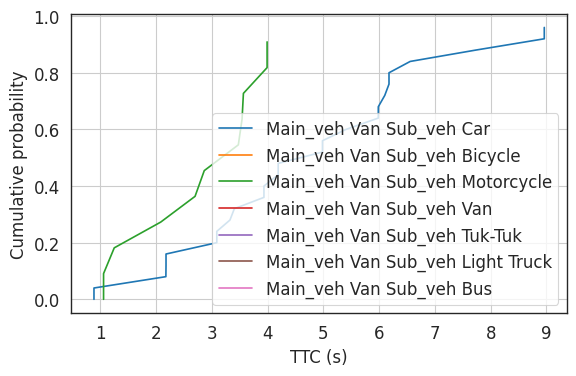

The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Car. the total number is 2
The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Bicycle. the total number is 0
The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Motorcycle. the total number is 0
The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Van. the total number is 0
The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Tuk-Tuk. the total number is 10
The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Light Truck. the total number is 0
The conflict type, the main vehicle Tuk-Tuk, the subvehicle  Bus. the total number is 0


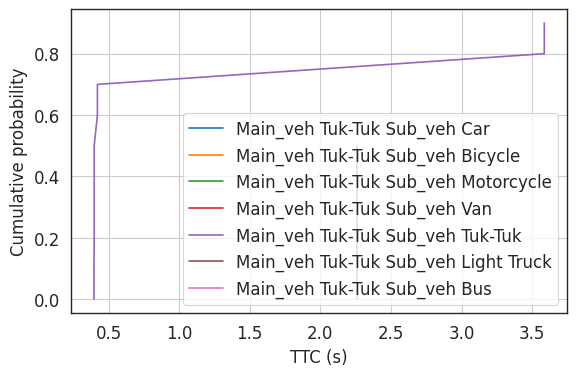

The conflict type, the main vehicle Light Truck, the subvehicle  Car. the total number is 4
The conflict type, the main vehicle Light Truck, the subvehicle  Bicycle. the total number is 0
The conflict type, the main vehicle Light Truck, the subvehicle  Motorcycle. the total number is 6
The conflict type, the main vehicle Light Truck, the subvehicle  Van. the total number is 0
The conflict type, the main vehicle Light Truck, the subvehicle  Tuk-Tuk. the total number is 0
The conflict type, the main vehicle Light Truck, the subvehicle  Light Truck. the total number is 0
The conflict type, the main vehicle Light Truck, the subvehicle  Bus. the total number is 0


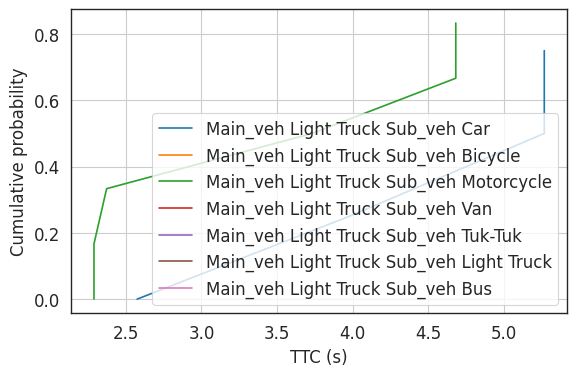

The conflict type, the main vehicle Bus, the subvehicle  Car. the total number is 11
The conflict type, the main vehicle Bus, the subvehicle  Bicycle. the total number is 10
The conflict type, the main vehicle Bus, the subvehicle  Motorcycle. the total number is 16
The conflict type, the main vehicle Bus, the subvehicle  Van. the total number is 0
The conflict type, the main vehicle Bus, the subvehicle  Tuk-Tuk. the total number is 0
The conflict type, the main vehicle Bus, the subvehicle  Light Truck. the total number is 0
The conflict type, the main vehicle Bus, the subvehicle  Bus. the total number is 0


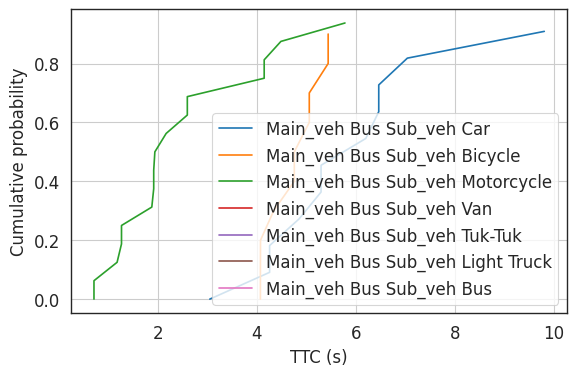

In [ ]:
# " the fellow code class the conflict "
M_veh_type = data_original['m_vehicle_type'].unique()
for m_veh_type in M_veh_type:
    M_veh_pet = data_original[data_original['m_vehicle_type']==m_veh_type]
    fig = plt.figure(figsize=(6,4)) 
    for sub_veh_type in M_veh_type:
        M_veh_pet_sub = M_veh_pet[M_veh_pet['sub_vehicle_type'] ==sub_veh_type]
        data = M_veh_pet_sub['TTC']
        print('The conflict type, the main vehicle'+str(m_veh_type)+', the subvehicle '+str(sub_veh_type)+'. the total number is '+str(len(data)))
        label_name = 'Main_veh'+str(m_veh_type)+ ' Sub_veh'+str(sub_veh_type)
        N = data.shape[0]
        # Max_value = max(data)
        # Min_pet = min(data)
        x = np.sort(data)
        y = np.arange(N) / float(N)
          
        plt.plot(x, y,label= label_name)
    plt.xlabel('TTC (s)',fontsize=12)
    plt.xticks(fontsize=12,rotation=0)
    plt.yticks(fontsize=12)
    plt.ylabel('Cumulative probability',fontsize=12)
    plt.legend(loc="lower right",fontsize=12)   #设置图例字体大小
    plt.tight_layout()
    plt.grid()
    plt.show()

The conflict type, the main vehicle Bicycle, the subvehicle  Bicycle. the total number is 256


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


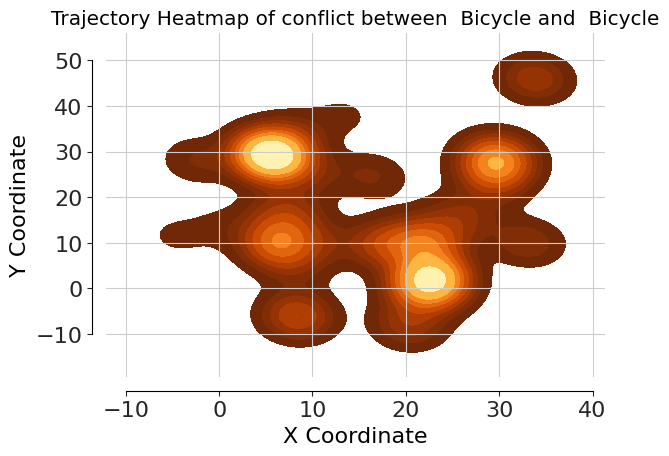

The conflict type, the main vehicle Bicycle, the subvehicle  Motorcycle. the total number is 291


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


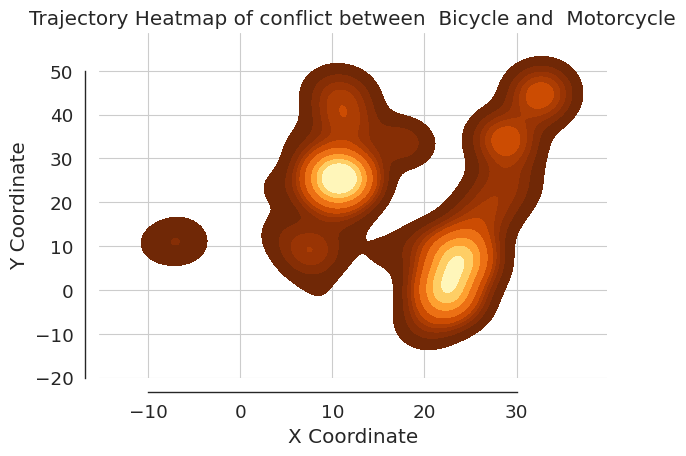

The conflict type, the main vehicle Bicycle, the subvehicle  Car. the total number is 18


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


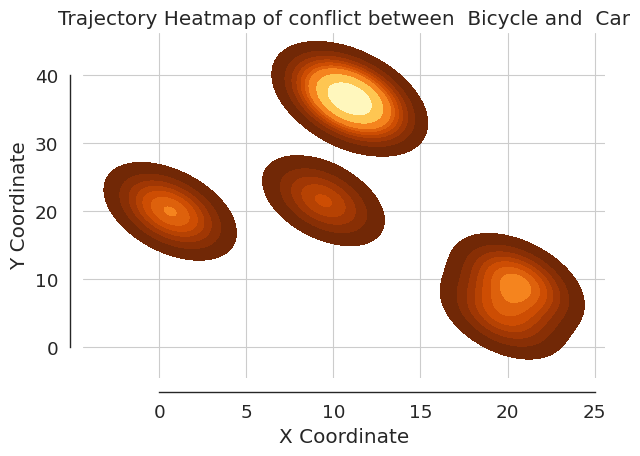

The conflict type, the main vehicle Bicycle, the subvehicle  Van. the total number is 0


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


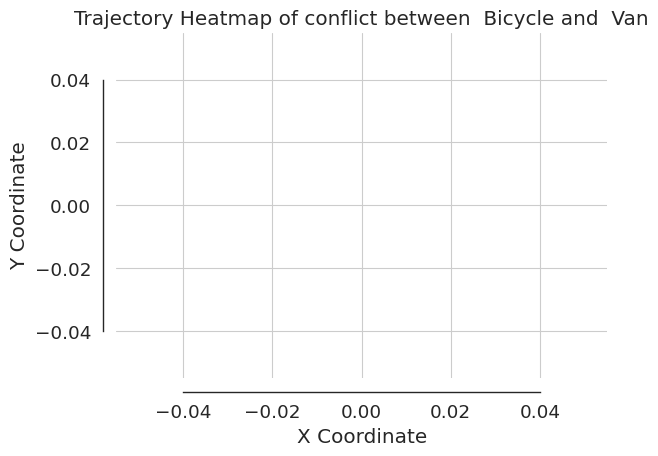

The conflict type, the main vehicle Bicycle, the subvehicle  Tuk-Tuk. the total number is 0


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


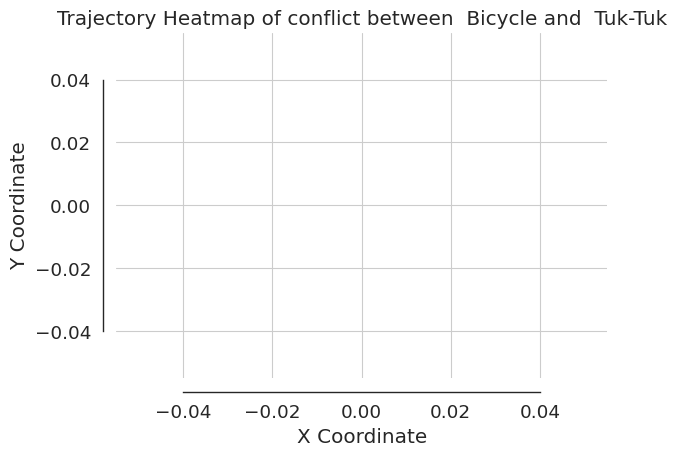

The conflict type, the main vehicle Bicycle, the subvehicle  Bus. the total number is 0


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


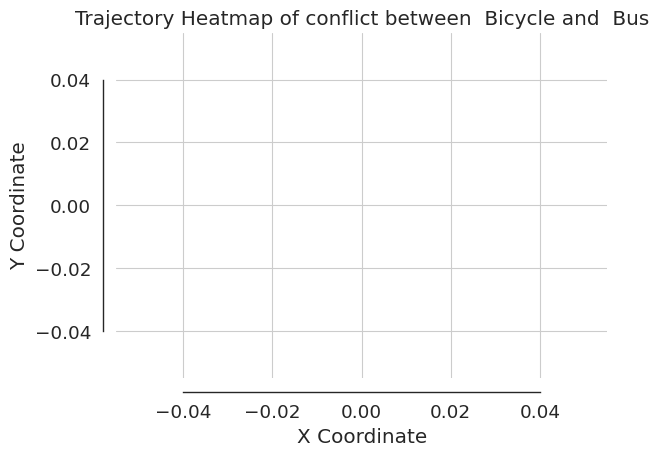

The conflict type, the main vehicle Motorcycle, the subvehicle  Bicycle. the total number is 297


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


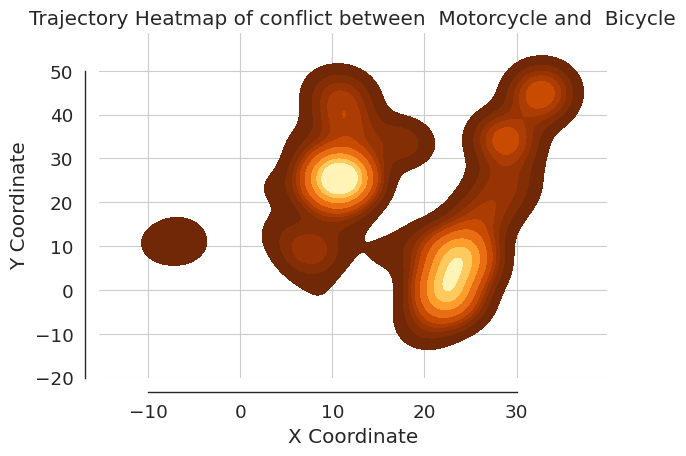

The conflict type, the main vehicle Motorcycle, the subvehicle  Motorcycle. the total number is 793


<ipython-input-20-06ffe3382900>:26: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.25`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
<ipython-input-20-06ffe3382900>:26: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)


KeyboardInterrupt: ignored

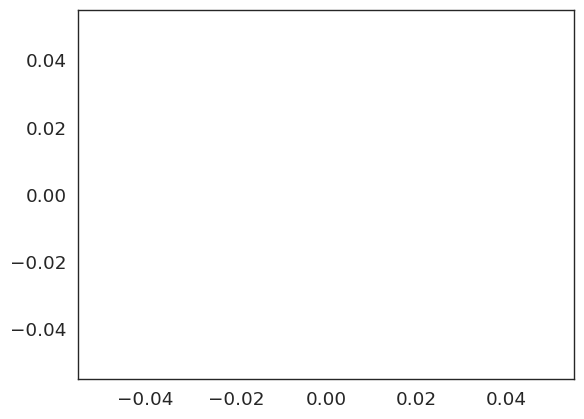

In [ ]:
# defining the libraries
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import ks_2samp
%matplotlib inline

data_original =pet_df[pet_df['TTC']<=1]

# classification of the conflict 
M_veh_type = data_original['m_vehicle_type'].unique()
for m_veh_type in M_veh_type:
    M_veh_pet = data_original[data_original['m_vehicle_type']==m_veh_type]
    for sub_veh_type in M_veh_type:
        M_veh_pet_sub = M_veh_pet[M_veh_pet['sub_vehicle_type'] ==sub_veh_type]
        data = M_veh_pet_sub[['cross_point_x','cross_point_y']]
        data = pd.DataFrame(data)
        # limited the edges Original_data = Original_data.drop(Original_data[Original_data.world_x <= -10].index)
        data = data.drop(data[data.cross_point_x <= -10].index)
        data = data.drop(data[data.cross_point_x >= 45].index)
        data = data.drop(data[data.cross_point_y <= -10].index)
        data = data.drop(data[data.cross_point_y >= 50].index)
        print('The conflict type, the main vehicle'+str(m_veh_type)+', the subvehicle '+str(sub_veh_type)+'. the total number is '+str(len(data)))
        # Create a 2D density plot using Seaborn's kdeplot function
        sns.kdeplot(data=data, x='cross_point_x', y='cross_point_y', cmap='YlOrBr_r', shade=True, bw=.25)
        # Customize the plot
        sns.set_style('white')
        sns.despine(offset=10, trim=True)
        sns.set_context('paper', font_scale=1.5)
        # Add labels and title
        plt.xlabel('X Coordinate')
        plt.ylabel('Y Coordinate')
        plt.title('Trajectory Heatmap of conflict between '+str(m_veh_type)+' and '+ str(sub_veh_type))
        plt.tight_layout()
        plt.grid()
        plt.show()

 ####  ** Extract the conflict event from the trajectory conflict data!**
   #####  First, classificatory /'klæsifikeitəri/ the conflict kinds based on the vehicle type;
   #####  Second, classificatory the conflict based on the motion direction;
   ##### Then,  

## 研究思路梳理 Sorting out the research idea

#### 提取车辆冲突风险事件过程数据，定义冲突过程影响时序变量。

**1.提取冲突风险事件。**

    a.定义什么是风险事件，PET值小于2秒，TTC值？
    b.提取PET值小于2的所有轨迹点，对应的车辆ID和潜在碰撞车辆ID,所对应的轨迹点和交通状态数据；
    C.提取冲突事件演化过程的轨迹数据和车辆风险演化过程值；(提取过程中应该选择连续的多个点，并非一个点)
    d.分析风险演化对应的运动状态量的变化。
    e.按照碰撞车辆类型进行状态事件链的集计。
**2.定义碰撞冲突过程影响变量。**

    a.车辆速度变化量、加速度变化量、急动度、曲率变化量、风险值（使用集计量还是时序变量需要斟酌）
    b.建立线性回归模型来确定基础影响变量（静态分析模型）；
    c.定义Dynamic Bayesian Network模型所需的数据类型；
**3.基于Dynamic Bayseian Network and causality inference modeling 分析动态演化过程，分析关键冲突点和最长风险预测的对比。**

    a.因素之间的因果关系分析；
    b.基于因果分析模型对风险预测的准确性分析；
    c.如何验证模型，需要进一步思考。

In [ ]:
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt

In [ ]:
# input the dataset of Traffic conflict
# /content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Car_to_bike.csv
Orginal_trajectory_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/C0006.csv'
Orginal_trajectory =  pd.read_csv(Orginal_trajectory_path)

data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Car_to_Car_C0006.csv'
car_conflict_TTC = pd.read_csv(data_path)

# Creat_Empty_Matrix 
Columns_name = ['m_vehicle_id','m_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y',
                'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                'cross_point_x', 'cross_point_y', 'PET','TTC']
'Creat the list to save all time result'
df_TTC = pd.DataFrame(columns=Columns_name)

# Extract the event of conflict value blow 2 seconds
Car_car_TTC_lesss_2 = car_conflict_TTC[car_conflict_TTC['TTC']<=5]
# the main vehicle trajectory
Main_car_id = pd.unique(Car_car_TTC_lesss_2['m_vehicle_id'])
# the sub vehicle trajectory
Sub_car_id = pd.unique(Car_car_TTC_lesss_2['sub_vehicle_id'])

# Search the point where the TTC value is mininum
for car_id in Main_car_id:
    # the orginal trajectory 
    Main_orginal_trajectory = Orginal_trajectory[Orginal_trajectory['vehicle_id']==car_id]
    TTC_set_Main_car = Car_car_TTC_lesss_2[Car_car_TTC_lesss_2['m_vehicle_id']==car_id]
    TTC_set_Main_car_T = pd.DataFrame(TTC_set_Main_car)
    # calculate the ttc
    Veh_ty1,Veh_ty2,Veh_ty3 = Detect_interacte_object(TTC_set_Main_car_T)


    TTC_set_Main_car = TTC_set_Main_car_T.drop_duplicates()  # delete the repeat value
    # Minimum_ttc_fram,Min_ttc,Mean_ttc,Std_ttc,conflict_point = Detect_Risk_frame(TTC_set_Main_car)  # detect the risk frame
    Minimum_ttc_fram,Min_ttc,Mean_ttc,Std_ttc,conflict_point = Detect_Risk_frame(Veh_ty3)  # detect the risk frame
    Minimum_ttc_fram = Minimum_ttc_fram.values
    conflict_point_x = conflict_point['cross_point_x'].values
    conflict_point_y = conflict_point['cross_point_y'].values
    # print('-----------------------------------------------------------------')


    if ((Mean_ttc<=0.5) & (Mean_ttc>=Std_ttc) & (conflict_point_x[0]>=-20) &(conflict_point_x[0]<=55) &(conflict_point_y[0]>=-20) &(conflict_point_y[0]<=60)):      
        sub_conflict_car_id = Detect_Risk_subcar(TTC_set_Main_car).values
        sub_conflict_car_id = Veh_ty3['sub_vehicle_id'].values[0]
        # print('---------------------------------+--------------------------------')
        TTC_set_sub_car = Car_car_TTC_lesss_2[Car_car_TTC_lesss_2['m_vehicle_id']==sub_conflict_car_id]
        # TTC_set_sub_car = Veh_ty3['sub_vehicle_id'].values[0]
        Sub_orginal_trajectory = Orginal_trajectory[Orginal_trajectory['vehicle_id']==TTC_set_sub_car]

        Time_Gap_Befor = 20
        Time_Gap_After = 20
        traffic_conflict_course_main = Event_extract(TTC_set_Main_car,Minimum_ttc_fram,Time_Gap_Befor,Time_Gap_After)
        traffic_conflict_course_sub = Event_extract(TTC_set_sub_car,Minimum_ttc_fram,Time_Gap_Befor,Time_Gap_After)

        Event_main_traj,Event_sub_traj = conflict_event(Veh_ty3,Main_orginal_trajectory,Sub_orginal_trajectory,50)
        
        Minimum_TTC_postion = traffic_conflict_course_main[traffic_conflict_course_main['m_frame_time']==Minimum_ttc_fram[0]]
        min_dis = Distance(Minimum_TTC_postion)
        if min_dis<=10:
          if (len(traffic_conflict_course_main)>0) &(len(traffic_conflict_course_sub)>0)&(len(Minimum_TTC_postion)):
            # print(traffic_conflict_course_main,traffic_conflict_course_sub)
            # here we should save the conflict trajectory data
            # print(traffic_conflict_course_main)

            df_TTC = pd.concat([df_TTC,traffic_conflict_course_main], axis=0, ignore_index=True)
              
            print('The conflict between vehicle  '+str(car_id)+' and the vehicle   '+str(sub_conflict_car_id))


            # plt.scatter(traffic_conflict_course_main['m_world_x'],traffic_conflict_course_main['m_world_y'])
            # plt.scatter(traffic_conflict_course_sub['m_world_x'],traffic_conflict_course_sub['m_world_y'])
            plt.scatter(Event_main_traj['m_world_x'],Event_main_traj['m_world_y'])
            plt.scatter(Event_sub_traj['m_world_x'],Event_sub_traj['m_world_y'])

            plt.scatter(Minimum_TTC_postion['cross_point_x'],Minimum_TTC_postion['cross_point_y'])
            plt.scatter(Minimum_TTC_postion['m_world_x'],Minimum_TTC_postion['m_world_y'])
            plt.scatter(Minimum_TTC_postion['sub_world_x'],Minimum_TTC_postion['sub_world_y'])
            plt.show()

In [ ]:
from IPython.core.interactiveshell import dis
def Detect_interacte_object(Main_car_data):
  # define the interact object of the main

  'Type_1:the minimum ttc object'
  # print('--------------------------------------------------------')
  Min_TTC = min(Main_car_data['TTC'])
  Risk_frame_time_Matrix = Main_car_data.loc[Main_car_data['TTC']==Min_TTC]
  Interacte_object_type1_min_TTC = Risk_frame_time_Matrix.drop_duplicates()
  # Interacte_object_type1_min_TTC = Risk_frame_time_Matrix.iloc[-1]
  Interacte_object_type1 = Interacte_object_type1_min_TTC['sub_vehicle_id']

  'Type_2:the most often vehicle'
  # calculate the number of the subid times
  Interacte_object_type_list = Main_car_data['sub_vehicle_id'].value_counts()
  # print('++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
  M_F_sub_id = Interacte_object_type_list.idxmax()
  Interacte_object_type2 = Main_car_data[Main_car_data['sub_vehicle_id']==M_F_sub_id]
  # Find the most less value in the mount interfection object
  Min_F_SUB_TTC = min(Interacte_object_type2['TTC'])
  M_F_MIN_RISK_M = Interacte_object_type2[Interacte_object_type2['TTC']==Min_F_SUB_TTC]
  M_F_MIN_RISK_M = pd.DataFrame(M_F_MIN_RISK_M)
  Interacte_object_type2_min_TTC = M_F_MIN_RISK_M.drop_duplicates()
  # Interacte_object_type2_min_TTC = M_F_MIN_RISK_M.iloc[-1]
  Interacte_object_type2_F_TTC = Interacte_object_type2_min_TTC['sub_vehicle_id']

  'Type_3:the minimun mean of TTC'
  # print('========================================================')
  sub_vehicle_id = np.unique(Main_car_data['sub_vehicle_id'])
  AM = ['vehicle_id','mean_TTC']
  df_all_vehicle = pd.DataFrame(columns = AM)
  Interacte_object_list = []
  for Veh_id_id in range(0,len(sub_vehicle_id),1):
    vehicle_ID = sub_vehicle_id[Veh_id_id]
    "calculate the mean of TTC one by one"
    TTC_vehicle_ID = Main_car_data[Main_car_data['sub_vehicle_id']==vehicle_ID]
    vehicle_id_ttc = np.mean(TTC_vehicle_ID['TTC'])
    df_all_vehicle['vehicle_id'] = vehicle_ID
    df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
  min_TTC_vehicleID = min(df_all_vehicle['mean_TTC'])
  Min_TTC_interact_traj = df_all_vehicle[df_all_vehicle['mean_TTC']==min_TTC_vehicleID]
  Interacte_object_sub_id = int(Min_TTC_interact_traj['vehicle_id'])
  Interacte_object_type3_T = Main_car_data[Main_car_data['sub_vehicle_id']==Interacte_object_sub_id]
  Interacte_object_type3_traj = Interacte_object_type3_T.drop_duplicates()
  return Interacte_object_type1_min_TTC,Interacte_object_type2_min_TTC,Interacte_object_type3_traj

def Distance(data):
  # this function calculate the distance between the main veh and the sub veh
  m_x = float(data['m_world_x'].values[0])
  m_y = float(data['m_world_y'].values[0])
  sub_x = float(data['sub_world_x'].values[0])
  sub_y = float(data['sub_world_y'].values[0])                                                
  DIS = math.sqrt((m_x-sub_x)**2+(m_y-sub_y)**2)
  return DIS

def Detect_Risk_frame(TTC_M_CAR):
  # print(TTC_M_CAR)
  # search the minimum frame time 
  'This function is detecte the Risk_time of the motion process'
  Min_TTC = min(TTC_M_CAR['TTC'])
  Risk_frame_time_Matrix = TTC_M_CAR.loc[TTC_M_CAR['TTC']==Min_TTC]
  Risk_frame_time = Risk_frame_time_Matrix['m_frame_time']
  'Diagnose the Minimum TTC value is true'
  Risk_frame_time_befor = Risk_frame_time.values-0.04*25
  Risk_frame_time_after = Risk_frame_time.values+0.04*25
  'Extracte the trajectory between the risk_frame_time_before and after 10 seconds'
  Near_conflict_processor = TTC_M_CAR.loc[(TTC_M_CAR['m_frame_time']>=Risk_frame_time_befor[0])&(TTC_M_CAR['m_frame_time']<=Risk_frame_time_after[0])]
  "calculate the mean and the std of conflict TTC"
  Mean_TTC = np.mean(Near_conflict_processor['TTC'])
  Std_TTC = np.std(Near_conflict_processor['TTC'])
  Object_of_conflict = Risk_frame_time_Matrix['sub_vehicle_id']
  # print('The car’s lagest risk value is'+str(Min_TTC)+';'+'Mean Risk is'+str(Mean_TTC)+';'+'The SD of the TTC is'+ str(Std_TTC)+'.')
  'The conflict point between the two wvehicle'
  conflict_point = Risk_frame_time_Matrix[['cross_point_x','cross_point_y']]
  return Risk_frame_time,Min_TTC,Mean_TTC,Std_TTC,conflict_point

def Detect_Risk_subcar(TTC_M_CAR):
  # search the minimum frame time
  'This function is detecte the Risk_time of the motion process'
  Min_TTC = min(TTC_M_CAR['TTC'])
  Risk_frame_time_Matrix = TTC_M_CAR.loc[TTC_M_CAR['TTC']==Min_TTC]
  Object_of_conflict = Risk_frame_time_Matrix['sub_vehicle_id']
  return Object_of_conflict

def Event_extract(TTC_data,Risk_moment,Time_gap_befor,Time_gap_after):
  # Extract the state befor and after the minimun TTC 2 seconds from the car_conflict_TTC
  'The TTC_data is the orginal conflict data,Risk_moment is the memont with the minimum value of the TTC,Time_gap is the time befor and after the minimum time'
  
  Time_list = pd.DataFrame(TTC_data['m_frame_time'])
  Start_conflict_frame = (Risk_moment - Time_gap_befor)
  if len(Time_list.values)>0:
    if min(Time_list.values)>=Start_conflict_frame:
        Start_extract_frame = min(Time_list.values)
    else:
        Start_extract_frame = Start_conflict_frame
    End_conflict_frame = Risk_moment + Time_gap_after
    if max(Time_list.values) < End_conflict_frame:
        End_extract_frame = max(Time_list.values)
    else:
        End_extract_frame = End_conflict_frame
    # choice the trajectory 
    min_TTC_motion = TTC_data.loc[(TTC_data['m_frame_time']>=Start_extract_frame[0])&(TTC_data['m_frame_time']<=End_extract_frame[0])]
  else:
    min_TTC_motion = []
  return min_TTC_motion 

def Risk_event():  
  Risk_frame_time = Risk_frame_time_Matrix['m_frame_time']
  'Diagnose the Minimum TTC value is true'
  Risk_frame_time_befor = Risk_frame_time.values-0.04*25
  Risk_frame_time_after = Risk_frame_time.values+0.04*25
  'Extracte the trajectory between the risk_frame_time_before and after 10 seconds'
  Near_conflict_processor = TTC_M_CAR.loc[(TTC_M_CAR['m_frame_time']>=Risk_frame_time_befor[0])&(TTC_M_CAR['m_frame_time']<=Risk_frame_time_after[0])]

def conflict_event(conflict_event_inf,Orginal_traj_main_veh,Orginal_traj_sub_veh,time_length):
  "extract the trajectory from the orgilandata"
  # print(conflict_event_inf)
  Main_vehicle_id = conflict_event_inf['m_vehicle_id']
  Sub_vehicle_id = conflict_event_inf['sub_vehicle_id']
  Risk_frame_time = conflict_event_inf['m_frame_time']
  'Diagnose the Minimum TTC value is true'
  Risk_frame_time_befor = Risk_frame_time.values-0.04*time_length
  Risk_frame_time_after = Risk_frame_time.values+0.04*time_length
  Main_vehicle_traj = Orginal_traj_main_veh.loc[(Orginal_traj_main_veh['frame_time']>=Risk_frame_time_befor[0])&(Orginal_traj_main_veh['frame_time']<=Risk_frame_time_after[0])]
  Sub_vehicle_traj = Orginal_traj_sub_veh.loc[(Orginal_traj_sub_veh['frame_time']>=Risk_frame_time_befor[0])&(Orginal_traj_sub_veh['frame_time']<=Risk_frame_time_after[0])]
  return Main_vehicle_traj,Sub_vehicle_traj

def detect_cross_trajectory(Main_veh_traj,Sub_veh_traj):
  "this fuction detect the trajectory with the cross_point"
  # calculate the distrance between two trajectory, if the distance near the zero；
  Main_veh_traj = pd.DataFrame(Main_veh_traj)
  Main_veh_traj_x = Main_veh_traj['world_x']
  Main_veh_traj_y = Main_veh_traj['world_y']
  Sub_veh_traj = pd.DataFrame(Sub_veh_traj)
  Sub_veh_traj_x = Sub_veh_traj['world_x']
  Sub_veh_traj_y = Sub_veh_traj['world_y']
  Min_n = len(Main_veh_traj_y)
  Sub_n = len(Sub_veh_traj_y)  
  A = []
  for M in range(Min_n):
    M_X = Main_veh_traj_x.iloc[M]
    M_Y = Main_veh_traj_y.iloc[M]

    for S in range(Sub_n):
      S_X = Sub_veh_traj_x.iloc[S]
      S_Y = Sub_veh_traj_y.iloc[S]
      Dis = math.sqrt((M_X-S_X)*(M_X-S_X)+(M_Y-S_Y)*(M_Y-S_Y))
      A.append(Dis)
      # print(A)
  min_dis_m_s = min(A)
  print(min_dis_m_s)
  return min_dis_m_s

def Save_conflict_event(Main_veh_traj,Sub_veh_traj):
  "This function mean to save the crouse of the conflict start and the end"
  # First we should change the  column name 
  Main_veh_traj = pd.DataFrame(Main_veh_traj)
  Main_veh_traj.columns = ['m_vehicle_id','frame_time','m_vehicle_type','m_world_x','m_world_y','m_speed_x','m_speed_y','m_acc_x','m_acc_y','m_Jerk_x','m_Jerk_y']
  Sub_veh_traj = pd.DataFrame(Sub_veh_traj)
  Sub_veh_traj.columns = ['sub_vehicle_id','frame_time','sub_vehicle_type','sub_world_x','sub_world_y','sub_speed_x','sub_speed_y','sub_acc_x','sub_acc_y','sub_Jerk_x','sub_Jerk_y']
  Conflict_chain = pd.merge(Main_veh_traj, Sub_veh_traj, on=['frame_time'])
  return Conflict_chain

def Save_TTC_data(data,save_path):
    Data = pd.DataFrame(data)
    save_file = Data.to_csv(save_path,index=False, header=True)
    return save_file

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# 创建一个3D坐标系
def shown_trajectory(trajectory,conflict_pointVeh_ty1):

  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')

  Z = trajectory['frame_time']
  X1 = trajectory['m_world_x']
  Y1 = trajectory['m_world_y']

  X2 = trajectory['sub_world_x']
  Y2 = trajectory['sub_world_y']

  # 绘制冲突点
  P_X = conflict_point['cross_point_x']
  P_Y = conflict_point['cross_point_y']
  P_T = conflict_point['time_frame']

  # 冲突时刻位置
  P_M_X = Veh_ty1['m_world_x']
  P_M_Y = Veh_ty1['m_world_y']

  P_S_X = Veh_ty1['sub_world_x']
  P_S_Y = Veh_ty1['sub_world_y']
  P_C_T = Veh_ty1['frame_time']



  # 绘制散点图
  ax.scatter(X1, Y1, Z)
  ax.scatter(X2, Y2, Z)
  ax.scatter(P_X,P_Y,P_T)
  ax.scatter(P_M_X,P_M_Y,P_C_T,'red')
  ax.scatter(P_S_X,P_S_Y,P_C_T,'red')

  # 设置坐标轴标签
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('fram time')
  return fig

In [ ]:
# 基于TTC的数值来提取冲突过程轨迹

In [ ]:
import math
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pywt 

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[9, 6]
0.008182831451565642
The conflict between vehicle  9Vehicle type  [' Car'] and the vehicle   6Vehicle type  [' Car']


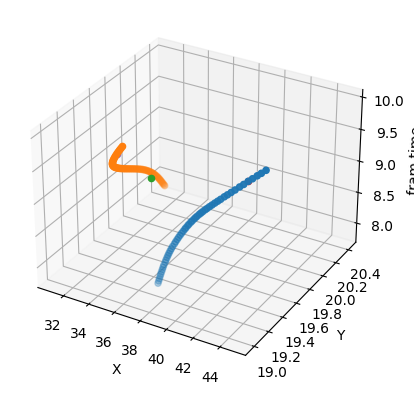

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[19, 9]
3.361855713151191
-----------------------------------------------------------------
[1, 10]
3.561504538432672


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[10, 1]
3.561504538432672
-----------------------------------------------------------------
[23, 20]
0.6142787318151354
The conflict between vehicle  23Vehicle type  [' Motorcycle'] and the vehicle   20Vehicle type  [' Motorcycle']


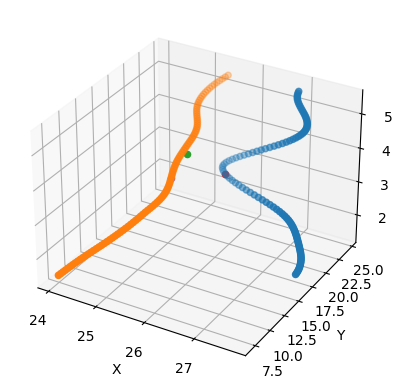

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[7, 14]
1.7881507692763137
-----------------------------------------------------------------
[14, 7]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


1.7881507692763137
-----------------------------------------------------------------
[20, 23]
-----------------------------------------------------------------
[6, 9]
-----------------------------------------------------------------
[4, 12]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

0.025246918112376462
The conflict between vehicle  4Vehicle type  [' Car'] and the vehicle   12Vehicle type  [' Car']


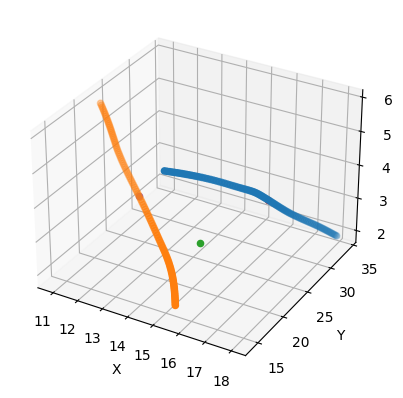

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[12, 45]
0.028963052542246816
The conflict between vehicle  12Vehicle type  [' Car'] and the vehicle   45Vehicle type  [' Motorcycle']


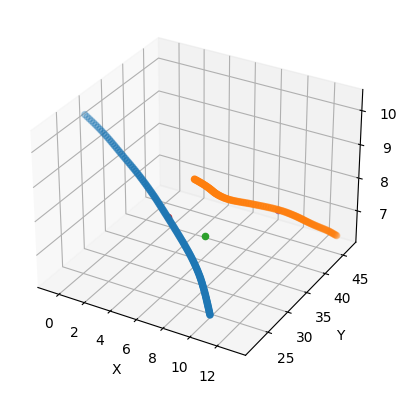

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[31, 20]
0.002994767511284595
The conflict between vehicle  31Vehicle type  [' Motorcycle'] and the vehicle   20Vehicle type  [' Motorcycle']


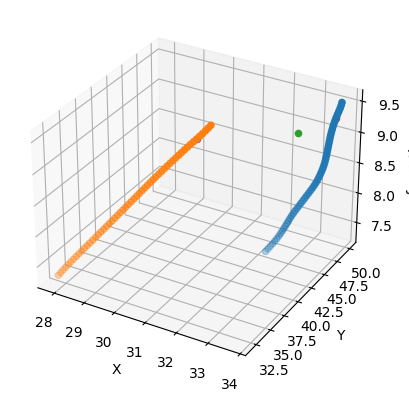

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[27, 12]
0.05369786697337329
The conflict between vehicle  27Vehicle type  [' Motorcycle'] and the vehicle   12Vehicle type  [' Car']


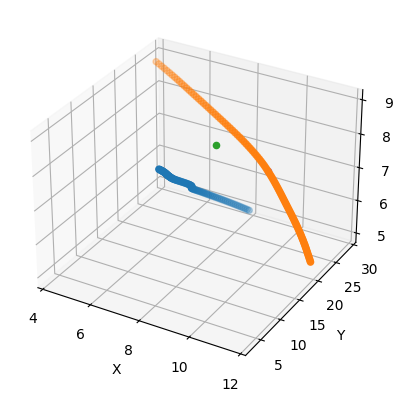

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[44, 45]
1.537948204243085
-----------------------------------------------------------------
[45, 46]
0.013193633375642874
The conflict between vehicle  45Vehicle type  [' Motorcycle'] and the vehicle   46Vehicle type  [' Motorcycle']


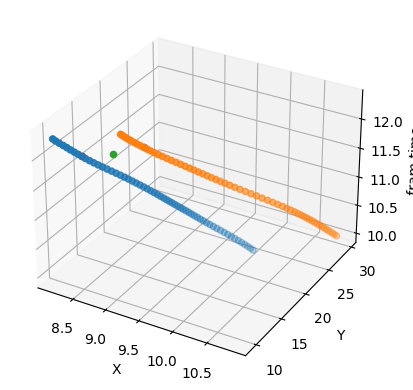

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[29, 6]
0.01769565782229601
The conflict between vehicle  29Vehicle type  [' Bicycle'] and the vehicle   6Vehicle type  [' Car']


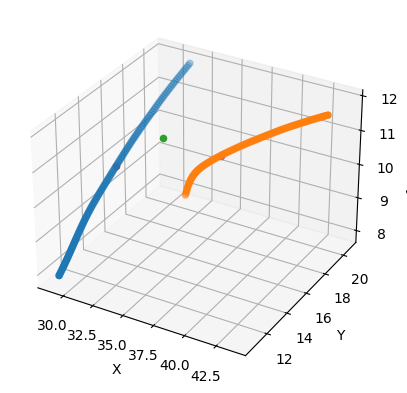

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[30, 27]
2.7541331845138117
-----------------------------------------------------------------
[43, 55]
3.354129906549364
-----------------------------------------------------------------
[46, 45]
-----------------------------------------------------------------
[21, 51]
4.347290825022363


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[51, 56]
0.05456929154347537
The conflict between vehicle  51Vehicle type  [' Car'] and the vehicle   56Vehicle type  [' Car']


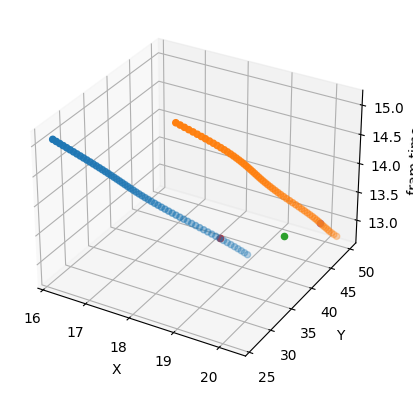

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[56, 51]
-----------------------------------------------------------------
[53, 57]
0.06805635909966672
The conflict between vehicle  53Vehicle type  [' Bicycle'] and the vehicle   57Vehicle type  [' Motorcycle']


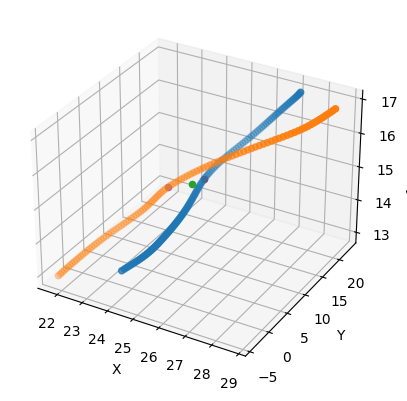

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[57, 53]
-----------------------------------------------------------------
[55, 56]
0.04531353046789277
The conflict between vehicle  55Vehicle type  [' Car'] and the vehicle   56Vehicle type  [' Car']


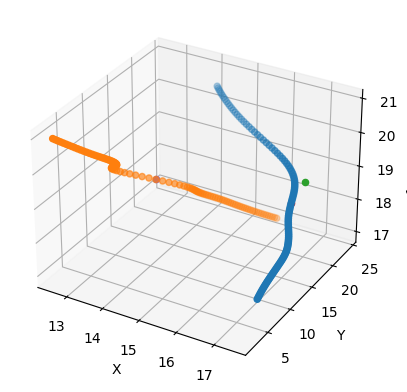

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[61, 74]
1.8442867835573697
-----------------------------------------------------------------
[68, 50]
3.445304343044911
-----------------------------------------------------------------
[71, 66]
0.10184817831969721
The conflict between vehicle  71Vehicle type  [' Motorcycle'] and the vehicle   66Vehicle type  [' Car']


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


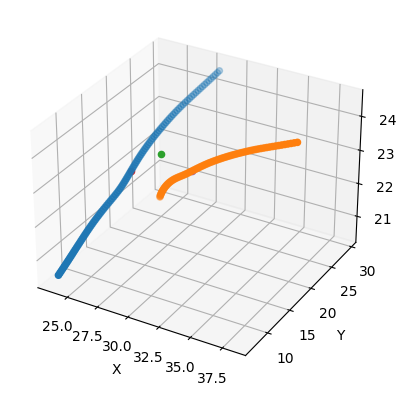

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[59, 66]
0.10881963600476563
The conflict between vehicle  59Vehicle type  [' Motorcycle'] and the vehicle   66Vehicle type  [' Car']


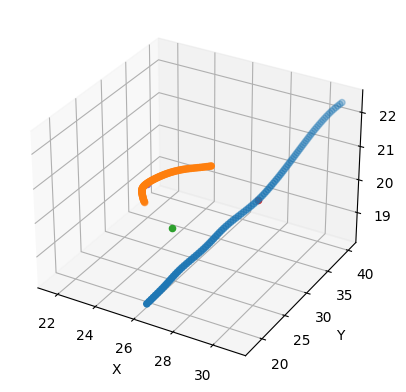

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[66, 71]
-----------------------------------------------------------------
[70, 55]
0.06784966901017128
The conflict between vehicle  70Vehicle type  [' Motorcycle'] and the vehicle   55Vehicle type  [' Car']


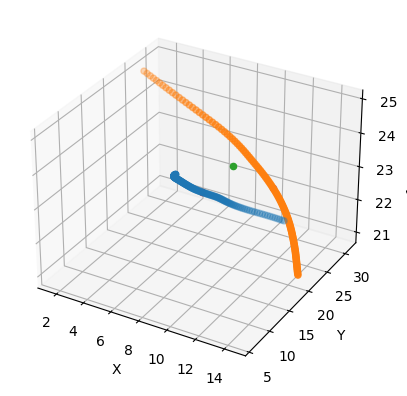

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[75, 61]
1.41694285172149
-----------------------------------------------------------------
[74, 76]
0.5596993045670472
The conflict between vehicle  74Vehicle type  [' Bicycle'] and the vehicle   76Vehicle type  [' Bicycle']


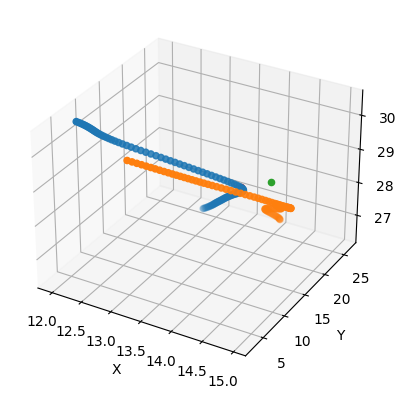

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[76, 74]
-----------------------------------------------------------------
[50, 68]
3.445304343044911
-----------------------------------------------------------------
[81, 82]
8.080866664499945
-----------------------------------------------------------------
[82, 81]
8.080866664499945
-----------------------------------------------------------------
[83, 84]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


0.02047493487311245
The conflict between vehicle  83Vehicle type  [' Car'] and the vehicle   84Vehicle type  [' Motorcycle']


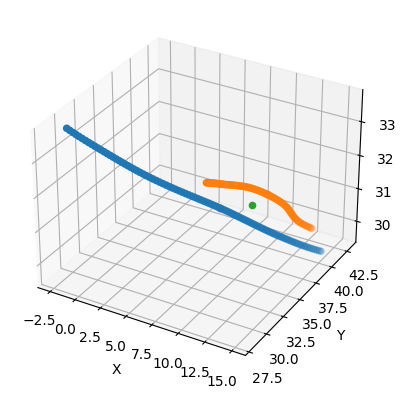

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[84, 83]
-----------------------------------------------------------------
[88, 89]
0.004797734828600438
The conflict between vehicle  88Vehicle type  [' Car'] and the vehicle   89Vehicle type  [' Car']


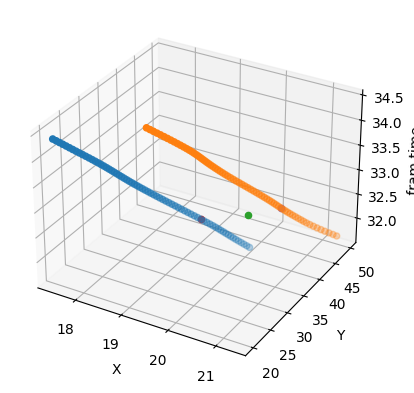

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[89, 88]
-----------------------------------------------------------------
[85, 96]
5.401096578481091
-----------------------------------------------------------------
[96, 90]
0.0782422776161094
The conflict between vehicle  96Vehicle type  [' Car'] and the vehicle   90Vehicle type  [' Motorcycle']


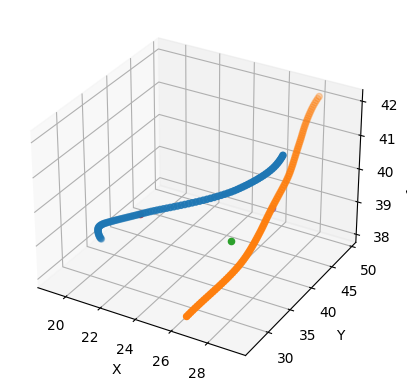

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[90, 92]
0.032945251332354215
The conflict between vehicle  90Vehicle type  [' Motorcycle'] and the vehicle   92Vehicle type  [' Car']


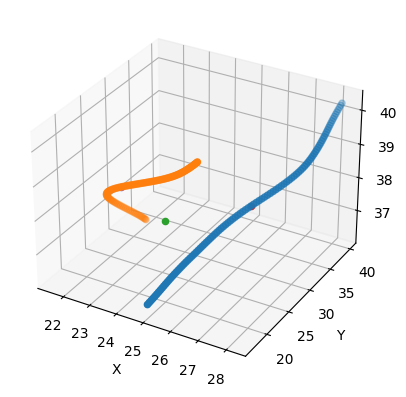

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[92, 90]
-----------------------------------------------------------------
[91, 93]
0.19310635146290064
The conflict between vehicle  91Vehicle type  [' Car'] and the vehicle   93Vehicle type  [' Motorcycle']


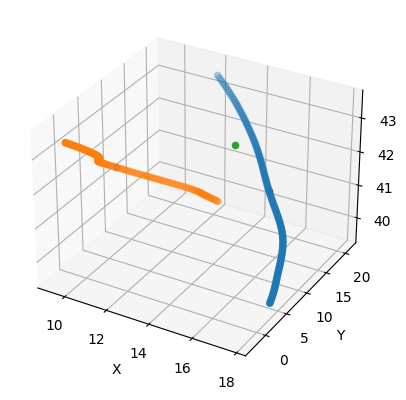

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[93, 91]
-----------------------------------------------------------------
[95, 100]
0.05554933779634628
The conflict between vehicle  95Vehicle type  [' Bicycle'] and the vehicle   100Vehicle type  [' Motorcycle']


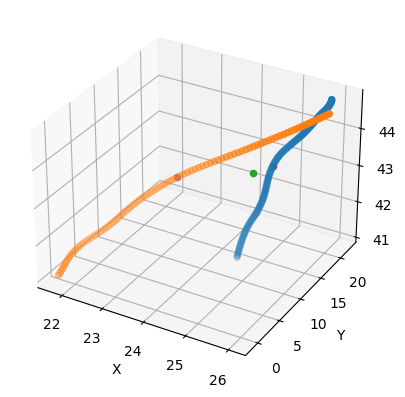

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[100, 95]
-----------------------------------------------------------------
[97, 91]
0.100404047645712
The conflict between vehicle  97Vehicle type  [' Bicycle'] and the vehicle   91Vehicle type  [' Car']


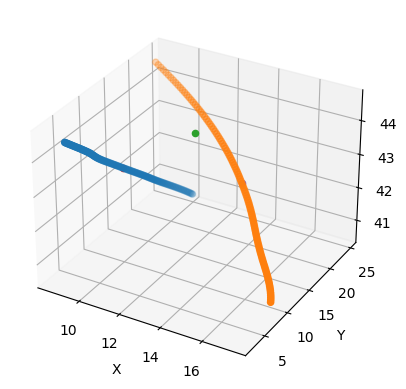

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[146, 161]
0.12386517317246262
The conflict between vehicle  146Vehicle type  [' Motorcycle'] and the vehicle   161Vehicle type  [' Motorcycle']


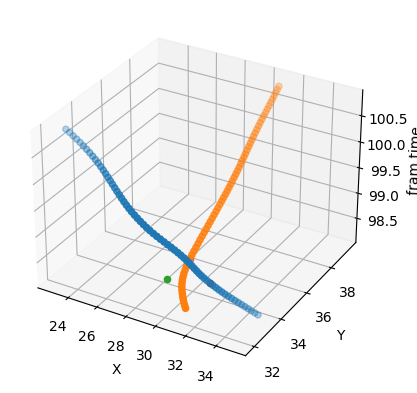

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[153, 161]
0.04031726929695554
The conflict between vehicle  153Vehicle type  [' Motorcycle'] and the vehicle   161Vehicle type  [' Motorcycle']


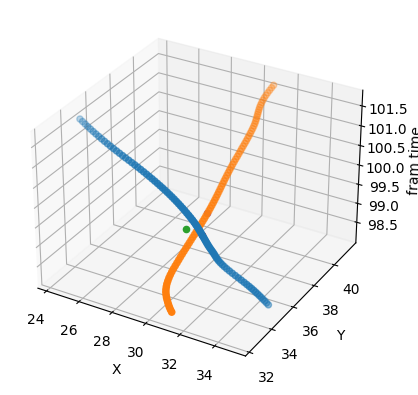

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[152, 153]
0.431080940767587
The conflict between vehicle  152Vehicle type  [' Motorcycle'] and the vehicle   153Vehicle type  [' Motorcycle']


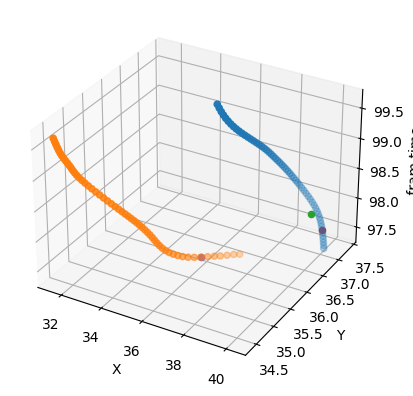

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[52, 128]
0.04333727479440568
The conflict between vehicle  52Vehicle type  [' Bicycle'] and the vehicle   128Vehicle type  [' Bicycle']


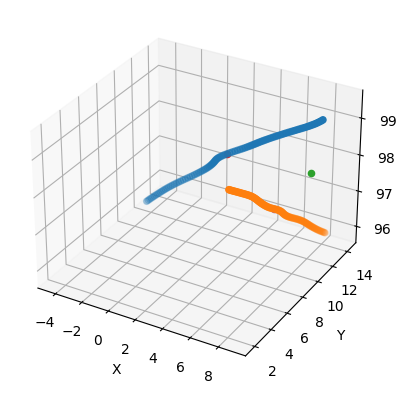

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[128, 52]
-----------------------------------------------------------------
[161, 146]
-----------------------------------------------------------------
[165, 170]
0.037656430170219524
The conflict between vehicle  165Vehicle type  [' Motorcycle'] and the vehicle   170Vehicle type  [' Motorcycle']


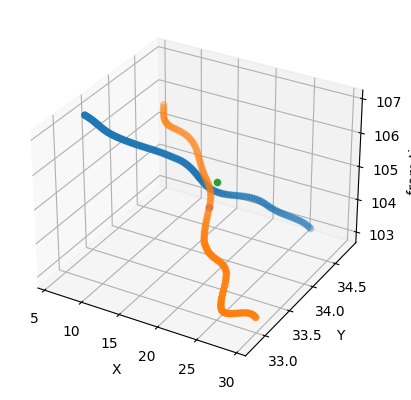

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[154, 156]
2.971689147825411
-----------------------------------------------------------------
[156, 154]
2.971689147825411
-----------------------------------------------------------------
[149, 170]
0.0381955852371365
The conflict between vehicle  149Vehicle type  [' Motorcycle'] and the vehicle   170Vehicle type  [' Motorcycle']


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

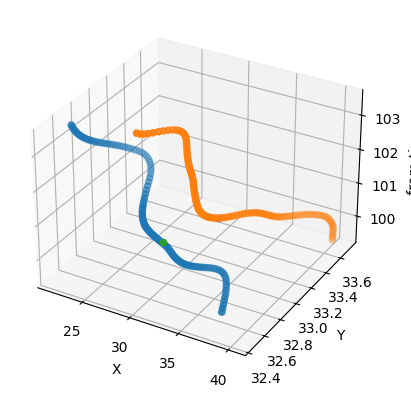

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[170, 165]
-----------------------------------------------------------------
[169, 168]
0.7186177282899785
The conflict between vehicle  169Vehicle type  [' Motorcycle'] and the vehicle   168Vehicle type  [' Bicycle']


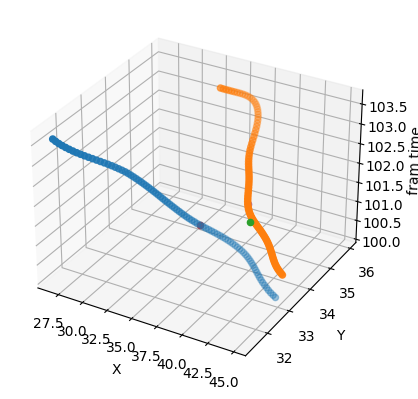

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[157, 137]
1.751109706679579
-----------------------------------------------------------------
[163, 181]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


0.03925119242529174
The conflict between vehicle  163Vehicle type  [' Bicycle'] and the vehicle   181Vehicle type  [' Motorcycle']


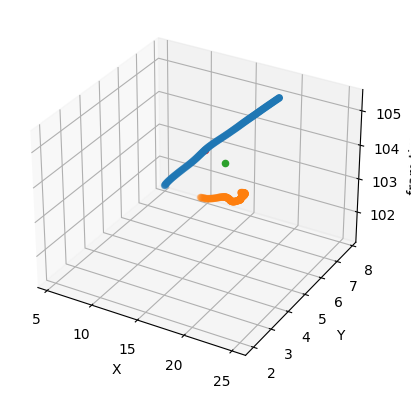

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[177, 139]
0.027770698269098743
The conflict between vehicle  177Vehicle type  [' Motorcycle'] and the vehicle   139Vehicle type  [' Bicycle']


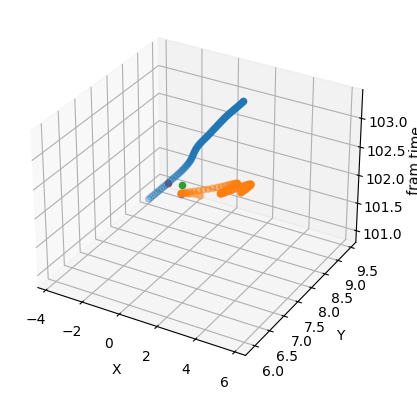

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[139, 177]
-----------------------------------------------------------------
[178, 165]
0.033657293961185546
The conflict between vehicle  178Vehicle type  [' Motorcycle'] and the vehicle   165Vehicle type  [' Motorcycle']


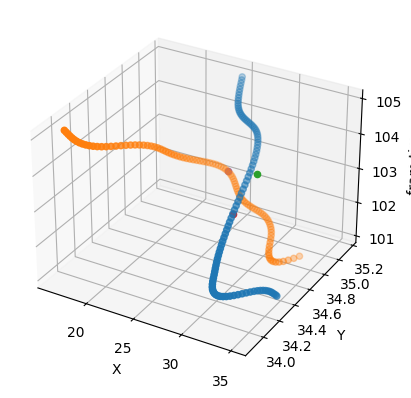

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[168, 174]
0.06345122012972677
The conflict between vehicle  168Vehicle type  [' Bicycle'] and the vehicle   174Vehicle type  [' Motorcycle']


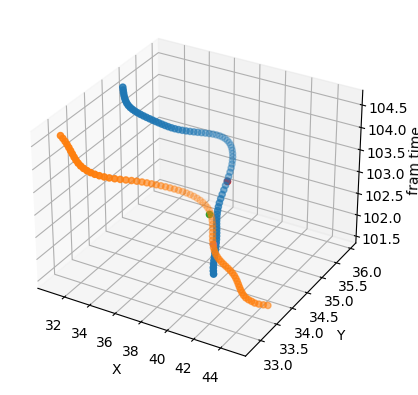

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[33, 172]
3.2183471366555465
-----------------------------------------------------------------
[172, 33]
3.2183471366555465
-----------------------------------------------------------------
[174, 168]
-----------------------------------------------------------------
[137, 157]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

1.751109706679579
-----------------------------------------------------------------
[187, 168]
1.417243662312656
-----------------------------------------------------------------
[181, 163]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
-----------------------------------------------------------------
[179, 177]
0.49139922703877104
The conflict between vehicle  179Vehicle type  [' Car'] and the vehicle   177Vehicle type  [' Motorcycle']


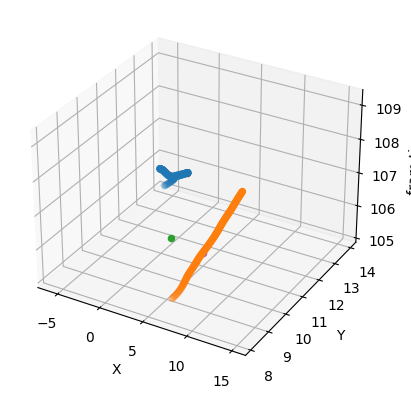

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[192, 139]
0.27582851254772306
The conflict between vehicle  192Vehicle type  [' Motorcycle'] and the vehicle   139Vehicle type  [' Bicycle']


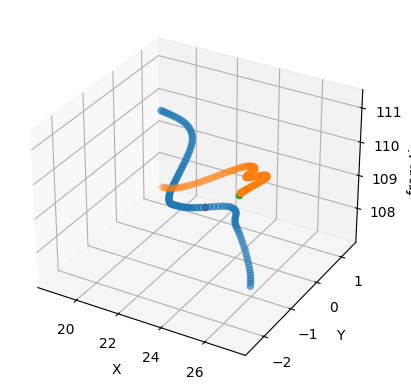

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[205, 224]
0.016464880586335825
The conflict between vehicle  205Vehicle type  [' Car'] and the vehicle   224Vehicle type  [' Motorcycle']


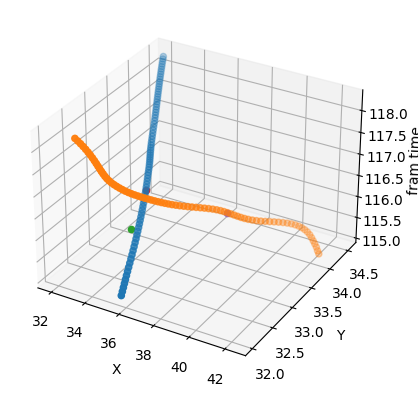

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[219, 205]
0.5839250766083859
The conflict between vehicle  219Vehicle type  [' Car'] and the vehicle   205Vehicle type  [' Car']


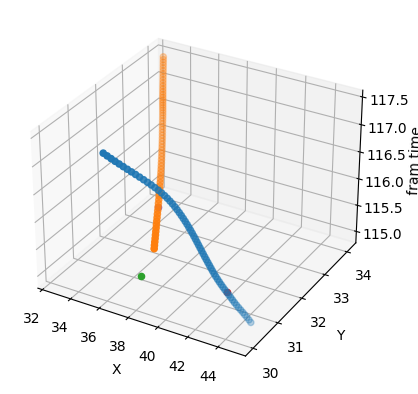

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[224, 205]
-----------------------------------------------------------------
[214, 177]
1.2637324241925618
-----------------------------------------------------------------
[230, 238]
3.2586651202485135
-----------------------------------------------------------------
[238, 230]
3.2586651202485135
-----------------------------------------------------------------
[226, 219]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


3.1329165718289276
-----------------------------------------------------------------
[209, 224]
1.229080501604117
-----------------------------------------------------------------
[244, 245]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


3.1974057990199847
-----------------------------------------------------------------
[245, 244]
3.1974057990199847
-----------------------------------------------------------------
[263, 265]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


2.5634943203481724
-----------------------------------------------------------------
[265, 263]
2.5634943203481724
-----------------------------------------------------------------
[24, 246]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


0.028424361356664842
The conflict between vehicle  24Vehicle type  [' Car'] and the vehicle   246Vehicle type  [' Motorcycle']


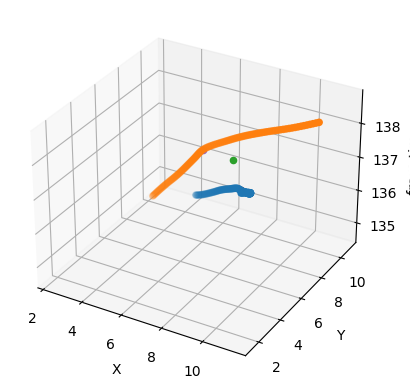

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[246, 24]
-----------------------------------------------------------------
[142, 246]
0.2469896485845911
The conflict between vehicle  142Vehicle type  [' Car'] and the vehicle   246Vehicle type  [' Motorcycle']


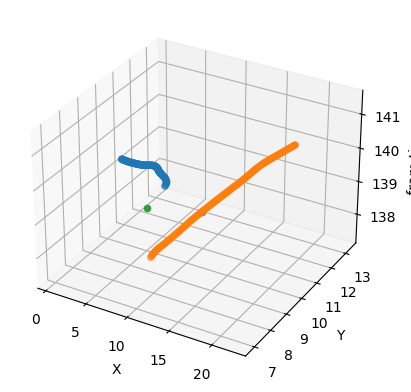

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[272, 269]
1.324179259612729
-----------------------------------------------------------------
[269, 272]
1.324179259612729
-----------------------------------------------------------------
[213, 227]
0.2768847255308284
The conflict between vehicle  213Vehicle type  [' Car'] and the vehicle   227Vehicle type  [' Car']


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


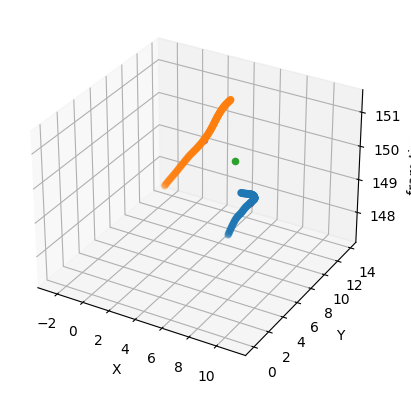

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[227, 213]
-----------------------------------------------------------------
[280, 269]
2.127628638543939
-----------------------------------------------------------------
[284, 287]
0.455056585881876
The conflict between vehicle  284Vehicle type  [' Bicycle'] and the vehicle   287Vehicle type  [' Motorcycle']


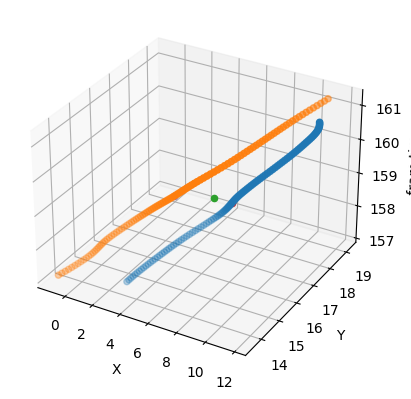

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[285, 284]
1.5811701627554378
-----------------------------------------------------------------
[287, 284]
-----------------------------------------------------------------
[292, 297]
0.11795313481486881
The conflict between vehicle  292Vehicle type  [' Car'] and the vehicle   297Vehicle type  [' Car']


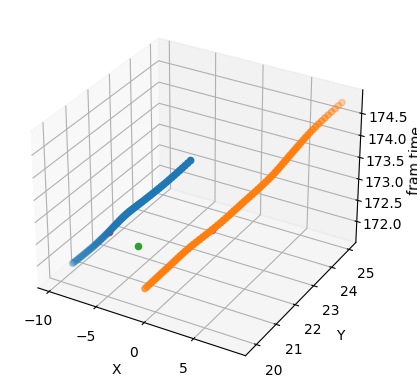

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[297, 292]
-----------------------------------------------------------------
[267, 292]
0.8924317739116499
The conflict between vehicle  267Vehicle type  [' Van'] and the vehicle   292Vehicle type  [' Car']


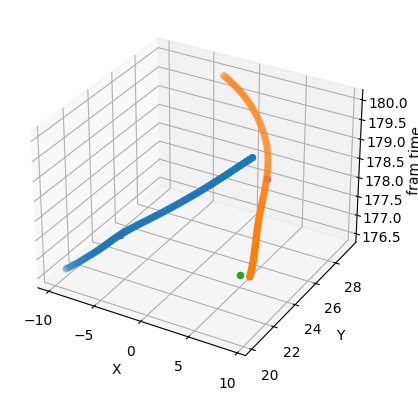

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[289, 326]
0.022765675395146675
The conflict between vehicle  289Vehicle type  [' Car'] and the vehicle   326Vehicle type  [' Car']


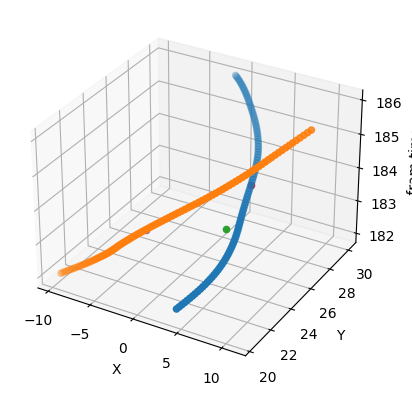

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[326, 289]
-----------------------------------------------------------------
[330, 343]
0.13385192175608795
The conflict between vehicle  330Vehicle type  [' Car'] and the vehicle   343Vehicle type  [' Car']


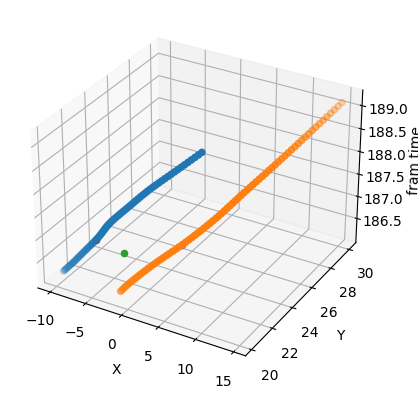

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[343, 330]
-----------------------------------------------------------------
[346, 330]
4.736569682204954
-----------------------------------------------------------------
[368, 371]
0.03420387393473786
The conflict between vehicle  368Vehicle type  [' Motorcycle'] and the vehicle   371Vehicle type  [' Bicycle']


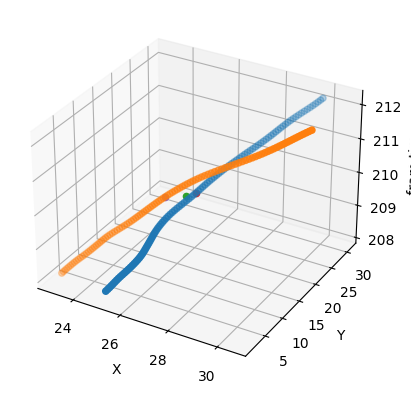

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[371, 368]
-----------------------------------------------------------------
[373, 394]
1.868144008695401
-----------------------------------------------------------------
[374, 384]
0.38777660903401595
The conflict between vehicle  374Vehicle type  [' Motorcycle'] and the vehicle   384Vehicle type  [' Motorcycle']


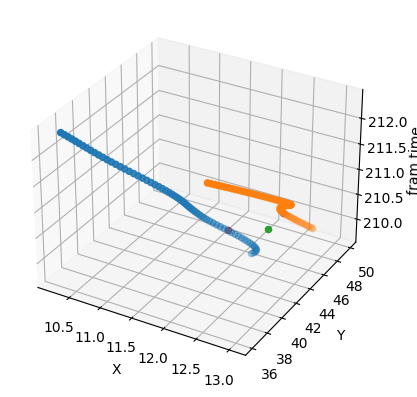

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[382, 371]
0.009364472115263745
The conflict between vehicle  382Vehicle type  [' Motorcycle'] and the vehicle   371Vehicle type  [' Bicycle']


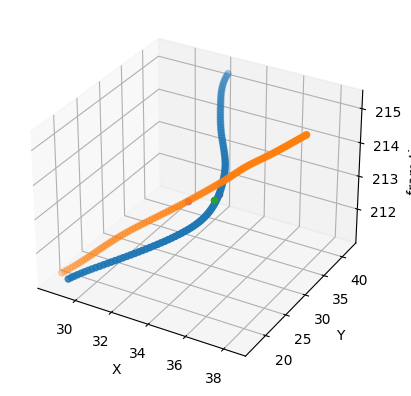

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[383, 400]
0.5413529549634837
The conflict between vehicle  383Vehicle type  [' Bicycle'] and the vehicle   400Vehicle type  [' Motorcycle']


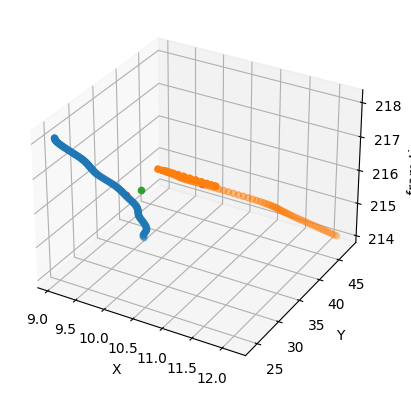

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[372, 382]
0.3685835270203396
The conflict between vehicle  372Vehicle type  [' Motorcycle'] and the vehicle   382Vehicle type  [' Motorcycle']


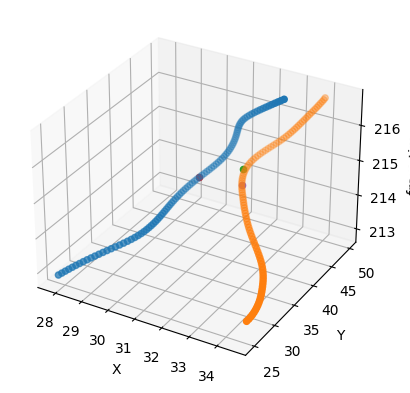

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[384, 388]
0.11376592176752749
The conflict between vehicle  384Vehicle type  [' Motorcycle'] and the vehicle   388Vehicle type  [' Motorcycle']


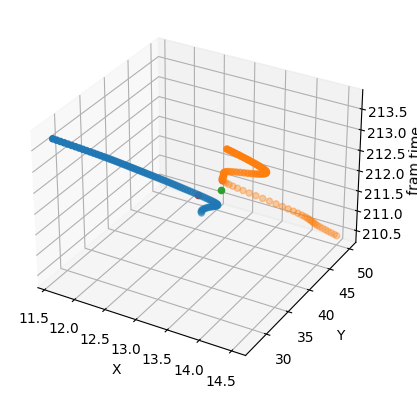

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


-----------------------------------------------------------------
[387, 318]
3.5416790628911303
-----------------------------------------------------------------
[375, 372]


<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)


0.02449456529491026
The conflict between vehicle  375Vehicle type  [' Motorcycle'] and the vehicle   372Vehicle type  [' Motorcycle']


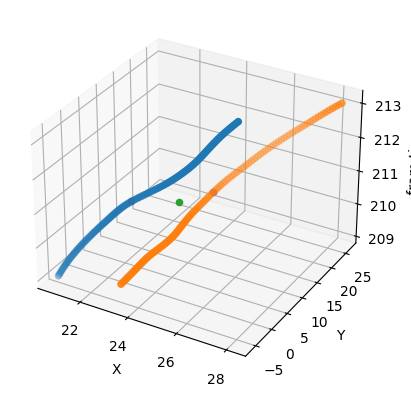

<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_vehicle = df_all_vehicle.append({"vehicle_id":vehicle_ID,'mean_TTC':vehicle_id_ttc},ignore_index=True)
<ipython-input-33-8deb990bb1c1>:39: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

-----------------------------------------------------------------
[388, 398]
0.3874329479259792
The conflict between vehicle  388Vehicle type  [' Motorcycle'] and the vehicle   398Vehicle type  [' Motorcycle']


In [ ]:
# input the dataset of Traffic conflict
# /content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Car_to_bike.csv
Orginal_trajectory_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/C0006.csv'
Orginal_trajectory =  pd.read_csv(Orginal_trajectory_path)
# print(Orginal_trajectory)
data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_C0006.csv'
car_conflict_TTC = pd.read_csv(data_path)

# Creat_Empty_Matrix 
Columns_name = ['m_vehicle_id','frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y',
                'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                'cross_point_x', 'cross_point_y', 'PET','TTC']
'Creat the list to save all time result'
df_TTC = pd.DataFrame(columns=Columns_name)

# Extract the event of conflict value blow 2 seconds
Car_car_TTC_lesss_2 = car_conflict_TTC[car_conflict_TTC['TTC']<=5]
# the main vehicle trajectory
Main_car_id = pd.unique(Car_car_TTC_lesss_2['m_vehicle_id'])
# the sub vehicle trajectory
Sub_car_id = pd.unique(Car_car_TTC_lesss_2['sub_vehicle_id'])

Conflict_event_chain=pd.DataFrame(columns=Columns_name)

# creat a new matrix for saving the conflict pair
Conflict_matrix = [1,1]

# Search the point where the TTC value is mininum
for car_id in Main_car_id:
    # the orginal trajectory 
    Main_orginal_trajectory = Orginal_trajectory[Orginal_trajectory['vehicle_id']==car_id]
    TTC_set_Main_car = Car_car_TTC_lesss_2[Car_car_TTC_lesss_2['m_vehicle_id']==car_id]
    TTC_set_Main_car_T = pd.DataFrame(TTC_set_Main_car)
    # calculate the ttc
    Veh_ty1,Veh_ty2,Veh_ty3 = Detect_interacte_object(TTC_set_Main_car_T)
    dis_min_sub = Distance(Veh_ty1)
    # Minimum_ttc_fram,Min_ttc,Mean_ttc,Std_ttc,conflict_point = Detect_Risk_frame(TTC_set_Main_car)  # detect the risk frame
    Minimum_ttc_fram,Min_ttc,Mean_ttc,Std_ttc,conflict_point = Detect_Risk_frame(Veh_ty1)  # detect the risk frame
    Minimum_ttc_fram = Minimum_ttc_fram.values
    conflict_point_x = conflict_point['cross_point_x'].values
    conflict_point_y = conflict_point['cross_point_y'].values
    conflict_point['time_frame']=Minimum_ttc_fram
    print('-----------------------------------------------------------------')
    if dis_min_sub <20:
      sub_vehicle_id = Veh_ty1['sub_vehicle_id'].values[0]
      Pair_conflict = [car_id,sub_vehicle_id]
      print(Pair_conflict)
      inverter_pair_conflict = [sub_vehicle_id,car_id]

      if inverter_pair_conflict not in Conflict_matrix:

        Sub_orginal_trajectory = Orginal_trajectory[Orginal_trajectory['vehicle_id']==sub_vehicle_id]
        Event_main_traj,Event_sub_traj = conflict_event(Veh_ty1,Main_orginal_trajectory,Sub_orginal_trajectory,50)
        min_dis_min_sub = detect_cross_trajectory(Event_main_traj,Event_sub_traj)

        if min_dis_min_sub<=1:
          Veh_ty1 = pd.DataFrame(Veh_ty1)
          Veh_ty1.columns = ['m_vehicle_id','frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y','m_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y','sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                  'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y','cross_point_x', 'cross_point_y', 'PET','TTC']
          Min_veh_type = Veh_ty1['m_vehicle_type'].values
          Sun_veh_type = Veh_ty1['sub_vehicle_type'].values
          # print(Min_veh_type,Sun_veh_type)
          # Veh_ty1.rename(columns={'m_frame_time':'frame_time'})
          integer_Conflict_Vhe_ty1 = [Conflict_event_chain,Veh_ty1]
          Conflict_event_chain = pd.concat(integer_Conflict_Vhe_ty1)

          # if (len(traffic_conflict_course_main)>0) &(len(traffic_conflict_course_sub)>0)&(len(Minimum_TTC_postion)):
          #   # print(traffic_conflict_course_main,traffic_conflict_course_sub)
          #   # here we should save the conflict trajectory data
          #   # print(traffic_conflict_course_main)
          #   df_TTC = pd.concat([df_TTC,traffic_conflict_course_main], axis=0, ignore_index=True)

          Conflict_event = Save_conflict_event(Event_main_traj,Event_sub_traj)
          integer_Conflict_event_chain = [Conflict_event_chain,Conflict_event]
          Conflict_event_chain = pd.concat(integer_Conflict_event_chain)
          Conflict_matrix.append(Pair_conflict)

          print('The conflict between vehicle  '+str(car_id) +'Vehicle type  '+str(Min_veh_type)+' and the vehicle   '+str(sub_vehicle_id) +'Vehicle type  '+str(Sun_veh_type))
          # print(Event_main_traj,Event_sub_traj)
          # plt.scatter(traffic_conflict_course_main['m_world_x'],traffic_conflict_course_main['m_world_y'])
          # plt.scatter(traffic_conflict_course_sub['m_world_x'],traffic_conflict_course_sub['m_world_y'])
          # plt.scatter(Event_main_traj['m_world_x'],Event_main_traj['m_world_y'])
          # plt.scatter(Event_sub_traj['sub_world_x'],Event_sub_traj['sub_world_y'])
          # plt.scatter(conflict_point['cross_point_x'],conflict_point['cross_point_y'])
          # plt.scatter(Veh_ty1['m_world_x'],Veh_ty1['m_world_y'])
          # plt.scatter(Veh_ty1['sub_world_x'],Veh_ty1['sub_world_y'])
          fig = shown_trajectory(Conflict_event,conflict_point)
          plt.show()

In [ ]:
Conflict_event_chain
Save_path_pet = '/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_event_car_ebike_c0006.csv'
car_to_car_conflict = Save_TTC_data(Conflict_event_chain,Save_path_pet)

### 重新计算交互过程的TTC

In [ ]:
data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_event_car_ebike_c0008.csv'
car_conflict_event = pd.read_csv(data_path)
car_conflict_event
#剔除重复轨迹
Main_veh_ids = car_conflict_event[['m_vehicle_id','sub_vehicle_id']].drop_duplicates()
Sub_veh_ids = car_conflict_event[['sub_vehicle_id','m_vehicle_id']].drop_duplicates()
Main_veh_ids = pd.DataFrame(Main_veh_ids)
M_veh_id = Main_veh_ids
Sub_veh_ids = pd.DataFrame(Sub_veh_ids)
Sub_veh_id = Sub_veh_ids
print(Main_veh_ids.iloc[1])
print(Sub_veh_ids.iloc[1])
# 查看两个列表的交集
delect = pd.DataFrame(columns=['m_vehicle_id','sub_vehicle_id'])
Repeat = []
NON_Repeat=[]
for mid in range(0,len(Main_veh_ids),1):
  M_sub_id = Main_veh_ids.iloc[mid]
  M_sub_id_value = M_sub_id.values

  for sid in range(0,len(Sub_veh_ids),1):
    Sub_m_id = Sub_veh_ids.iloc[sid]
    Sub_m_id_value = Sub_m_id.values
    A = (M_sub_id_value-Sub_m_id_value)
    if (A[0]==0)&(A[1]==0):
      # delect['m_vehicle_id'] = M_sub_id_value[0]
      # delect['sub_vehicle_id'] = M_sub_id_value[1]
      # Main_veh_ids = Main_veh_ids - delect
      # 删除原始数据id
      Repeat.append(M_sub_id.values)
      # 删除最新数据ID
    else:
      NON_Repeat.append(M_sub_id.values)
Repeat = pd.DataFrame(Repeat)
NON_Repeat = pd.DataFrame(NON_Repeat)
Repeat.columns=['m_vehicle_id','sub_vehicle_id']
Repeat.sort_values(by='m_vehicle_id', ascending=True, inplace=True)
NON_Repeat.columns=['m_vehicle_id','sub_vehicle_id']
# M_veh_id.sort_values(by='m_vehicle_id', ascending=True, inplace=True)
# Main_veh_ids.sort_values(by='m_vehicle_id', ascending=True, inplace=True)
Save_path_pet = '/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/repeat_C0008.csv'
car_to_car_conflict = Save_TTC_data(Repeat,Save_path_pet)

m_vehicle_id      188
sub_vehicle_id    278
Name: 145, dtype: int64
sub_vehicle_id    278
m_vehicle_id      188
Name: 145, dtype: int64


In [ ]:
from matplotlib.projections.polar import ThetaTick
# Generate columns
Columns_name = ['m_vehicle_id','m_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y',
                'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                'cross_point_x', 'cross_point_y', 'PET','TTC']

'Creat the list to save all time result'
df_all_time = pd.DataFrame(columns=Columns_name)
for num_id in range(0,len(Time_frames),1):
    # uqdate with time_frame............................jhkjkh
    # 'Creat the list to save every frame time result'
#     print('............................................new time......................................................')
    if num_id < len(Time_frames):
        time_frame = Time_frames[num_id]
        print(time_frame)
        Traj_same_time = traj_data[traj_data['frame_time'] == time_frame]
        Veh_same_times = pd.unique(Traj_same_time['vehicle_id'])
        #Need to determine if there is still a vehicle in the system in the next second
        Next_fram_time = time_frame+0.04
        Veh_same_times_next_frame_time = traj_data[traj_data['frame_time'] == Next_fram_time]
        if len(Veh_same_times) >= 2 and len(Veh_same_times_next_frame_time) >= 2:
            'create a list save each main vehicle'
            A = pd.DataFrame(
                    columns=['m_vehicle_id', 'm_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x',
                             'm_speed_y', 'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                             'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x',
                             'sub_speed_y',
                             'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                             'cross_point_x', 'cross_point_y', 'PET','TTC']
                             )
            for veh_id in Veh_same_times:
                # the main vehicel Uqdate with vehicle_id    
#                 print('------------------------'+str(veh_id)+'----------------------------------------------')
                Traj_M_veh = Traj_same_time[Traj_same_time['vehicle_id'] == veh_id]
                Traj_M_veh = pd.DataFrame(Traj_M_veh)
                df_main_veh = pd.DataFrame(
                    columns=['m_vehicle_id', 'm_frame_time','m_vehicle_type', 'm_world_x', 'm_world_y', 'm_speed_x',
                             'm_speed_y', 'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y',
                             'sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x',
                             'sub_speed_y',
                             'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y',
                             'cross_point_x', 'cross_point_y', 'PET','TTC'])
                df_main_veh[
                    ['m_vehicle_id', 'm_frame_time', 'm_vehicle_type','m_world_x', 'm_world_y', 'm_speed_x', 'm_speed_y',
                     'm_acc_x', 'm_acc_y', 'm_Jerk_x', 'm_Jerk_y']] = Traj_M_veh       
                Veh_a_point = Veh_motion_state(traj_data, veh_id, time_frame)       
                if len(Veh_a_point) >= 2:
                    Speed_a = Speed_Caluca(Veh_a_point)
                    Line_parmeter_1 = Montion_Equations(Veh_a_point)
                    Sub_Veh_same_time = Veh_same_times
                    'creat a list to save the result of every sub_veh_variable'
                    Sub_vehicle_temp = pd.DataFrame(columns=['sub_veh_id', 'cross_point_x', 'cross_point_y', 'PET','TTC'])
                    Sub_veh_id_A = []
                    cross_point_B = []
                    PET_C = []
                    TTC_C =[]
                    for Sub_veh_id in Sub_Veh_same_time:
                        #for Sub_veh_id in Sub_Veh_same_time:
#                         print('==================================='+str(Sub_veh_id)+'=====================================')
                        'extracte the motion state of sub vehicle'
                        Traj_sub_veh = Traj_same_time[Traj_same_time['vehicle_id'] == Sub_veh_id]
                        Veh_b_point = Veh_motion_state(traj_data, Sub_veh_id, time_frame)
                        if len(Veh_b_point) >= 2:
                            Speed_b = Speed_Caluca(Veh_b_point)
                            Line_parmeter_2 = Montion_Equations(Veh_b_point)   
                            'Calculate the cross point'
                            cross_point = Point_of_cross(Line_parmeter_1, Line_parmeter_2)
                            # if there are no cross points, we should stop the next step
                            if len(cross_point) != 0:
                                'calculate the PET'
                                conflict_pet = PET(cross_point, Speed_a, Speed_b, Veh_a_point, Veh_b_point)
                                'Calculate the TTC'
                                conflict_TTC = TTC(cross_point, Speed_a, Speed_b, Veh_a_point, Veh_b_point)
                                # creat a list which contain the vehicle information and the PET at every frame
                                Sub_veh_id_A.append(Sub_veh_id)
                                cross_point_B.append(cross_point.values[0])
                                PET_C.append(conflict_pet)
                                TTC_C.append(conflict_TTC)

                    Sub_veh_id = pd.DataFrame(Sub_veh_id_A)
                    Sub_vehicle_temp['sub_veh_id'] = Sub_veh_id_A
                    Sub_vehicle_temp[['cross_point_x','cross_point_y']] = cross_point_B
                    Sub_vehicle_temp['PET'] = PET_C
                    Sub_vehicle_temp['TTC'] = TTC_C
                    Min_pet_value = min(Sub_vehicle_temp['TTC'])
                    Min_pet_sub_veh = Sub_vehicle_temp[Sub_vehicle_temp['TTC'] == Min_pet_value]
                    MIN_PET_SUB = Min_pet_sub_veh[['cross_point_x', 'cross_point_y', 'PET','TTC']]
                    sub_veh_min_pet_id = Min_pet_sub_veh['sub_veh_id'].values[0]

                sub_veh_inf = Traj_same_time[Traj_same_time['vehicle_id'] == sub_veh_min_pet_id]
                traj_data_sub_min_pet_id = sub_veh_inf[
                    ['vehicle_id', 'vehicle_type', 'world_x', 'world_y', 'speed_x', 'speed_y', 'acc_x', 'acc_y', 'Jerk_x','Jerk_y']]
                traj_data_sub_min_pet_id = pd.DataFrame(traj_data_sub_min_pet_id)
                df_main_veh[
                    ['sub_vehicle_id', 'sub_vehicle_type', 'sub_world_x', 'sub_world_y', 'sub_speed_x', 'sub_speed_y',
                     'sub_acc_x', 'sub_acc_y', 'sub_Jerk_x', 'sub_Jerk_y']] = traj_data_sub_min_pet_id.values[0]
                df_main_veh[['cross_point_x', 'cross_point_y', 'PET','TTC']] = MIN_PET_SUB.values[0]
                # Integration of all vehicle data at the same moment
                integer_A_df_main_veh = [A,df_main_veh]
                A = pd.concat(integer_A_df_main_veh)

    Integer_A_all_time = [df_all_time,A]
    df_all_time = pd.concat(Integer_A_all_time) 
    # print(df_all_time)
df_all_time.to_csv('/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_C0007.csv',index=False, header=True)

In [ ]:
def Speed_Caluca(Traj_OD,time_gap):
    # 计算速度值
    # print(Traj_OD)
    Delta = (Traj_OD.values[1] - Traj_OD.values[0])
    squre = [num * num for num in Delta]
    Sum = sum(squre)
    Distance = math.sqrt(Sum)
    Speed = Distance / time_gap
    return Speed

def First_Montion_Equations(Traj_OD):
    # 根据已知的两点计算直线方程
    # 创建一个空的 DataFrame
    Line_parmeter = pd.DataFrame(columns=['A', 'B', 'C'],index=[1]) # if you want create a new datafram you should add index=[1], it mean row
    Line_parmeter['A'] = Traj_OD['m_world_y'].values[1]-Traj_OD['m_world_y'][0]
    Line_parmeter['B'] = Traj_OD['m_world_x'].values[0] - Traj_OD['m_world_x'][1]
    Line_parmeter['C']= Traj_OD['m_world_x'].values[1]*Traj_OD['m_world_y'].values[0]-Traj_OD['m_world_x'].values[0]*Traj_OD['m_world_y'].values[1]
    return Line_parmeter

def Second_Montion_Equations(Traj_OD):
    # 根据已知的两点计算直线方程
    # 创建一个空的 DataFrame
    Line_parmeter = pd.DataFrame(columns=['A', 'B', 'C'],index=[1]) # if you want create a new datafram you should add index=[1], it mean row
    Line_parmeter['A'] = Traj_OD['sub_world_y'].values[1]-Traj_OD['sub_world_y'][0]
    Line_parmeter['B'] = Traj_OD['sub_world_x'].values[0] - Traj_OD['sub_world_x'][1]
    Line_parmeter['C']= Traj_OD['sub_world_x'].values[1]*Traj_OD['sub_world_y'].values[0]-Traj_OD['sub_world_x'].values[0]*Traj_OD['sub_world_y'].values[1]
    return Line_parmeter

def Point_of_cross(Line_parmeter_1,Line_parmeter_2):
    # 计算两条直线的相交点
    Point_cross = pd.DataFrame()
    D = (Line_parmeter_1['A'].values)*(Line_parmeter_2['B'].values)-(Line_parmeter_2['A'].values)*(Line_parmeter_1['B'].values)
    # what is the D?
    if D !=0:
        point_x = ((Line_parmeter_1['B'].values)*(Line_parmeter_2['C'].values)-(Line_parmeter_2['B'].values)*(Line_parmeter_1['C'].values))/D
        Point_cross['world_x'] = point_x
        point_y = ((Line_parmeter_2['A'].values)*(Line_parmeter_1['C'].values)-(Line_parmeter_1['A'].values)*(Line_parmeter_2['C'].values))/D
        Point_cross['world_y'] = point_y
    # else:
    #     print("两直线平行")
    return Point_cross

def PET(Point_cross,speed_A,speed_B,Traj_OD_A,Traj_OD_B):
  # calculate the PET between the two vehicle
  # Calculate the time for vehicle A to reach the conflict point
  # 'if there is no point of cross, we will not calculate the time'
  Delta_dis = Traj_OD_A.values[1]-Traj_OD_B.values[1]
  squre_dis = [num*num for num in Delta_dis]
  sum_dis = sum(squre_dis)
  Dis = math.sqrt(sum_dis)
  if Dis <= 10:
    if len(Point_cross)>=1:
      Delta_a = Point_cross.values[0]-Traj_OD_A.values[1]
      squre_a = [num*num for num in Delta_a]
      sum_dis_a = sum(squre_a)
      Dis_cross_a = math.sqrt(sum_dis_a)
      time_point_a = Dis_cross_a/speed_A
      # Calculate the time for car B to reach the conflict point
      Delta_b = Point_cross.values[0]-Traj_OD_B.values[1]
      squre_b = [num*num for num in Delta_b]
      sum_dis_b = sum(squre_b)
      Dis_cross_b = math.sqrt(sum_dis_b)
      time_point_b = Dis_cross_b/speed_B
      # 计算经过冲突点的时间
      PET_value = abs(time_point_a-time_point_b)
    else:
      # print('There is no cross point')
      PET_value = 10000
  else:
    PET_value = 9999
  return PET_value

def TTC(Point_cross,speed_A,speed_B,Traj_OD_A,Traj_OD_B):
  # calculate the PET between the two vehicle
  # Calculate the time for vehicle A to reach the conflict point
  # 'if there is no point of cross, we will not calculate the time'
  Delta_dis = Traj_OD_A.values[1]-Traj_OD_B.values[1]
  squre_dis = [num*num for num in Delta_dis]
  sum_dis = sum(squre_dis)
  Dis = math.sqrt(sum_dis)
  if Dis <= 10:
    if len(Point_cross)>=1:
      Delta_a = Point_cross.values[0]-Traj_OD_A.values[1]
      squre_a = [num*num for num in Delta_a]
      sum_dis_a = sum(squre_a)
      Dis_cross_a = math.sqrt(sum_dis_a)
      time_point_a = Dis_cross_a/speed_A
      # Calculate the time for car B to reach the conflict point
      Delta_b = Point_cross.values[0]-Traj_OD_B.values[1]
      squre_b = [num*num for num in Delta_b]
      sum_dis_b = sum(squre_b)
      Dis_cross_b = math.sqrt(sum_dis_b)
      time_point_b = Dis_cross_b/speed_B
      # 计算经过冲突点的时间
      ttc_time_aver = abs(time_point_a-time_point_b)
      if ttc_time_aver < 0.1:
        TTC = min(time_point_a,time_point_b)
      else:
        TTC = 10000
    else:
      # print('There is no cross point')
      TTC = 999999
  else:
    TTC = 999999
  return TTC

def First_Veh_motion_state(traj_all_data,veh_id,Time_frame):
    'extracte the motion state of vehicle_id'
    "提取MAIN车在time_frame时刻的运动状态"
    Traj_veh_id = traj_all_data[traj_all_data['m_vehicle_id'] == veh_id]
    Time_frame = np.around(Time_frame, decimals=2)
    Traj_veh_id_time_O = Traj_veh_id[Traj_veh_id['frame_time'] == Time_frame]
    Next_frame = Time_frame+0.04
    Next_frame = np.around(Next_frame, decimals=2)
    Traj_veh_id_time_D = Traj_veh_id[Traj_veh_id['frame_time'] == Next_frame]
    Traj_veh_id_OD = pd.concat([Traj_veh_id_time_O, Traj_veh_id_time_D], ignore_index=True)
    Veh_a_point = Traj_veh_id_OD[['m_world_x', 'm_world_y']]
    # print(Veh_a_point)
    return Veh_a_point

def Second_Veh_motion_state(traj_all_data,veh_id,Time_frame):
    'extracte the motion state of vehicle_id'
    "提取SUB车在time_frame时刻的运动状态"
    Traj_veh_id = traj_all_data[traj_all_data['sub_vehicle_id'] == veh_id]
    Time_frame = np.around(Time_frame, decimals=2)
    Traj_veh_id_time_O = Traj_veh_id[Traj_veh_id['frame_time'] == Time_frame]
    Next_frame = Time_frame+0.04
    Next_frame = np.around(Next_frame, decimals=2)
    Traj_veh_id_time_D = Traj_veh_id[Traj_veh_id['frame_time'] == Next_frame]
    Traj_veh_id_OD = pd.concat([Traj_veh_id_time_O, Traj_veh_id_time_D], ignore_index=True)
    Veh_a_point = Traj_veh_id_OD[['sub_world_x', 'sub_world_y']]
    # print(Veh_a_point)
    return Veh_a_point  



import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# 创建一个3D坐标系
def shown_trajectory(trajectory):

  fig = plt.figure()
  ax = fig.add_subplot(111, projection='3d')

  Z = trajectory['frame_time']
  X1 = trajectory['m_world_x']
  Y1 = trajectory['m_world_y']

  X2 = trajectory['sub_world_x']
  Y2 = trajectory['sub_world_y']
  # 绘制散点图
  ax.scatter(X1, Y1, Z)
  ax.scatter(X2, Y2, Z)

  # 设置坐标轴标签
  ax.set_xlabel('X')
  ax.set_ylabel('Y')
  ax.set_zlabel('fram time')
  return fig


--------------------------------------------------------------------------
18
[155]
155


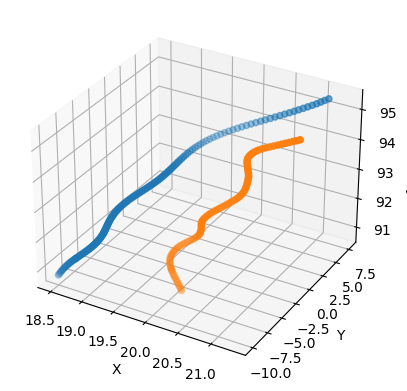

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.5189420386968029
1.567620198354153
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.944467998948178
1.879579336328527
10000
--------------------------------------------------------------------------
269
[266]
266


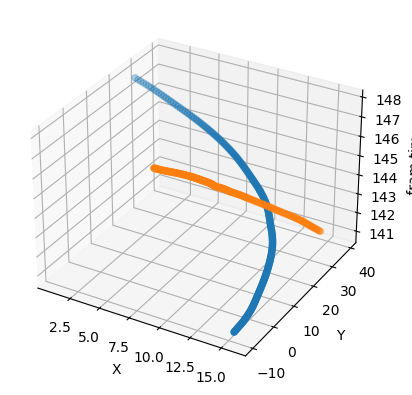

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.9368804789408803
0.9392072863144395
0.8910042520508157
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999

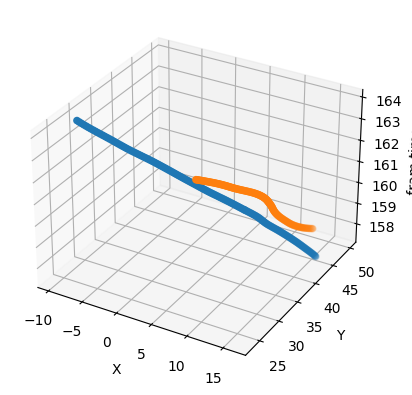

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
4.006681521691365
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5328670161392288
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999


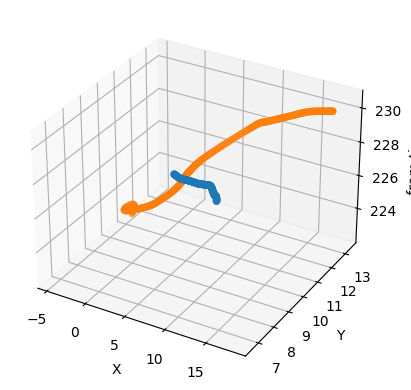

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.0370608450270002
2.0567748162115933
2.0220595991601376
10000
1.9034219924560103
10000
2.0385830691353166
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.4568364784706345
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1000

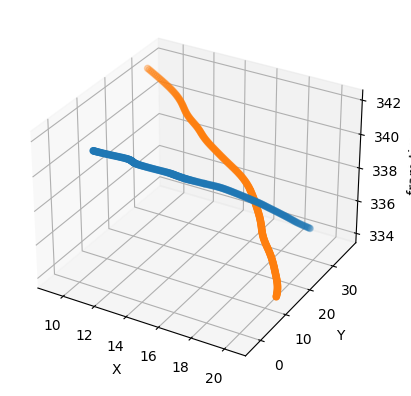

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.8577398772408165
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999

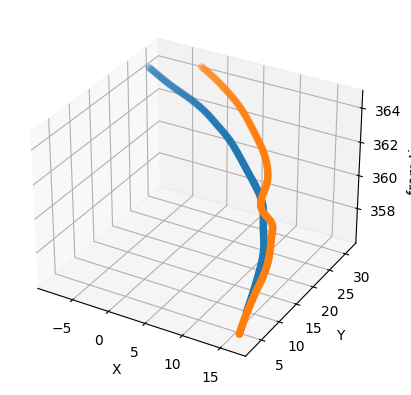

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
13.711282047631444
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
100

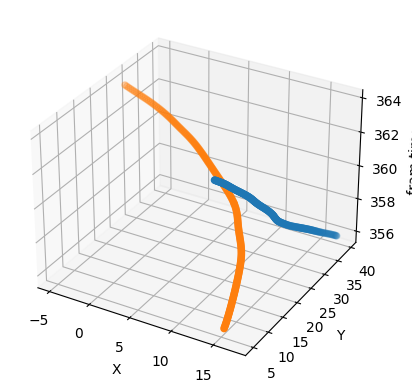

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
9

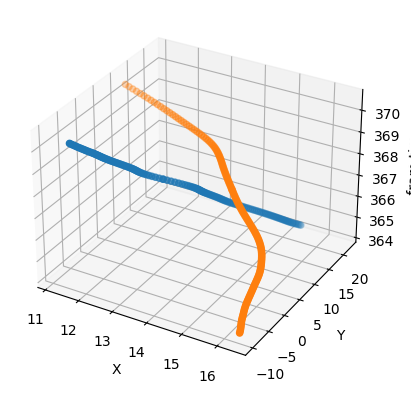

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5606115233521342
0.5986850799811683
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999


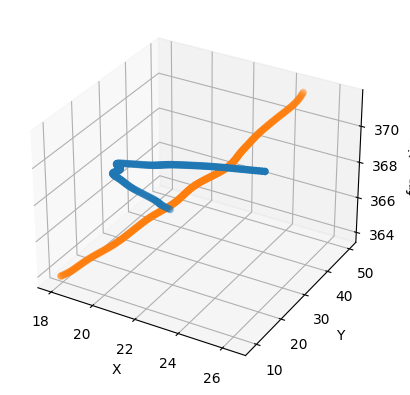

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.599290900201007
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
99

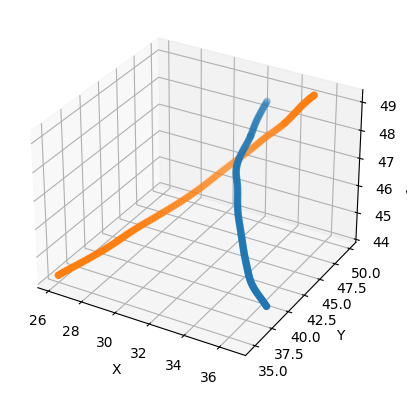

999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
127
[138]
138


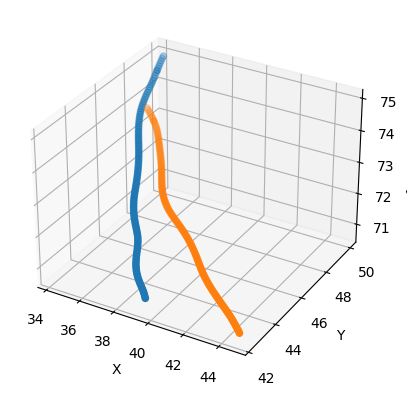

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
138
[136]
136


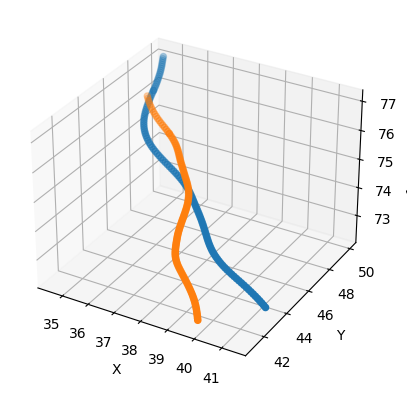

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
157
[153]
153


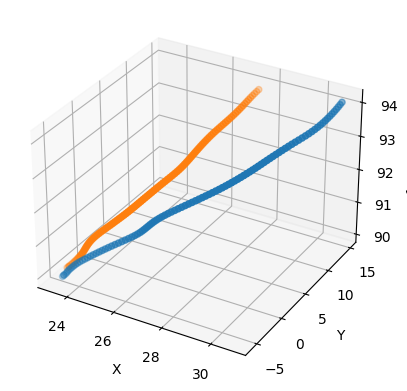

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
4.041876849053825
10000
10000
10000
10000
10000
10000
10000
3.1251601436472005
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
160
[169]
169


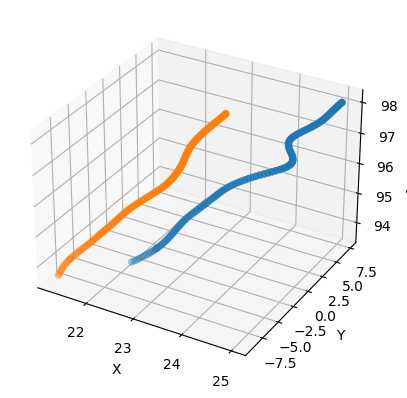

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.110000270114956
1.1135016897205274
10000
10000
1.0965202699393477
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
174
[179]
179


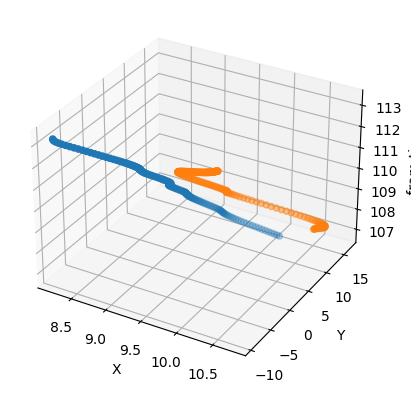

0.5687282914974647
0.5636929055356269
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.3051592434777558
0.3151144684105207
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


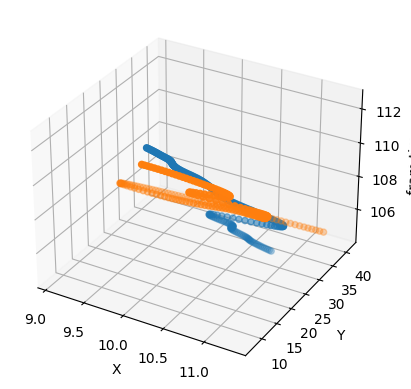

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.14279592831548527
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.0179765786198378
1.1507047276003033
1.295106382836793
1.4564059150397382
1.6245420330286886
1.791733770239631
1.9696678884609145
2.160501844218747
10000
2.4908941863472585
2.6373818623247574
2.682734649037178
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1

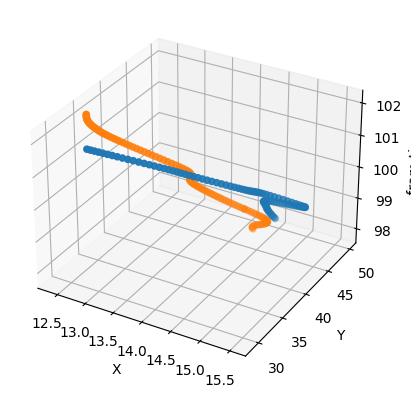

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
179
[186]
186


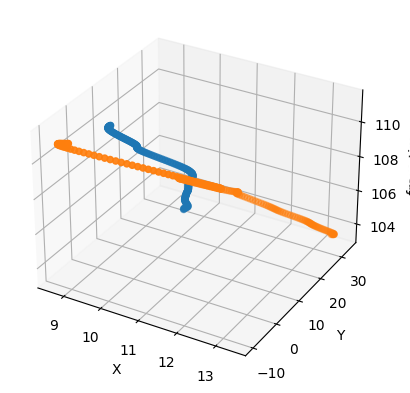

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.3801525212401953
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.4199019351490538
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.44848253748419237
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.9821538359006934
2.251187367782275
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000

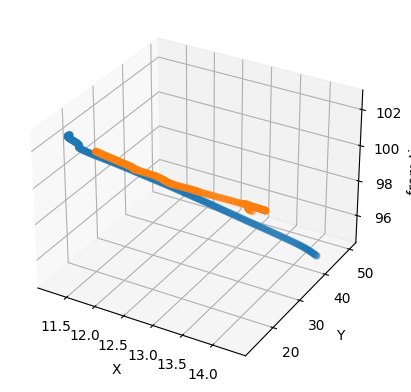

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.1571829327207556
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.7042664779260215
0.7491449558287044
0.8208360443887187
0.9430231152303229
1.1512198468288952
1.3729038599370338
1.625677011580141
1.8483297737684221
1.955608070796228
2.074848199423632
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10

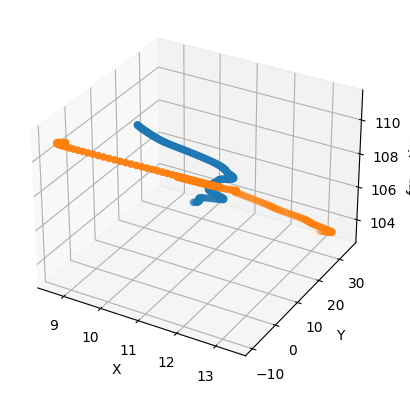

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.0213091354905814
2.039743391324723
2.0434339493749794
2.0186884225949306
1.9753308415786115
1.9074589919247296
1.8368515811711408
1.7707430498365775
1.713194686983066
1.7463279118271418
1.9098190291919133
2.279806876147713
3.1025701286206044
4.026795075217065
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.4864307968037408
0.7668520993583929
1.2812402667586726
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.24958582628687292
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.097031096453099
1.2340661333465792
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


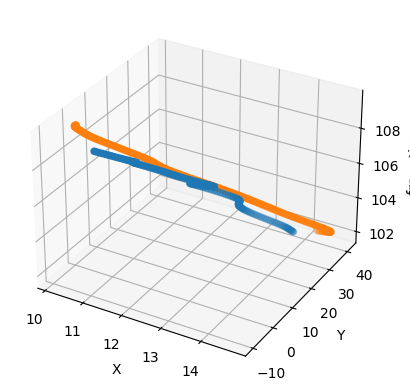

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.895794157222951
1.7657001311901184
1.5984967569815014
1.423870157255808
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.6930290814510515
0.6369591700790114
0.6020619294643159
0.5851207390151022
0.5889733898150185
0.6244585007989463
0.6807997582643719
0.7478420593379353
0.8702187885501386
1.097996952231749
1.6425437420446294
10000
10000
10000
10000
0.8308103036969733
0.7093640127185785
0.6515090850533254
0.6302054407456424
0.6356572058127994
0.6684261888701399
0.7300612355728017
0.8221373510657206
0.947489455104042
1.1295732156133012
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.0936792114180072
0.05354648495273898
10000
10000
10000
10000
10000
10000
1000

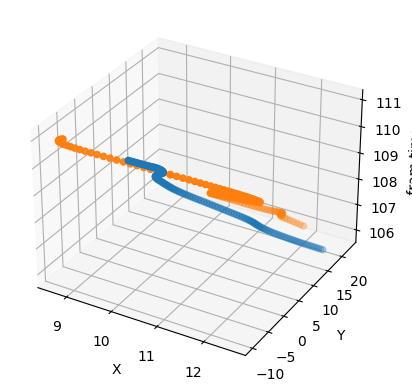

10000
10000
10000
10000
10000
2.099999370056301
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.2851512616450655
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.28894291239816905
0.2675793207116601
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.3635525615473131
0.30172576016666147
0.2478679416570375
0.19905105170914292
0.15664215037219545
0.11834733992973119
0.08050206246201501
0.042575707009017215
0.006515943735039117
0.045801094764930904
0.08366425015376883
0.12132088896652911
0.16016933504960756
0.1966966992980182
0.23008454779648269
0.2609968979687708
0.28974800486628577
0.323225906070406
10000
10000
10000
10000
10000
10000
100

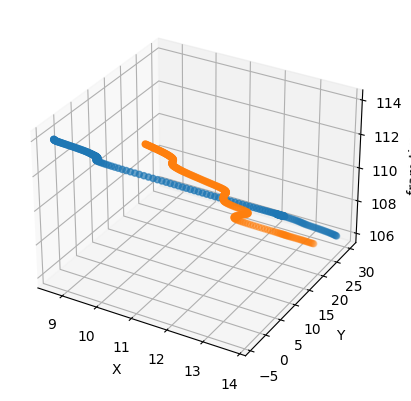

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.08622615647265407
0.06251390113832465
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.4564672953734055
1.8925089012187022
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1000

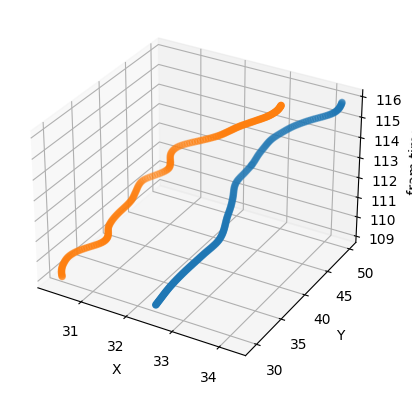

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
----

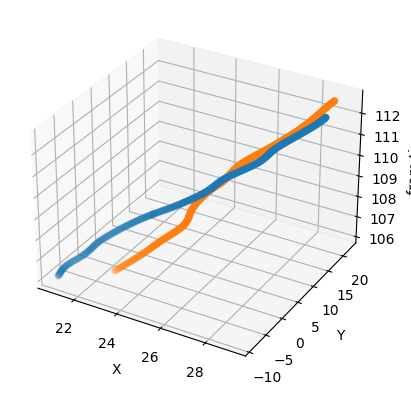

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5465573872449485
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
5.313500663233311
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.724848816117262
10000
10000
10000
---

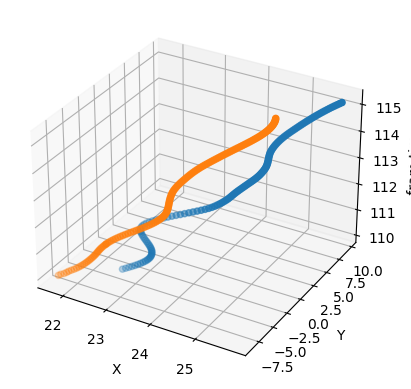

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.8472086552751297
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
217
[230]
230


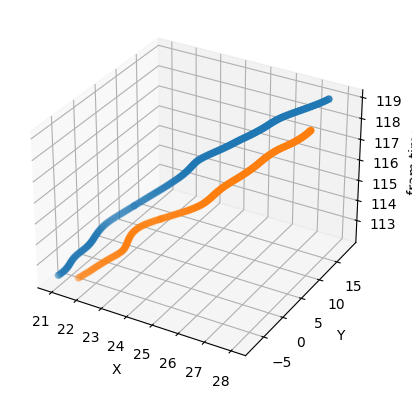

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.5591936252153653
1.6493202299538476
1.6984291535774136
1.7491021382994671
1.7874924018111542
1.8188569289111074
1.8127206509672205
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
7.4958692272455165
10000
10000
10000
10000
10000
10000
8.934177436711597
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10

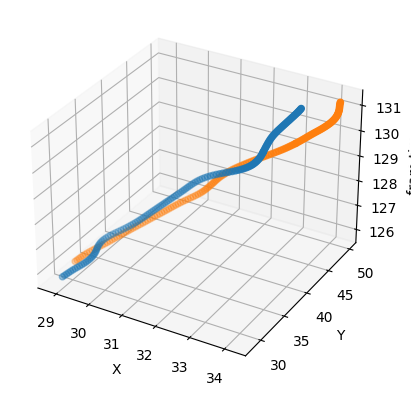

10000
10000
10000
10000
10000
8.400862354728707
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
4.9385925037930845
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
11.670609512345761
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5185572673114499
0.5153346981443746
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
237
[236]
236


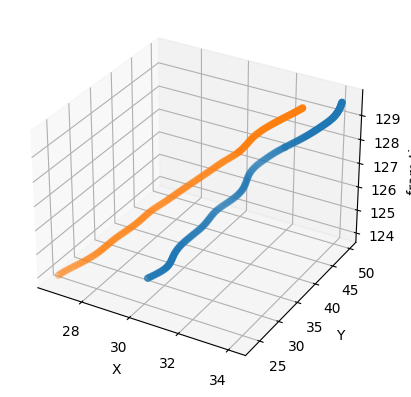

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5276997060763188
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.6762809488793871
0.7171350181944615
0.6823802604024188
10000
10000
0.6823453195469481
0.6703519998292717
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
242
[22

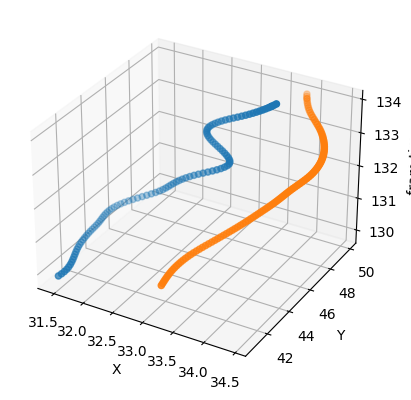

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.4945876689920774
3.1224941933083885
2.973874923457156
3.0642518873602644
3.367161300962804
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.442963708737394
10000
10000
10000
10000
10000
10000
10000
10000
2.6253327818231016
1.5102640912978569
1.1844447369181932
1.0714368381456822
1.0719460854863405
1.0886516202728302
1.072009829660426
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.47948219922899765
--------------------------------------------------------------------------
247
[230]
230


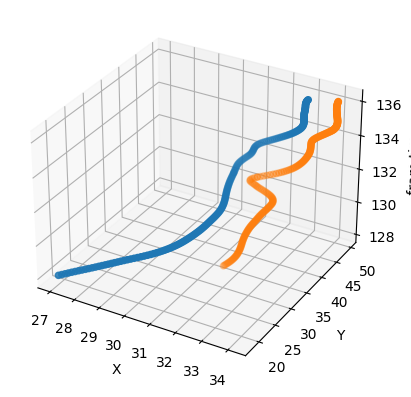

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
1.0555843217045258
1.0016115763836775
10000
10000
10000
10000
10000
10000
2.01129558593445
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.39452551695234894
0.3547715149595096
0.418261360878582
0.4570214811231791
0.49817107883458583
0.5577379693055402
0.6439453974814902
0.7400353837684984
0.8946252870205763
1.1228250297251479
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
7.389364630591362
10000
10000
10000
10000
10000
10000
3.759246052824724

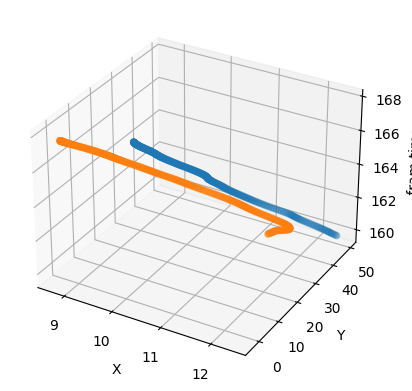

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.7506434906652726
0.7730376726598519
0.7584387693715363
0.7365408770890364
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
8.944167186143355
9.675537739233864
10000
10000
9.585247417136072
8.575300187157845
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


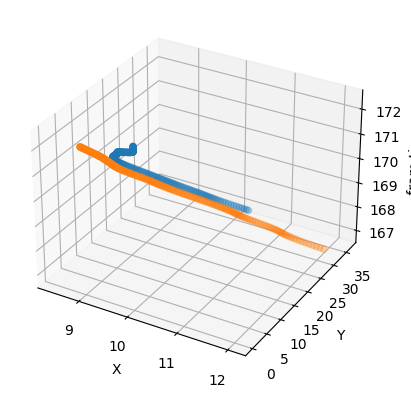

10000
10000
10000
10000
10000
5.1638095623522
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
5.453626775050736
4.81659537435547
10000
10000
10000
10000
5.3125136960031165
6.547013624029316
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.3247266416231167
0.3167319821467442
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.5052816555200628
10000
10000
10000
10000
--------------------------------------------------------------------------
395
[387]
38

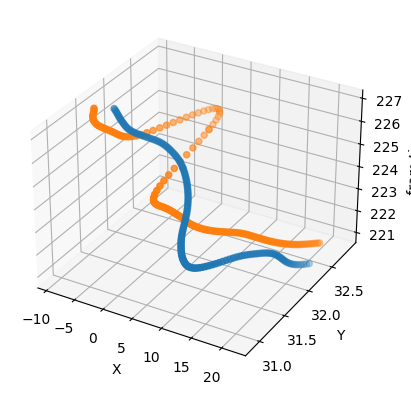

10000
10000
10000
10000
10000
2.462593477242345
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.180513852425116
1.6800802910176105
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.2156329800016192
2.9308178471485276
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.28562794234035954
0.30470070155963846
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.257301260715408
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.22586417585765173
10000
10000
10000
10000
10000
10000
10000
10000
2.117554254711658
10000
10000
1

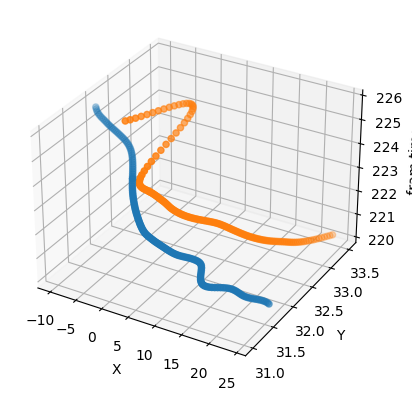

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.3699442429050994
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5146082380443071
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
391
[387]
387


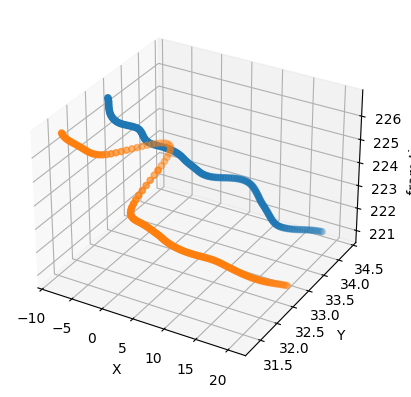

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
11.920525690283677
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.726461147313384
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.2359968397768188
0.2722437128016264
0.24909575785684324
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
-----------------------------------------------------------------------

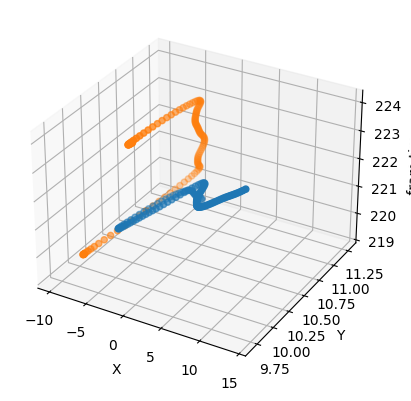

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.23741507672011827
0.21903472116167175
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.44165234498119793
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
--------------------------------------------------------------------------
420
[415]
415


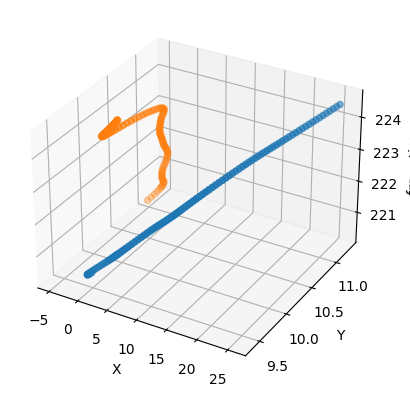

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
--------------------------------------------------------------------------
452
[448]
448


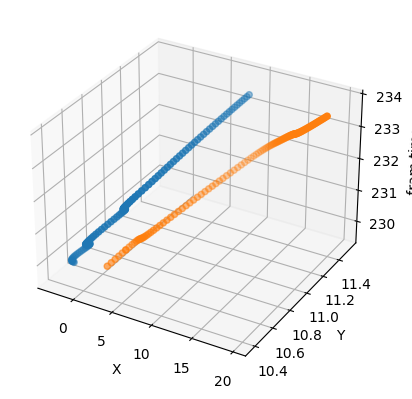

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.1431304785195033
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
470
[453]
453


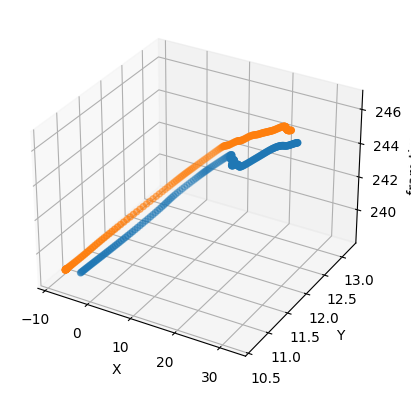

0.40231756619533426
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
6.604818579138366
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
9.859504802578694
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10

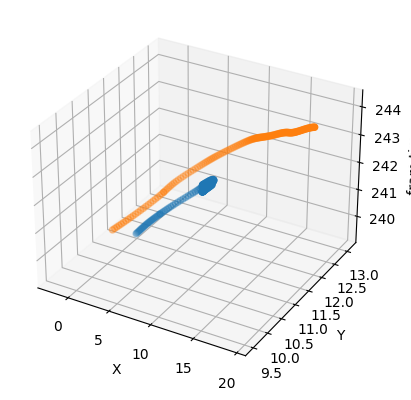

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.117346819733102
10000
10000
10000
10000
10000
10000
5.517807571664913
10000
10000
10000
10000
13.450630814176511
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
588
[574]
574


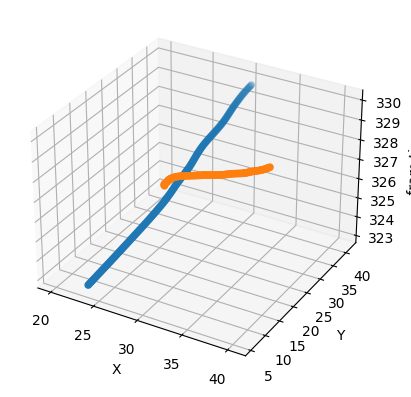

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.4698119895712773
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
9

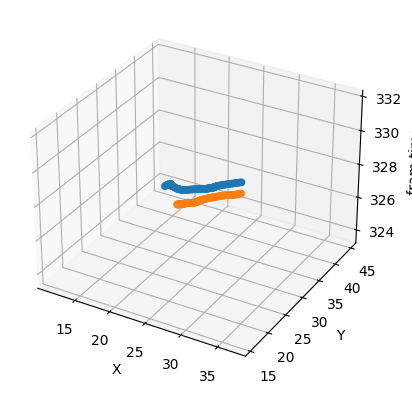

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
5.567091709604716
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.8195248554903336
10000
10000
10000
10000
10000
10000
10000
10000
4.079577960106179
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.34442619469221014
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
4.07865675596604
10000
10000
10000
10000
10000
10000
10000
10

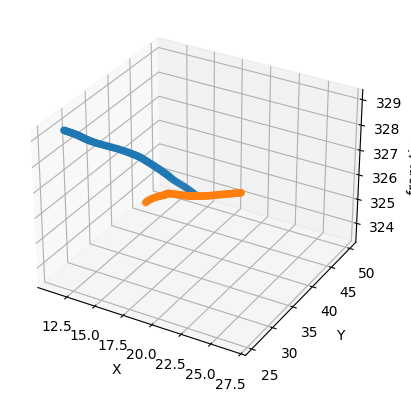

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5734384885303628
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
--------------------------------------------------------------------------
596
[599]
599


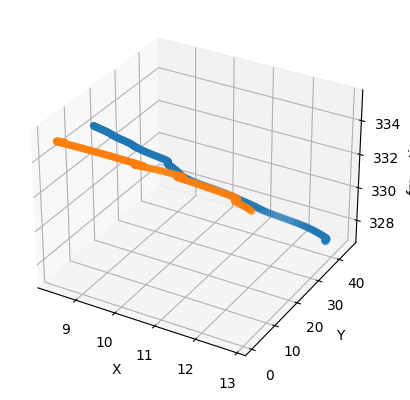

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
6.28741851009602
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.3826780986463596
1.6912933712389773
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.4669504751473185
0.40744330418259533
0.3614421948578395
0.3214369347160313
0.2846954491620541
0.2538625925979871
0.22704817670091842
0.20045311372181546
0.17213288880750546
0.14243228418545958
0.1122334530609145
0.08185602051013953
0.0515469098501869
0.01974959678228372
0.014784537418452136
0.05200254105908383
0.043887971705354516
0.12438810756726536
0.2623301906718555
0.5192889379118552
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


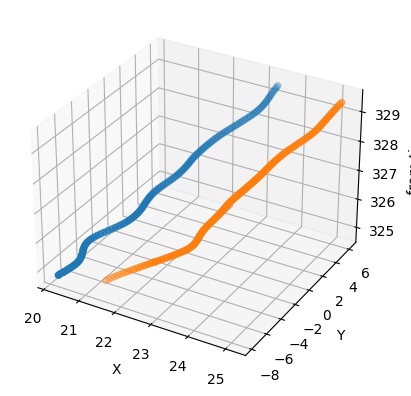

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.9304204202848126
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
5.33947878485284
10000
10000
10000
7.2911336768619055
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
24.354244819633763
10000
10000
10000
28.83915914217972
10000
10000
10000
10000
18.012092201494298
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
607
[593]
593


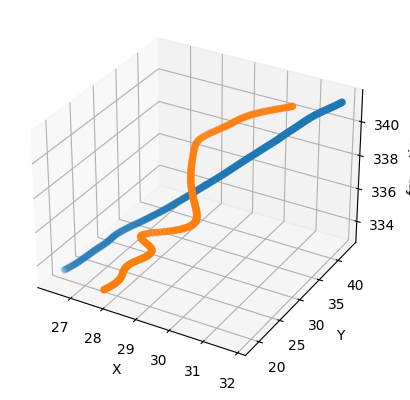

10000
10000
10000
10000
10000
10000
10000
10000
10000
6.517954311554537
5.597787873484008
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
4.702700119132018
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5386142641810792
0.5017399746277181
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10

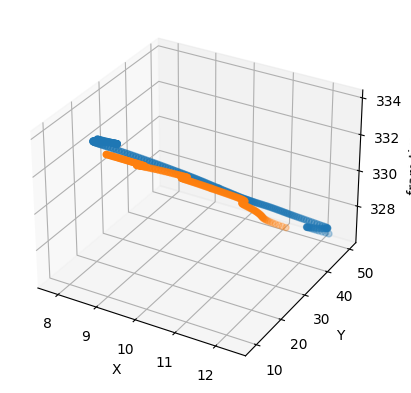

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.7836961389344393
0.8315122999322916
0.8321287945734028
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.5301671409682795
1.6425247306217707
1.6517275160294564
1.587945549515616
1.4925076857551214
1.3851408882597642
1.246218559395727
1.0954510154706287
0.9492733312028365
0.8175402431586142
0.7175617580808114
0.643790424406517
0.5873492220183721
0.546178630564767
0.5110379043555093
0.47989702712246424
0.4572987066309231
0.4416563159983952
0.43690800321918843
0.4436255271591
0.4487784179051225
0.45743512246663665
0.47472520101444327
0.499883868095153
0.5656373530436349
0.7244483313072915
1.0406437130417834
10000
10000
10000
10000
10000
10000
3.5909008083732505
4.325728464285469
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.036118149300466584
0.07659345725766006
10000
10000
10000
10000
10000
10000
10000
10

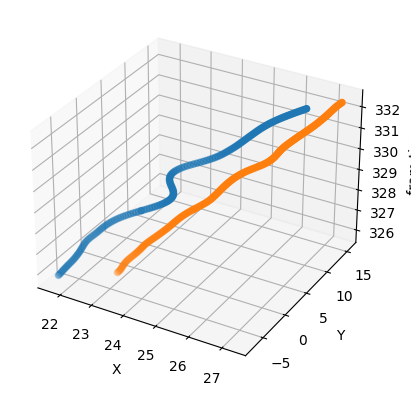

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.4097906594493633
10000
10000
10000
10000
10000
0.46894512600502136
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.44889340606830463
0.44829218637676366
10000
10000
100

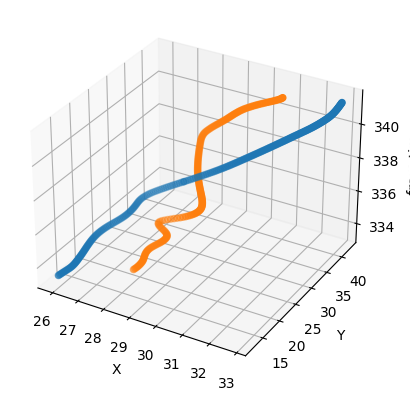

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.747232961846765
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.46252183471131275
0.46836268018693333
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.8902029959606208
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.21495638594977776
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
100

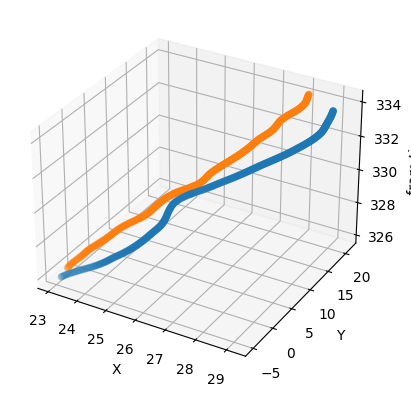

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
5.3277485588321225
5.392910856623043
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
100

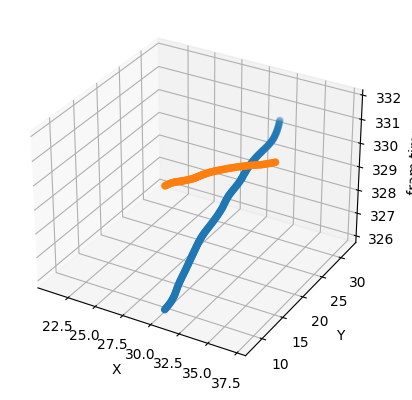

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5289863002630145
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
627

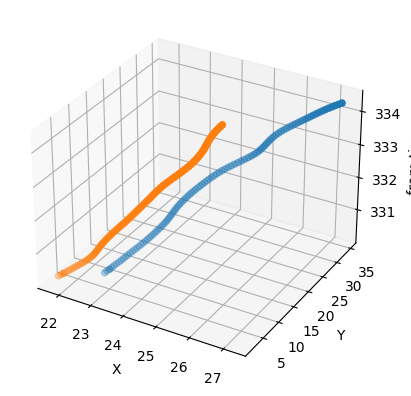

10000
10000
0.36803871840165675
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.399193690866724
3.5436210168141087
3.470121517818225
3.48940772860271
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
--------------------------------------------------------------------------
605
[593]
593


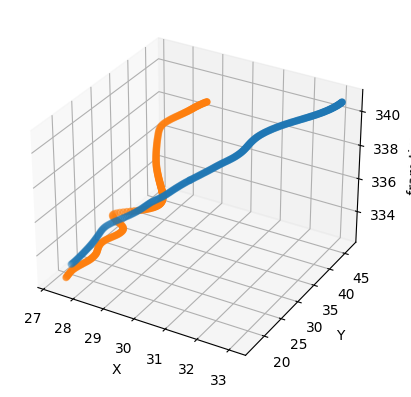

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.8410352742677475
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
100

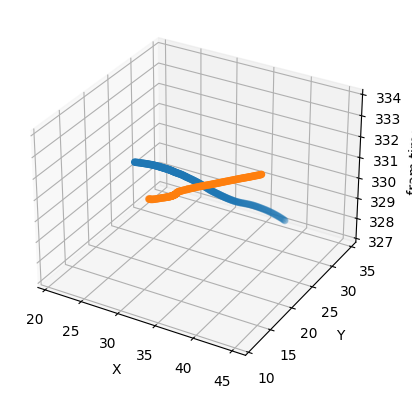

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.48089930851094226
0.4371465325433447
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
99

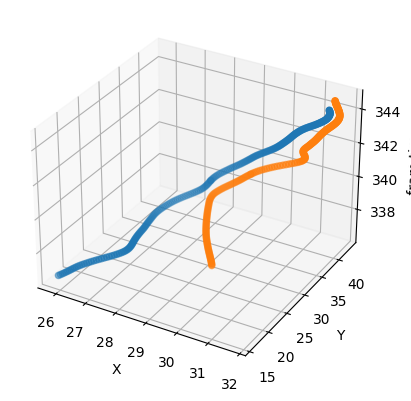

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
1.4568464472621203
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.59075494084667
3.3345375747660406
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.3345544303903933
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.1271897072133505
10000
10000
10000
10000
10000
10000
10000
10000
3.428331408959189
3.2822207402391372
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.6660592665678319
0.6533156680665605
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
100

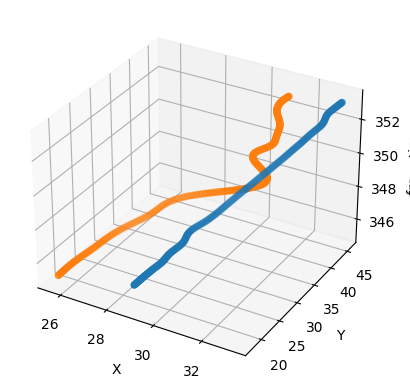

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.7558448501470785
1.6018202133851918
1.4536888755661053
1.2969786741925422
1.1519622280483375
1.0379379972632812
0.9502008780451137
0.8759441873980112
0.8130731305482441
0.7525059740641118
0.6938167957538953
0.6376830170989908
0.5827978310428803
0.5318680297107089
0.48479858924548946
0.4396834812544802
0.39713499076465913
0.3565830345574168
0.31698686661883696
0.2794889450707118
0.24380223013069804
0.20826652752921254
0.17298993217896122
0.13734794951325893
0.10089006226930584
0.06458623917356598
0.028022382305597667
0.034366415584224416
0.011301813972241

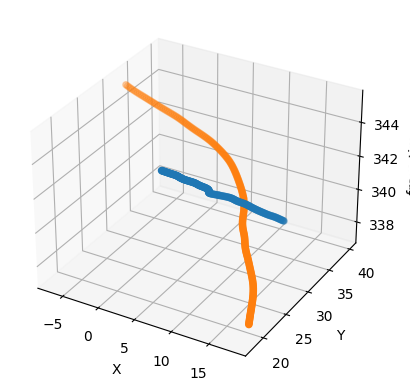

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.6889043085655217
0.6953601755798751
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999

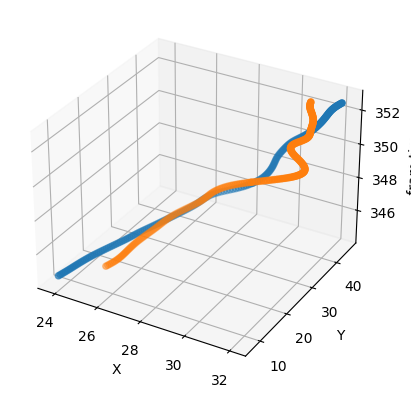

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5637582178081963
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.369798838954729
3.0132837343605776
2.8809049502975723
2.812939751766842
2.7820372967810223
2.6282147092134567
2.3707703496961847
2.179654339497681
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.4893247763270365
1.3159000601568527
1.2104950992795345
1.167027209256691
1.1544190980860365
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.31199743750678494
0.26090621948889375
0.21001328341379857
0.15966740280510344
0.11321601883373993
0.06941663085823878
0.01081366836087245
0.050280270892774
0.08758704618821359
0.12230163922526092
0.1538208770593317
0.18520017684417933
0.21805206926587975
0

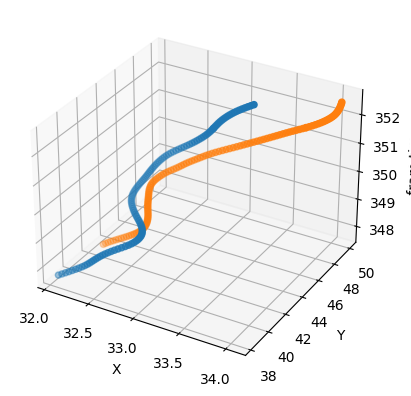

10000
10000
10000
10000
10000
2.9373007365231754
10000
10000
10000
10000
10000
10000
10000
10000
3.966910418595838
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.891937158598677
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.7823047439592699
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
678
[666]
666


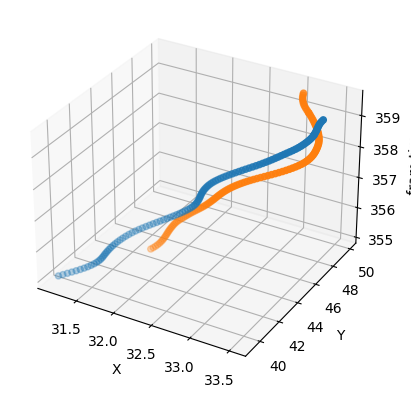

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.362652740035875
1.5164772167298628
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.9532069232687457
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5406291377636406
0.5829652615268767
0.6105401930660461
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
702
[692]
692


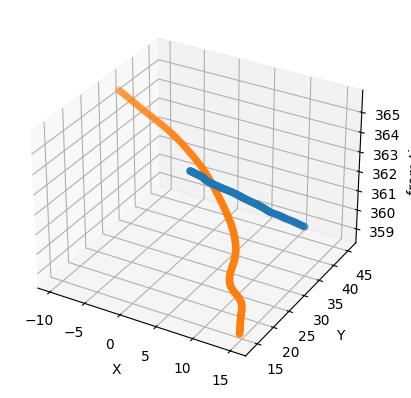

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.661393442136594
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999


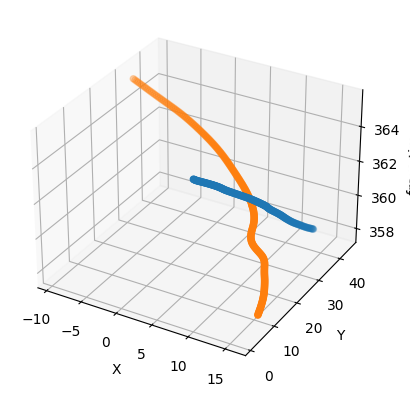

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.4838388831971032
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
99

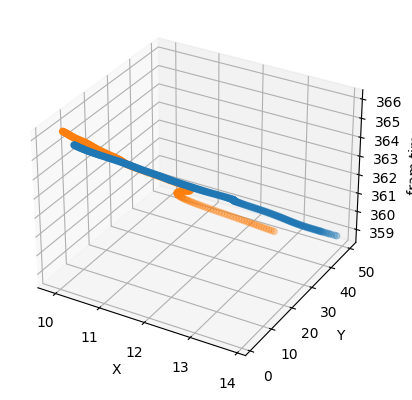

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.9284631184818259
0.9705649170486443
1.036131102112272
1.120239980331562
1.2233573622237737
1.3548195899749789
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


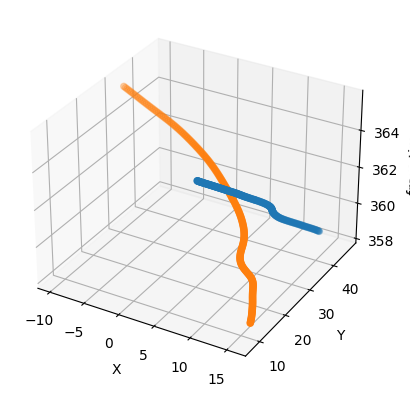

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.495551046640557
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
9

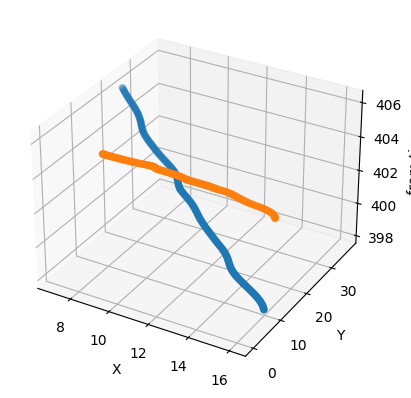

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.7770107148255223
0.7747649769777569
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999

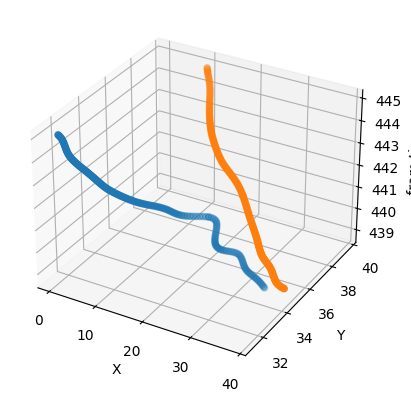

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.7121654393430792
0.6478175289271645
0.6630243585573111
0.6976709339334433
0.7536518996064301
0.8310256405371778
0.9307829700859447
1.074055750685785
1.2859559833761913
1.559970347662481
1.890045140709705
2.2874890445908997
2.7104349051718
3.096498671414394
3.3713392160760716
3.342076295636598
10000
10000
10000
10000
10000
2.1243004195041992
2.040694370074061
1.9931215715193338
1.9630779933153863
1.9479788003756882
1.9643867546773897
2.0161650377120224
2.1059832511676095
2.214363554625942
2.33095224000105
2.4714342173902075
2.5841815832144546
2.694329222764126
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


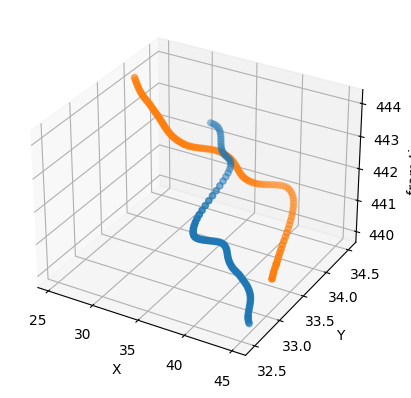

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.513840445180339
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.1443785497652739
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
--------------------------------------------------------------------------
958
[964]
964


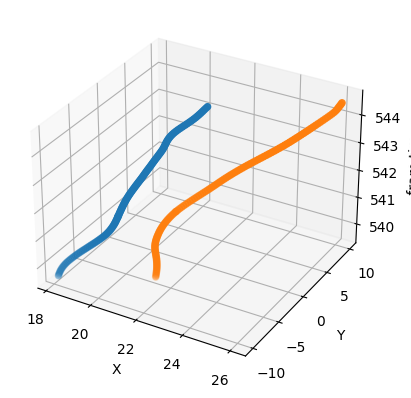

10000
10000
10000
10000
10000
10000
10000
10000
3.3294045529451473
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.977784040928364
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
968
[971]
971


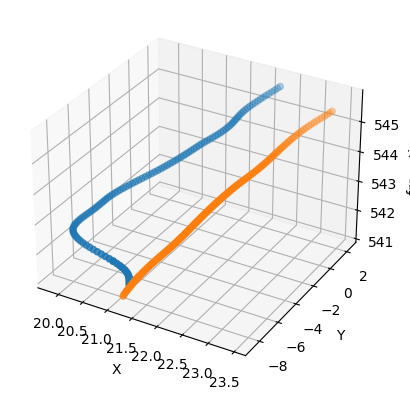

10000
10000
10000
10000
10000
10000
10000
10000
0.44449666436935686
0.4715478103035169
0.4536105198776091
0.42767852341576323
0.39903780703111047
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
--------------------------------------------------------------------------
982
[983]
983


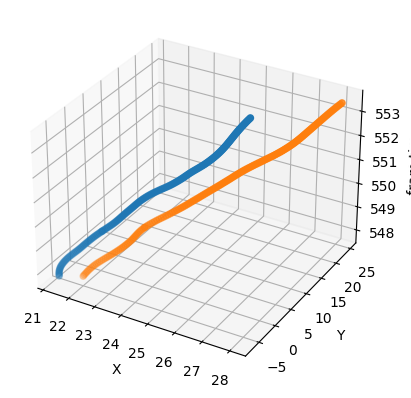

10000
10000
10000
10000
1.157024034946595
1.1855667833421417
1.2394999596829797
1.3172986191019307
10000
10000
10000
10000
1.5699436437246264
1.8795625264737765
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.493126683206304
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
---------------------------------------------------------

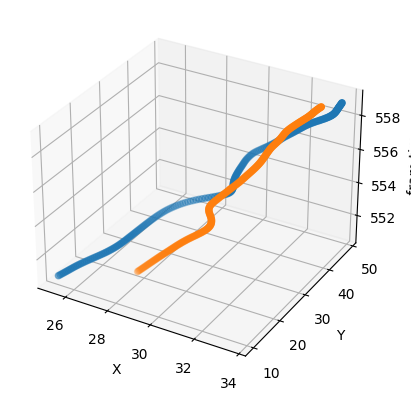

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.05647552864298393
0.07196574719597178
10000
10000
10000
10000
10000
10000
0.3148191810372947
0.40305774614559425
0.49358475288851633
0.5749997841120766
0.6603332155558104
0.7511022786704653
0.8194133866841218
0.8849161133213975
0.9432856899380562
0.989745327973218
1.0463126940656122
1.1165810993470744
1.1809071528498678
1.2437925426537784
10000
1.303574818825237
10000
10000
10000
10000
10000
10000
10000
100

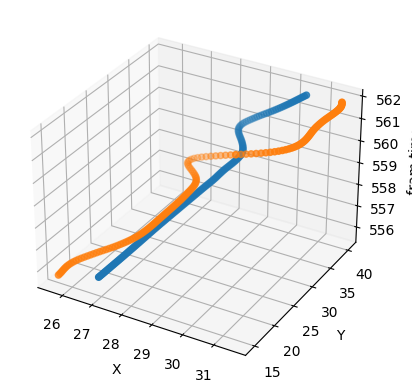

10000
10000
10000
10000
10000
10000
10000
7.9583219939301655
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.3256652253092738
0.3524454835464873
0.3821903757274854
0.4164252853017442
0.47956466042912593
0.5930711000864507
0.8123190505686678
10000
10000
10000
1.1310799631171151
0.5940894084112432
0.3687596469791191
0.24678930345597663
0.17079036331527733
0.11960670037046446
0.0717870103824903
0.024571054948599014
0.01904791712250117
0.030624267530840684
0.04451174432455829
0.07983570964258892
0.11386487621164772
0.14897933033667027
0.18608974397139713
10000
10000
10000
10000
10000
10000
10000
10000
10000
100

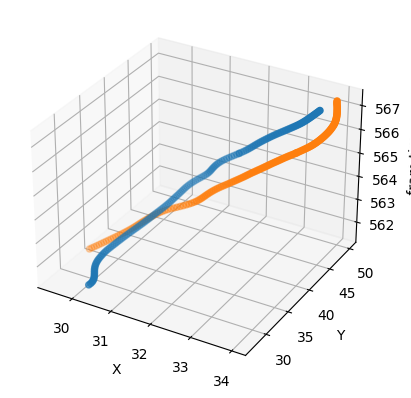

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5041286112903578
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.5506144766382244
0.5558131474601112
10000
--------------------------------------------------------------------------
993
[971]
971


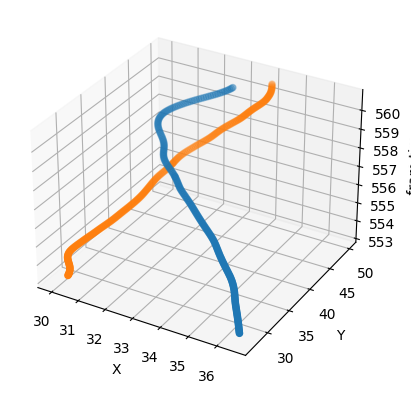

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
8.771759386500726
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
4.293344091353208
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1000

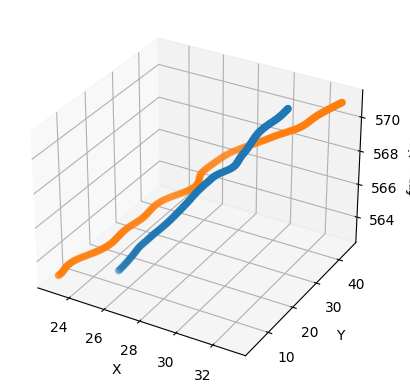

10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
2.4217583059283982
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.6844581203195292
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.9357320486891917
10000
10000
10000
10000
10000
10000
0.7157939251150803
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1.2293832786868901
1.2087431954317283
1.2199446508738763
1.270012502112922
1.3599739616178255
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10

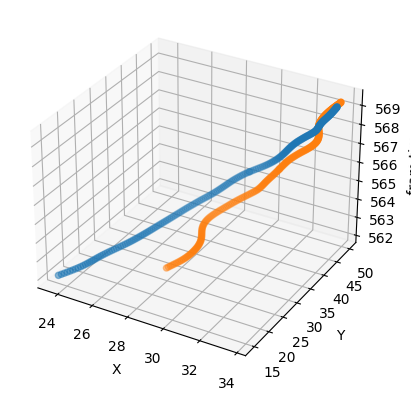

999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.09797322996185
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.48491669153163564
0.5155671214988403
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
1

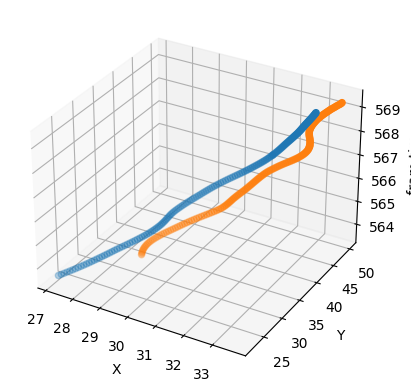

999999
999999
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.9560695481987442
0.9785014112748556
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
3.56855221370884
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
0.9064778930893729
0.9594150634818746
1.0194035644866795
1.0930297718246684
1.1784009316400545
1.2116842967554016
1.2517449952890427
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000
10000


In [ ]:
data_path = r'/content/drive/MyDrive /Colab Notebooks/Traffic_Conflict/dataset/conflict_indector/Conflict_event_car_ebike_c0007.csv'
car_conflict_event = pd.read_csv(data_path)
Veh_id = pd.unique(car_conflict_event['m_vehicle_id'])
time_gap = 0.04
for conflict_veh_id in Veh_id:
  print('--------------------------------------------------------------------------')
  print(conflict_veh_id)
  Traj_first_veh = car_conflict_event[car_conflict_event['m_vehicle_id']==conflict_veh_id]
  sub_veh_idd = pd.unique(Traj_first_veh['sub_vehicle_id'])
  print(sub_veh_idd)
  sub_veh_id = sub_veh_idd[0]
  print(sub_veh_id)

  motion_frame_time =  Traj_first_veh['frame_time']
  FIG = shown_trajectory(Traj_first_veh)
  plt.show()
  for frame_tiem_id in motion_frame_time:
    # the vehicle state 
    # print(frame_tiem_id)
    # print(motion_frame_time.values[-1])
    if frame_tiem_id < motion_frame_time.values[-1]:
      First_Veh_state = First_Veh_motion_state(Traj_first_veh,conflict_veh_id, frame_tiem_id) 
      Second_veh_state = Second_Veh_motion_state(Traj_first_veh,sub_veh_id,frame_tiem_id)
      # first vehicle motion parameters
      Speed_First_veh = Speed_Caluca(First_Veh_state,time_gap)
      Line_parmeter_first = First_Montion_Equations(First_Veh_state)
      # second vehicle motion parameters
      Speed_second_veh = Speed_Caluca(Second_veh_state,time_gap)
      Line_parmeter_second = Second_Montion_Equations(Second_veh_state)    
      'Calculate the cross point'
      cross_point = Point_of_cross(Line_parmeter_first, Line_parmeter_second)
      # if there are no cross points, we should stop the next step
      if len(cross_point) != 0:
        'calculate the PET'
        conflict_pet = PET(cross_point, Speed_First_veh, Speed_second_veh, First_Veh_state, Second_veh_state)
        'Calculate the TTC'
        conflict_TTC = TTC(cross_point, Speed_First_veh, Speed_second_veh, First_Veh_state, Second_veh_state)


        # creat a list which contain the vehicle information and the PET at every frame
        # Sub_veh_id_A.append(Sub_veh_id)
        # cross_point_B.append(cross_point.values[0])
        # PET_C.append(conflict_pet)
        # TTC_C.append(conflict_TTC)
        print(conflict_TTC)